<a href="https://colab.research.google.com/github/drcolula/mtypollution/blob/master/raw_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Requirements

In [ ]:
#Install libraries
!pip install verde
!wget https://raw.githubusercontent.com/oarriaga/RBF-Network/master/RBFN.py
!wget https://raw.githubusercontent.com/paulbrodersen/inverse_distance_weighting/master/idw.py
!wget https://raw.githubusercontent.com/drcolula/mtypollution/master/idwexp.py

In [ ]:
#Import libraries

import matplotlib.pyplot as plt
import numpy as np
import geopy.distance
import plotly.express as px
import statsmodels.api as sm
import idw
import idwexp
import pandas as pd
import seaborn as sns 
import verde as vd
import random
%tensorflow_version 2.x
import tensorflow as tf

import sklearn
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import Pipeline
from statsmodels.tsa.ar_model import AR
from statsmodels.graphics.tsaplots import plot_pacf,plot_acf,acf,pacf
from statsmodels.tsa.stattools import adfuller
from xgboost.sklearn import XGBRegressor

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from keras.callbacks import ModelCheckpoint, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

import seaborn as sns
%matplotlib inline
 
from RBFN import RBFN
from math import sqrt
from itertools import product,permutations,combinations
pd.set_option('display.max_rows', 100)

#ETL

In [ ]:
!git clone https://github.com/drcolula/mtypollution.git

In [ ]:
#Transform to Pandas Data Frame
_data = np.load('mtypollution/_data.npy')
_date = np.load('mtypollution/_date.npy',allow_pickle=True)
dates=pd.DatetimeIndex(_date)
ds={}
for x in range(1,9):
        ds["s{0}".format(x)]=pd.DataFrame(_data[:,x-1,:],columns=['PM10', 'PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'],index=dates)
pm10=pd.DataFrame()
for key in ds:
    pm10[key]=ds[key]['PM10']

# Mapbox Token

In [ ]:
#For running maps, it is required an access token from mapbox at https://account.mapbox.com/
mapboxtoken=''

# Exploratory Data Analysis

## Dataset Overview

In [ ]:
#Station locations and known points in map
station_position=[0]*10
station_position[0] = [25.668366, -100.249512]
station_position[1] = [25.742053, -100.266144]
station_position[2] = [25.676027, -100.335939]
station_position[3] = [25.757178, -100.365981]
station_position[4] = [25.675702, -100.464958]
station_position[5] = [25.783503, -100.585897]
station_position[6] = [25.802037, -100.343083]
station_position[7] = [25.777312, -100.187950]

# Airport
station_position[8] = [25.778042, -100.119442]
# Tec
station_position[9] = [25.651501, -100.292078]

pos=pd.DataFrame(station_position,columns=['lat','lon'])
px.set_mapbox_access_token(mapboxtoken)
fig=px.scatter_mapbox(pos,lat='lat',lon='lon')
fig.show()


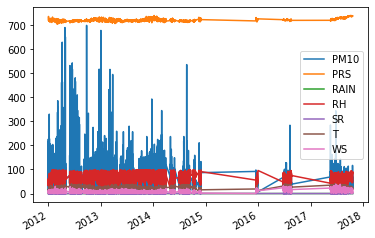

In [ ]:
#Plotting all variables in a datasets let us view that there is missing data
ds['s1'].plot()

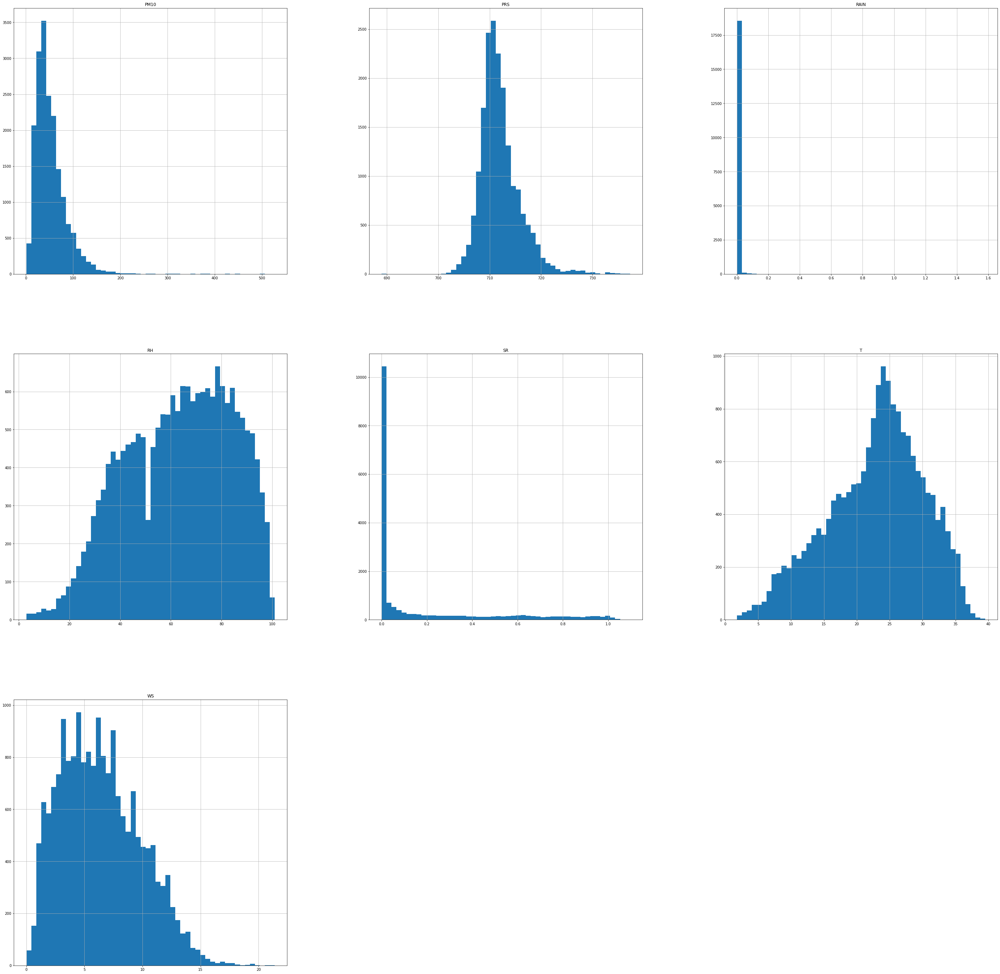

In [ ]:
#Distributions of each variable in a station, there appears to be outliers
ds['s3'].hist(figsize=(50,50),bins=50);

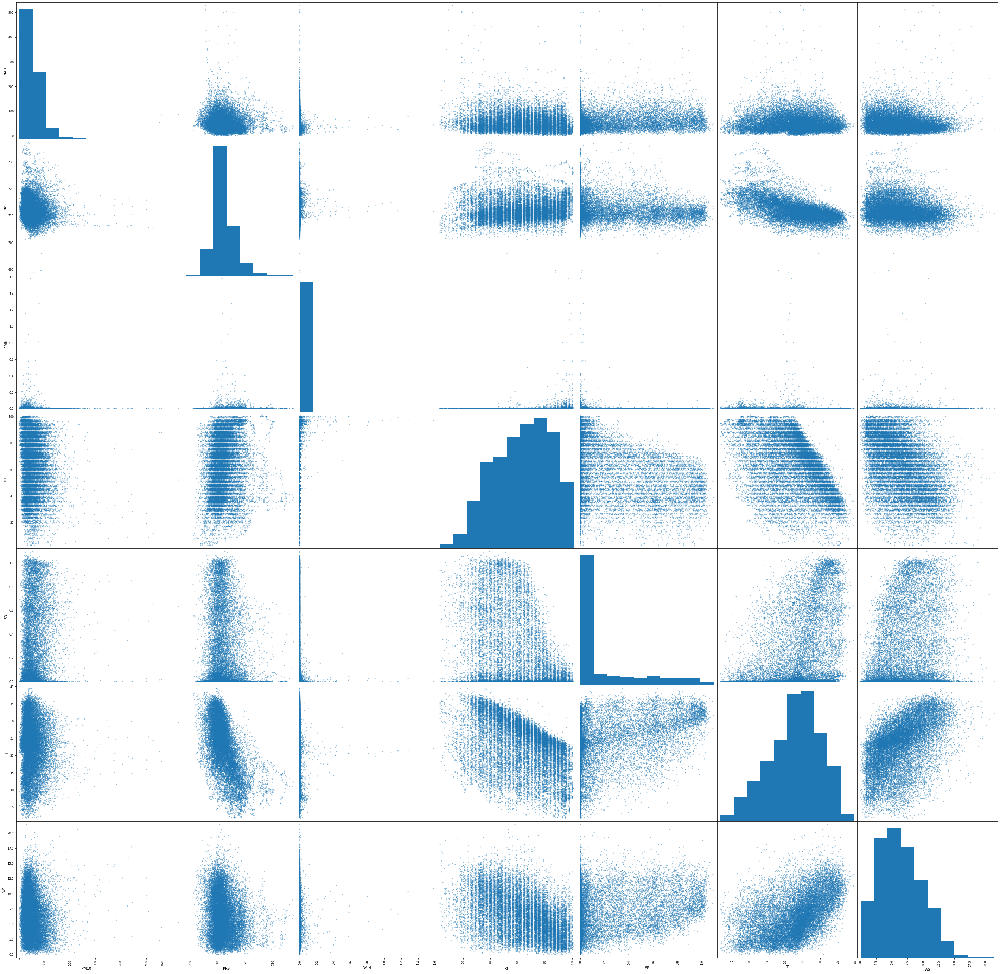

In [ ]:
#Correlation matrix between variables in a station
pd.plotting.scatter_matrix(ds['s3'],figsize=(50,50));

In [ ]:
for key in ds:
    pd.plotting.scatter_matrix(ds[key],figsize=(50,50));

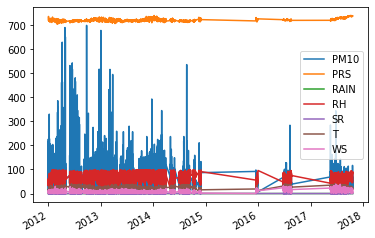

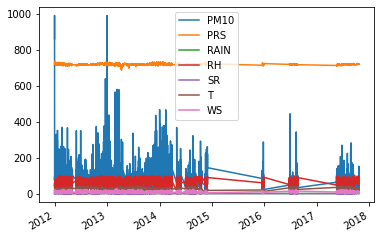

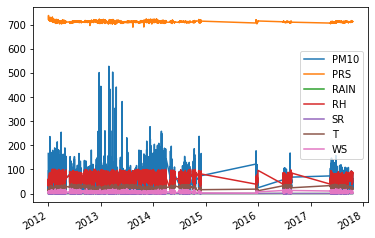

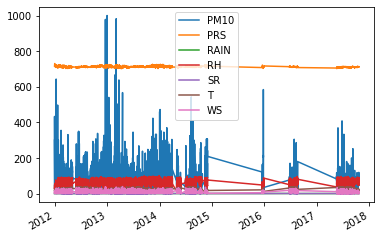

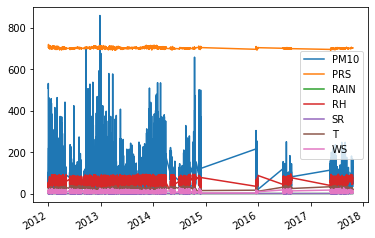

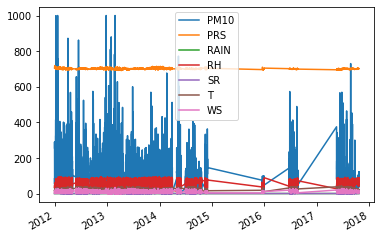

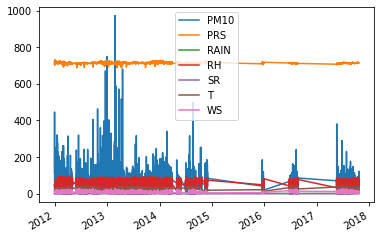

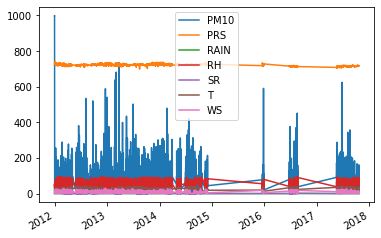

In [ ]:
#Plotting all stations reveals that the missing data is in all stations
for key in ds:
    ds[key].plot()

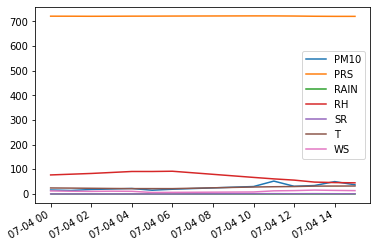

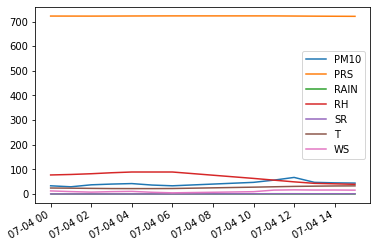

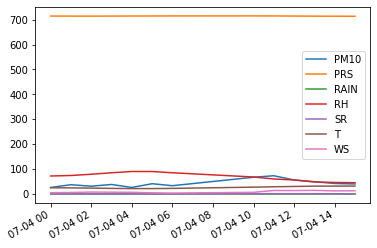

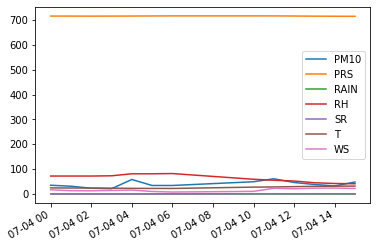

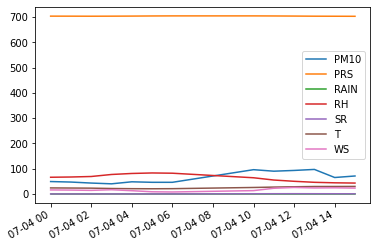

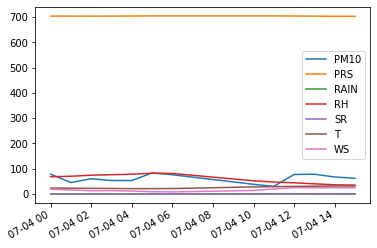

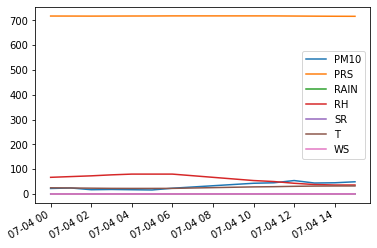

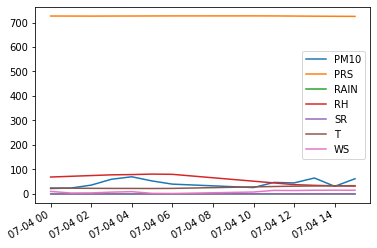

In [ ]:
#Plot of all stations in a day
for key in ds:
    ds[key]['2014-07-04'].plot()

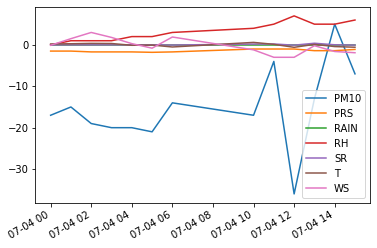

In [ ]:
#Plotting difference between two stations at the same day
d1=(ds['s1']['2014-07-04'])-(ds['s2']['2014-07-04'])
d1.plot()

## Target Variable Analysis (PM10)

In [ ]:
#Create dataset with the PM10 values for each station
pm10=pd.DataFrame()
for key in ds:
    pm10[key]=ds[key]['PM10']

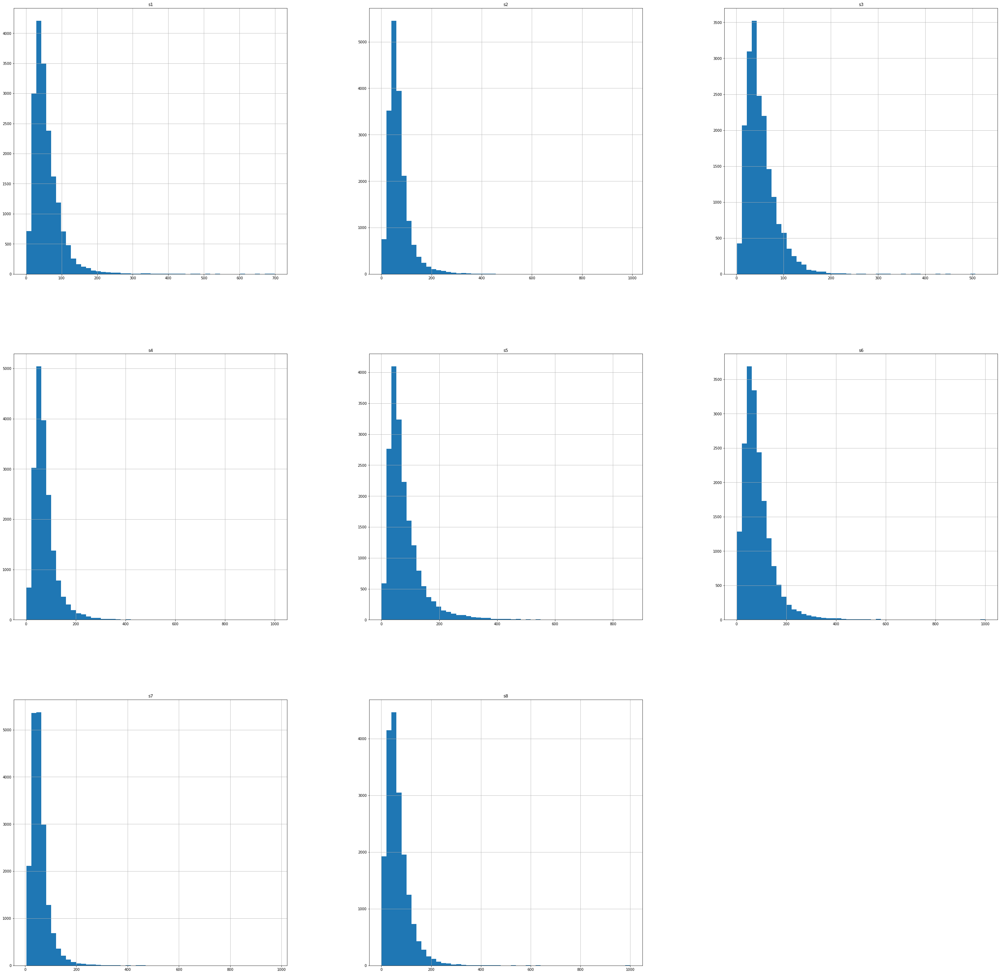

In [ ]:
#Distribution of the target variable for each station
pm10.hist(figsize=(50,50),bins=50);

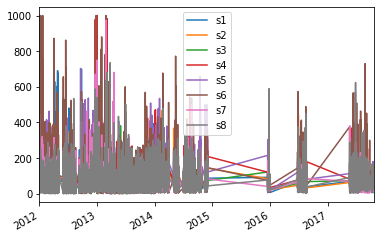

In [ ]:
#Plot of all stations
pm10.plot()

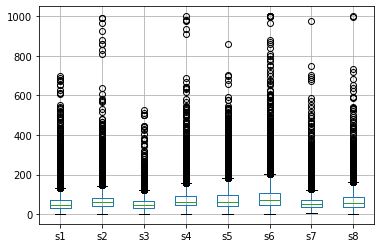

In [ ]:
#Outliers
pm10.boxplot()

In [ ]:
#Count of outliers
pm10[pm10>400].count()#plot(figsize=(50,10))#hist(figsize=(50,50));

s1     40
s2     32
s3     11
s4     49
s5     76
s6    108
s7     25
s8     30
dtype: int64

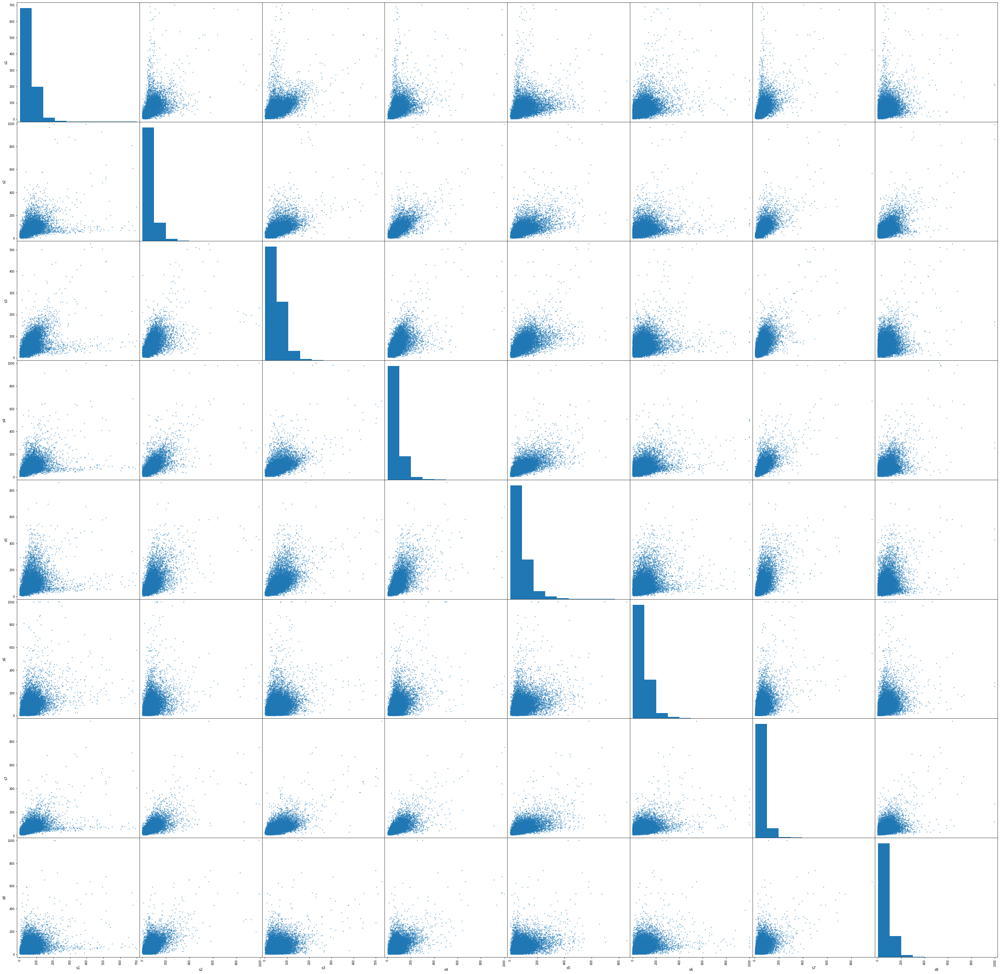

In [ ]:
#Correlation matrix between stations
pd.plotting.scatter_matrix(pm10,figsize=(50,50));

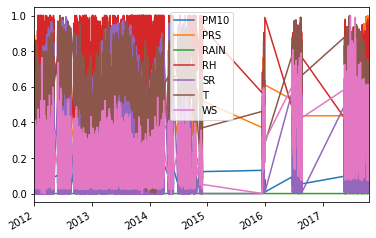

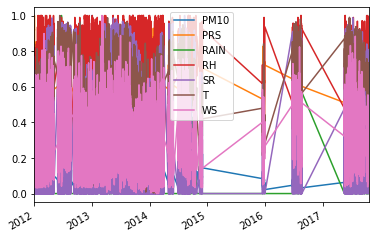

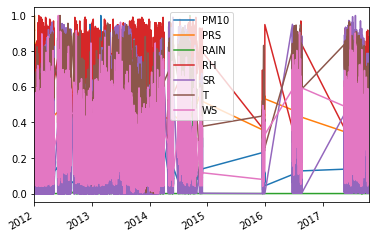

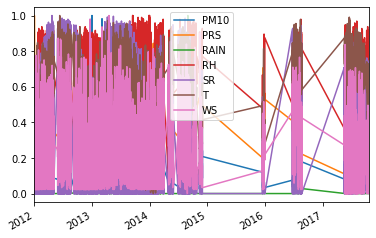

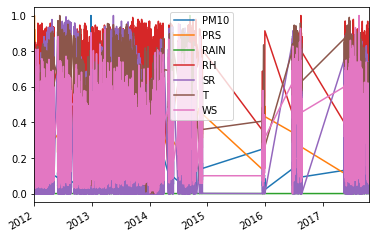

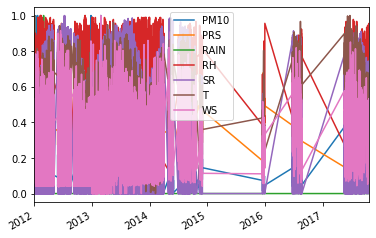

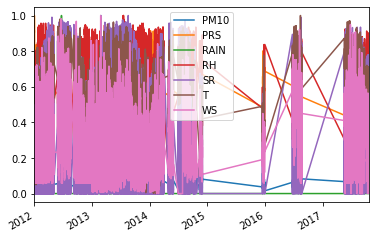

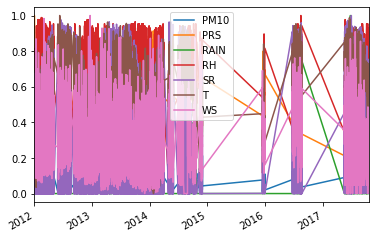

In [ ]:
#Plotting normalized data
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
s1e=scaler.fit_transform(ds['s1'])
for key in ds:
    pd.DataFrame(scaler.fit_transform(ds[key]),columns=['PM10', 'PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'],index=dates).plot();

# Lag Analysis

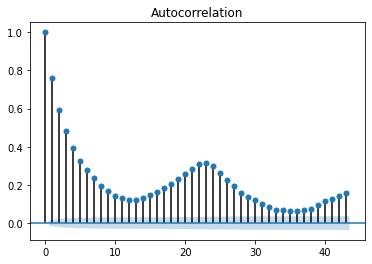

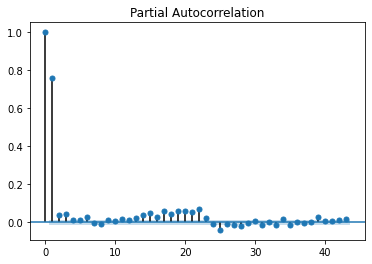

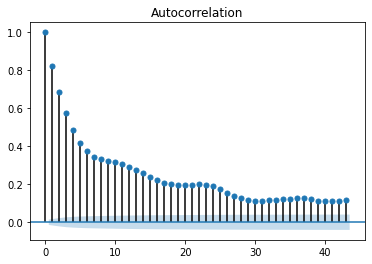

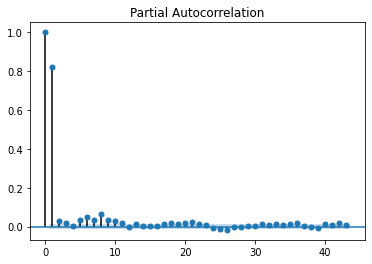

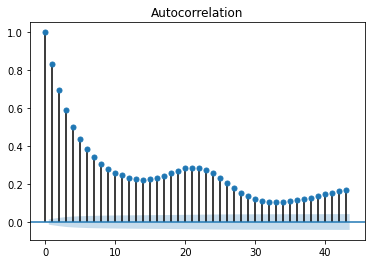

...

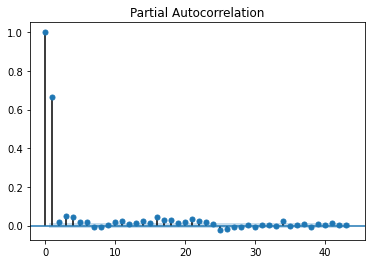

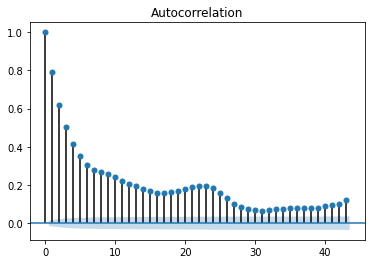

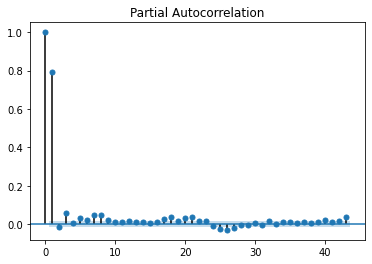

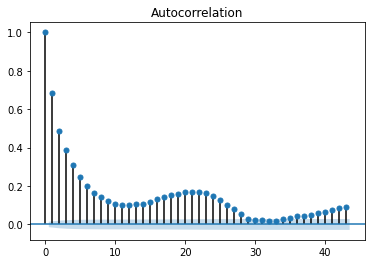

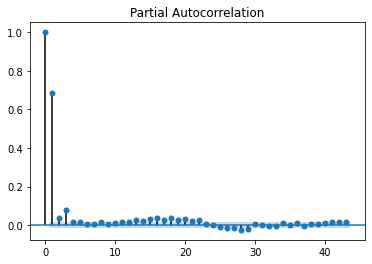

In [ ]:
#ACF and PACF for lag definition
def acfpacf(df):
    plot_acf(df)
    plot_pacf(df)
for key in pm10:
    acfpacf(pm10[key])

In [ ]:
#AR Model for a station with 1 lag
model = AR(df)
model_fit = model.fit(maxlag=1)
print('Coefficients: %s' % model_fit.params)

Coefficients: const    8.837843
L1.s3    0.830570
dtype: float64


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



Coefficients: const   -0.004580
L1.y     0.006730
L2.y     0.003194
dtype: float64


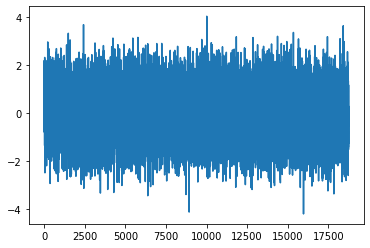

In [ ]:
#AR Model with random values for comparison
random.seed(1234)
z=pd.Series([random.gauss(0.0, 1.0) for i in _date])
z.plot()
model = AR(z)
model_fit = model.fit(maxlag=2)
print('Coefficients: %s' % model_fit.params)

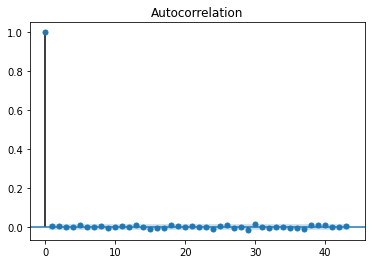

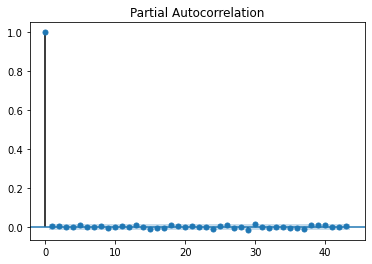

In [ ]:
#ACF and PACF of random values for comparison
acfpacf(z)

In [ ]:
#Lag Values calculated from ACF and PACF
lag=pd.DataFrame(columns=['s1','s2','s3','s4','s5','s6','s7','s8'])
for key in ds:
    i=0
    for col in ds[key]:
        print(key+col+'lag: '+str(np.min([((np.abs(acf(ds[key][col]))>0.5)*1).sum(),((np.abs(pacf(ds[key][col]))>0.5)*1).sum()])))
        i=i+1
        

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:541: FutureWarning:

fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.



s1PM10lag: 2
s1PRSlag: 2
s1RAINlag: 1
s1RHlag: 2
s1SRlag: 2
s1Tlag: 2
s1WSlag: 2
s2PM10lag: 2
s2PRSlag: 2
s2RAINlag: 1
s2RHlag: 2
s2SRlag: 2
s2Tlag: 2
s2WSlag: 2
s3PM10lag: 2
s3PRSlag: 2
s3RAINlag: 1
s3RHlag: 2
s3SRlag: 2
s3Tlag: 2
s3WSlag: 2
s4PM10lag: 2
s4PRSlag: 2
s4RAINlag: 1
s4RHlag: 2
s4SRlag: 2
s4Tlag: 2
s4WSlag: 2
s5PM10lag: 2
s5PRSlag: 2
s5RAINlag: 1
s5RHlag: 2
s5SRlag: 2
s5Tlag: 2
s5WSlag: 2
s6PM10lag: 2
s6PRSlag: 2
s6RAINlag: 1
s6RHlag: 2
s6SRlag: 2
s6Tlag: 2
s6WSlag: 2
s7PM10lag: 2
s7PRSlag: 2
s7RAINlag: 1
s7RHlag: 2
s7SRlag: 2
s7Tlag: 2
s7WSlag: 2
s8PM10lag: 2
s8PRSlag: 2
s8RAINlag: 1
s8RHlag: 2
s8SRlag: 2
s8Tlag: 2
s8WSlag: 2


In [ ]:
#AR Models for each parameter of each station
for key in ds:
    i=0
    for col in ds[key]:
        lg=np.min([((np.abs(acf(ds[key][col]))>0.5)*1).sum(),((np.abs(pacf(ds[key][col]))>0.5)*1).sum()])
        
        model = AR(ds[key][col])
        model_fit = model.fit(maxlag=lg)
        print('Coefficients: %s' % model_fit.params)

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:541: FutureWarning:

fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



Coefficients: const      13.424022
L1.PM10     0.731076
L2.PM10     0.038403
dtype: float64
Coefficients: const     11.159779
L1.PRS     1.235452
L2.PRS    -0.250928
dtype: float64
Coefficients: const      0.002089
L1.RAIN    0.348083
dtype: float64
Coefficients: const    4.548987
L1.RH    1.294748
L2.RH   -0.363365
dtype: float64
Coefficients: const    0.034539
L1.SR    1.235081
L2.SR   -0.409224
dtype: float64
Coefficients: const    0.747750
L1.T     1.362146
L2.T    -0.394885
dtype: float64
Coefficients: const    1.025590
L1.WS    0.970771
L2.WS   -0.094094
dtype: float64
Coefficients: const      12.262466
L1.PM10     0.784042
L2.PM10     0.039534
dtype: float64
Coefficients: const     14.132789
L1.PRS     1.101452
L2.PRS    -0.121101
dtype: float64
Coefficients: const      0.00130
L1.RAIN    0.34726
dtype: float64
Coefficients: const    4.282655
L1.RH    1.313789
L2.RH   -0.381106
dtype: float64
Coefficients: const    0.032199
L1.SR    1.207685
L2.SR   -0.390019
dtype: float64
Coef

# Linear Model

### Correlation Analysis

In [ ]:
#Create pairs of values for all variables in all stations and calculate each correlation
cor=[]
pair=list(product(list(ds.keys()),list(ds['s1'].columns)))
li=list(combinations(pair, 2))
for p in li:
    k=ds[p[0][0]][p[0][1]].corr(ds[p[1][0]][p[1][1]])
    cor.append(k)

    nam=[]
for i in range(0,len(li)):
    m=(li[i][0][0]+li[i][0][1]+'->'+li[i][1][0]+li[i][1][1])
    nam.append(m)
    
ct=pd.DataFrame(cor, index=nam,columns=['corr'])

In [ ]:
#Target Value positive correlations
ct[ct.index.str.contains('s.PM10')].apply(lambda x: np.abs(x)).sort_values(by='corr',ascending=False).head(100)

,corr
s4PM10->s7PM10,0.701216
s2PM10->s4PM10,0.700762
s2PM10->s7PM10,0.673129
s4PM10->s5PM10,0.662061
s3PM10->s5PM10,0.629592
s3PM10->s7PM10,0.602716
s5PM10->s7PM10,0.600998
s3PM10->s4PM10,0.599346
s2PM10->s5PM10,0.598384
s2PM10->s8PM10,0.588956


In [ ]:
#Ordered absolute correlations
ct.apply(lambda x: np.abs(x)).sort_values(by='corr',ascending=False).head(100)

,corr
s2T->s8T,0.997119
s2T->s7T,0.996364
s4T->s7T,0.995324
s2T->s4T,0.994638
s1T->s2T,0.994407
s7T->s8T,0.993863
s1T->s4T,0.992943
s3T->s4T,0.992665
s1T->s7T,0.992462
s1T->s8T,0.992424


In [ ]:
#5 major correlations for each station
co=[]
for key in ds:
    c=ct[ct.index.str.contains(key+'PM10')].apply(lambda x: np.abs(x)).sort_values(by='corr',ascending=False).head().index
    c=pd.Series(c)
    co.append(c)
k=pd.concat(co,axis=1)
k.columns=ds.keys()
k

,s1,s2,s3,s4,s5,s6,s7,s8
0,s1PM10->s7PM10,s2PM10->s4PM10,s3PM10->s5PM10,s4PM10->s7PM10,s4PM10->s5PM10,s4PM10->s6PM10,s4PM10->s7PM10,s2PM10->s8PM10
1,s1PM10->s3PM10,s2PM10->s7PM10,s3PM10->s7PM10,s2PM10->s4PM10,s3PM10->s5PM10,s6PM10->s7PM10,s2PM10->s7PM10,s4PM10->s8PM10
2,s1PM10->s4PM10,s2PM10->s5PM10,s3PM10->s4PM10,s4PM10->s5PM10,s5PM10->s7PM10,s1PM10->s6PM10,s3PM10->s7PM10,s7PM10->s8PM10
3,s1PM10->s2PM10,s2PM10->s8PM10,s2PM10->s3PM10,s3PM10->s4PM10,s2PM10->s5PM10,s6PM10->s8PM10,s5PM10->s7PM10,s6PM10->s8PM10
4,s1PM10->s6PM10,s2PM10->s3PM10,s1PM10->s3PM10,s1PM10->s4PM10,s1PM10->s5PM10,s5PM10->s6PM10,s1PM10->s7PM10,s5PM10->s8PM10


In [ ]:
#Generate datasets with the highest correlated values
dls={}
dls['s1']=pm10[['s7','s3','s4','s2','s1']]
dls['s2']=pm10[['s4','s7','s5','s8','s2']]
dls['s3']=pm10[['s5','s7','s4','s2','s3']]
dls['s4']=pm10[['s7','s2','s5','s3','s4']]
dls['s5']=pm10[['s4','s3','s7','s2','s5']]
dls['s6']=pm10[['s4','s7','s1','s8','s6']]
dls['s7']=pm10[['s4','s2','s4','s5','s7']]
dls['s8']=pm10[['s2','s4','s7','s6','s8']]
dls['s3']

,s5,s7,s4,s2,s3
2012-01-01 00:00:00,508.0,115.0,300.0,861.0,166.0
2012-01-01 01:00:00,427.0,268.0,255.0,991.0,150.0
2012-01-01 02:00:00,531.0,446.0,433.0,830.0,165.0
2012-01-01 03:00:00,451.0,272.0,216.0,966.0,158.0
2012-01-01 04:00:00,295.0,80.0,212.0,345.0,101.0
...,...,...,...,...,...
2017-10-20 04:00:00,94.0,42.0,84.0,30.0,54.0
2017-10-20 05:00:00,127.0,52.0,64.0,31.0,49.0
2017-10-20 06:00:00,125.0,51.0,66.0,35.0,55.0
2017-10-20 07:00:00,134.0,43.0,83.0,48.0,46.0


### Distance Calculation

In [ ]:
#Coordinates of each station
station_position=[0]*8
station_position[0] = (25.668366, -100.249512)
station_position[1] = (25.742053, -100.266144)
station_position[2] = (25.676027, -100.335939)
station_position[3] = (25.757178, -100.365981)
station_position[4] = (25.675702, -100.464958)
station_position[5] = (25.783503, -100.585897)
station_position[6] = (25.802037, -100.343083)
station_position[7] = (25.777312, -100.187950)

In [ ]:
#Generate pairs of stations and calculate distance between them
lst=[0,1,2,3,4,5,6,7]
co=list(combinations(lst,2))
dl=[]
nd=[]
for t in co:
  d=geopy.distance.distance(station_position[t[0]],station_position[t[1]]).km
  n='s'+str(t[0]+1)+'<->'+'s'+str(t[1]+1)
  dl=np.append(dl,d)
  nd=np.append(nd,n)

In [ ]:
#List of distances
pd.DataFrame(dl,index=nd,columns=['dist (km)'])

,dist (km)
s1<->s2,8.332230
s1<->s3,8.718156
s1<->s4,15.278504
s1<->s5,21.644762
s1<->s6,36.085381
s1<->s7,17.534202
s1<->s8,13.558659
s2<->s3,10.127737
s2<->s4,10.155730
s2<->s5,21.264468


### Linear Regression

In [ ]:
#Linear regression with most correlated variables dataset
reglist={}
for key in dls:
    X_train, X_test, y_train, y_test = train_test_split(dls[key].iloc[:,:-1], dls[key].iloc[:,-1], test_size = 0.2, random_state = 0)
    regressor = LinearRegression(n_jobs=4)
    regressor.fit(X_train, y_train)
    reglist[key]=regressor
    lin_pred = regressor.predict(X_test)
    print(key)
    print("Root mean squared error: %.2f"
        % sqrt(mean_squared_error(y_test, lin_pred)))
    # The absolute squared error
    print("Mean absolute error: %.2f"
        % mean_absolute_error(y_test, lin_pred))
    # Explained variance score: 1 is perfect prediction
    print('R-squared: %.2f' % r2_score(y_test, lin_pred))

s1
Root mean squared error: 36.67
Mean absolute error: 19.62
R-squared: 0.31
s2
Root mean squared error: 28.97
Mean absolute error: 17.94
R-squared: 0.58
s3
Root mean squared error: 23.52
Mean absolute error: 16.23
R-squared: 0.45
s4
Root mean squared error: 30.90
Mean absolute error: 18.49
R-squared: 0.62
s5
Root mean squared error: 41.81
Mean absolute error: 25.33
R-squared: 0.52
s6
Root mean squared error: 58.87
Mean absolute error: 36.41
R-squared: 0.26
s7
Root mean squared error: 24.94
Mean absolute error: 15.95
R-squared: 0.54
s8
Root mean squared error: 39.54
Mean absolute error: 26.35
R-squared: 0.30


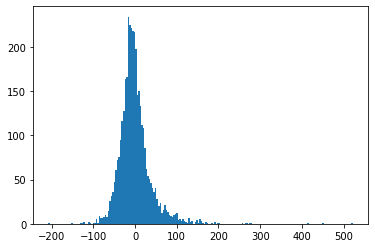

In [ ]:
#Residuals distribution
plt.hist(y_test-regressor.predict(X_test),bins=200)
plt.show()

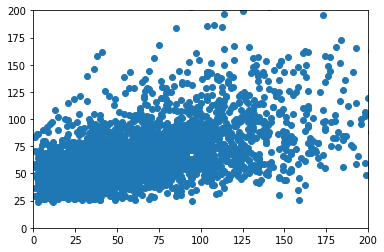

In [ ]:
#Residuals plot
plt.scatter(y_test,regressor.predict(X_test))
plt.axis([0,200,0,200])
plt.show()

In [ ]:
#RMSE
np.sqrt(mean_squared_error(y_test,regressor.predict(X_test)))

39.54148828012387

In [ ]:
#Coefficients of linear model
reglist['s4'].coef_

array([0.36398403, 0.32351171, 0.20869067, 0.15197783])

## Random Forest Regression

In [ ]:
#R^2 score for each station using random forest regressor
reglist2={}
for key in dls:
    X_train, X_test, y_train, y_test = train_test_split(dls[key].iloc[:,:-1], dls[key].iloc[:,-1], test_size = 0.2, random_state = 0)
    regressor = RandomForestRegressor(n_estimators=10)
    regressor.fit(X_train, y_train)
    reglist2[key]=regressor
    print(regressor.score(X_test,y_test))

0.23347408807269066
0.5335330936582952
0.4180089457717907
0.5789280230388814
0.46899806555243495
0.18303892472757366
0.3769851674570526
0.20923004213807983


# Multivariable Lag Analysis

## VAR Model

In [ ]:
%%time
#VAR modeling with lag=2
mod = sm.tsa.VARMAX(pm10, order=(2,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



                                          Statespace Model Results                                          
Dep. Variable:     ['s1', 's2', 's3', 's4', 's5', 's6', 's7', 's8']   No. Observations:                18749
Model:                                                       VAR(2)   Log Likelihood             -711167.379
Date:                                              Mon, 01 Jun 2020   AIC                        1422662.757
Time:                                                      00:24:48   BIC                        1423948.336
Sample:                                                           0   HQIC                       1423084.678
                                                            - 18749                                         
Covariance Type:                                                opg                                         
Ljung-Box (Q):          681.14, 171.28, 403.30, 302.71, 668.32, 175.66, 983.79, 303.79   Jarque-Bera (JB):   2546144.88, 1525406

## Lagged Dataset

In [ ]:
#Build lagged dataset
#lag=1
dslag1=ds.copy()
for key in dslag1:
  dslag1[key]=dslag1[key].shift(1).fillna(0)
#lag=2
dslag2=ds.copy()
for key in dslag2:
  dslag2[key]=dslag2[key].shift(2).fillna(0)
#lag=3
dslag3=ds.copy()
for key in dslag3:
  dslag3[key]=dslag3[key].shift(3).fillna(0)

##Lagged Correlation

In [ ]:
#Correlation function for two datasets with different lag value
def lagcor(ds,dslag):
  from itertools import product,permutations,combinations
  cor=[]
  pair=list(product(list(ds.keys()),list(ds['s1'].columns)))
  li=list(permutations(pair, 2))
  for p in li:
      k=ds[p[0][0]][p[0][1]].corr(dslag[p[1][0]][p[1][1]])
      cor.append(k)

      nam=[]
  for i in range(0,len(li)):
      m=(li[i][0][0]+li[i][0][1]+'->'+li[i][1][0]+li[i][1][1])
      nam.append(m)
      
  ct=pd.DataFrame(cor, index=nam,columns=['corr'])
  return ct

In [ ]:
#Lag0->Lag1 Correlation
ctl1=lagcor(ds,dslag1)
ctl1[ctl1.index.str.contains('s.PM10')].apply(lambda x: np.abs(x)).sort_values(by='corr',ascending=False).head(50)

,corr
s4PM10->s2PM10,0.658987
s7PM10->s2PM10,0.651249
s7PM10->s4PM10,0.639889
s2PM10->s4PM10,0.630525
s5PM10->s4PM10,0.628800
s4PM10->s7PM10,0.618644
s3PM10->s5PM10,0.602858
s4PM10->s5PM10,0.602614
s5PM10->s3PM10,0.587311
s3PM10->s4PM10,0.582540


In [ ]:
#Lag0->Lag1 Correlation for PM10
ctl1[ctl1.index.str.contains('s1PM10')].apply(lambda x: np.abs(x)).sort_values(by='corr',ascending=False).head(100)

,corr
s1PM10->s7PM10,0.500154
s1PM10->s2PM10,0.496665
s1PM10->s3PM10,0.485511
s1PM10->s4PM10,0.467386
s7PM10->s1PM10,0.462358
s3PM10->s1PM10,0.443909
s4PM10->s1PM10,0.430247
s2PM10->s1PM10,0.412762
s1PM10->s5PM10,0.410905
s6PM10->s1PM10,0.388952


In [ ]:
#Lag0->Lag2 Correlation for
ctl2=lagcor(ds,dslag2)
ctl2[ctl2.index.str.contains('s.PM10')].apply(lambda x: np.abs(x)).sort_values(by='corr',ascending=False).head(100)

,corr
s4PM10->s2PM10,0.576150
s3PM10->s5PM10,0.563903
s7PM10->s2PM10,0.558154
s2PM10->s4PM10,0.548183
s5PM10->s4PM10,0.540403
s7PM10->s4PM10,0.539524
s4PM10->s5PM10,0.529219
s3PM10->s4PM10,0.526951
s4PM10->s7PM10,0.522956
s3PM10->s2PM10,0.519355


In [ ]:
#Lag0->Lag3 Correlation
ctl3=lagcor(ds,dslag3)
ctl3[ctl3.index.str.contains('s.PM10')].apply(lambda x: np.abs(x)).sort_values(by='corr',ascending=False).head(100)

,corr
s3PM10->s5PM10,0.507133
s4PM10->s2PM10,0.484807
s2PM10->s4PM10,0.475691
s7PM10->s2PM10,0.461482
s4PM10->s5PM10,0.461406
s3PM10->s4PM10,0.454957
s2PM10->s5PM10,0.454395
s7PM10->s4PM10,0.453893
s3PM10->s2PM10,0.452309
s5PM10->s4PM10,0.451552


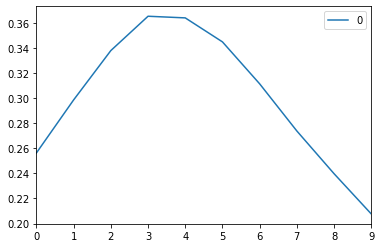

In [ ]:
lmax=10
lg=[0]*lmax
for l in range(0,lmax):
  lg[l]=ds['s5'].PM10.corr(ds['s2'].WS.shift(l))
pd.DataFrame(lg).apply(lambda x: np.abs(x)).plot()

## Cross-Correlation



In [ ]:
def crosscor(y1,y2):
  npts=y1.shape[0]
  lags = np.arange(-npts + 1, npts)
  ccov = np.correlate(y1 - y1.mean(), y2 - y2.mean(), mode='full')
  ccor = ccov / (npts * y1.std() * y2.std())
  fig, axs = plt.subplots(nrows=1)
  fig.subplots_adjust(hspace=0.4)

  ax = axs
  ax.plot(lags, ccor)

  ax.set_ylim(-1, 1)
  ax.set_xlim(-10, 10)
  ax.set_ylabel('cross-correlation')
  ax.set_xlabel('lag of y1 relative to y2')

  maxlag = lags[np.argmax(ccor)]
  print("max correlation is at lag %d" % maxlag)


max correlation is at lag -2


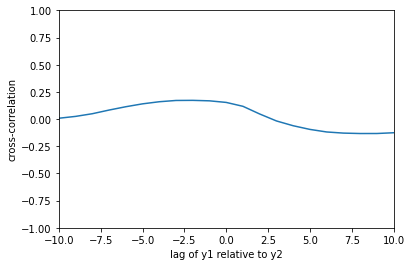

In [ ]:
crosscor(ds['s1'].PM10,ds['s8'].WS)

##  Graphs of Correlation Between Target and Params at n Lags

In [ ]:
def dfCorr(s_a,ep):
  ss=['s1','s2','s3','s4','s5','s6','s7','s8']
  lmax=10
  datos=np.zeros((8,10))
  lg=[0]*lmax
  x=0
  for i in ss:
    for l in range(0,lmax):
      lg[l]=ds[s_a].PM10.corr(ds[i][ep].shift(l))
    datos[x:]=lg
    x=x+1
  datos=pd.DataFrame(datos.transpose()).apply(lambda x: np.abs(x))
  return datos

In [ ]:
def mi_grafico(datos,title):
    ss=['s1','s2','s3','s4','s5','s6','s7','s8']
    datos.columns=ss
    col=['Black','Red','Green','Blue','Magenta','Cyan','Yellow']
    x=0
    for i in ss:
      plt.plot(datos[i], ms=7, label=ss[x])
      x=x+1
    plt.legend(loc='upper left', bbox_to_anchor=(1,1))
    plt.xticks(list(range(0,10)))
    plt.suptitle(title, fontsize=20)
    plt.xlabel('Lags', fontsize=18)
    plt.show()    

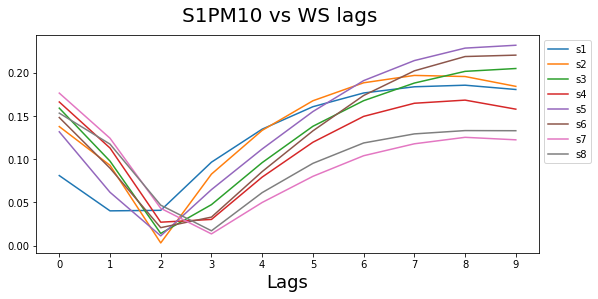

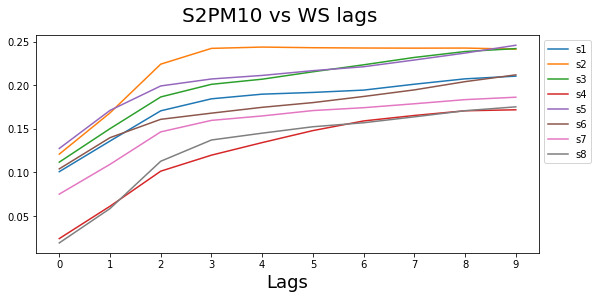

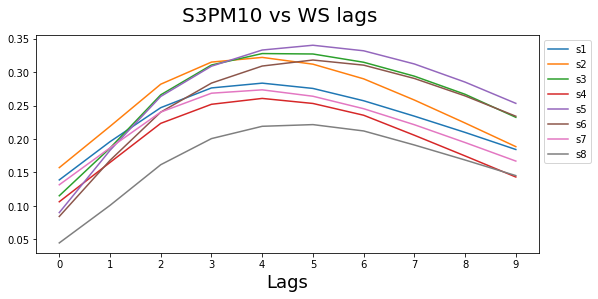

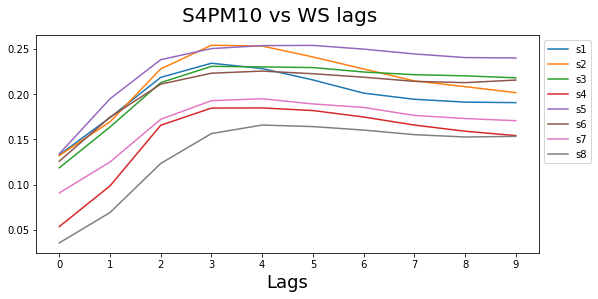

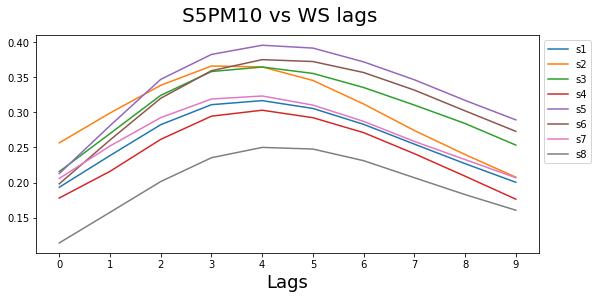

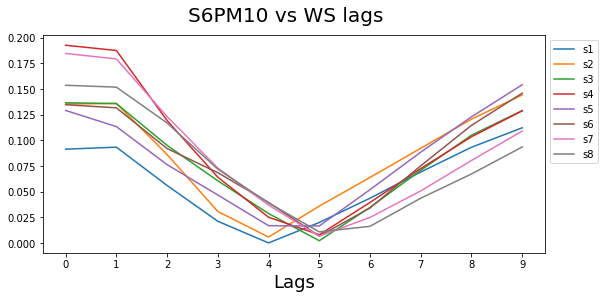

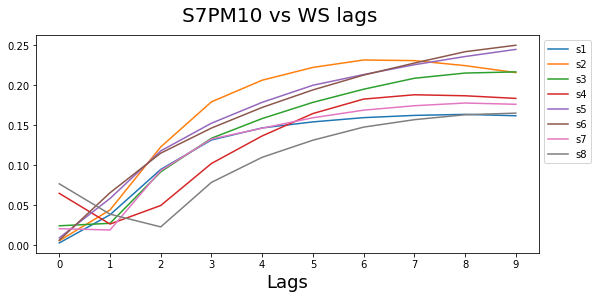

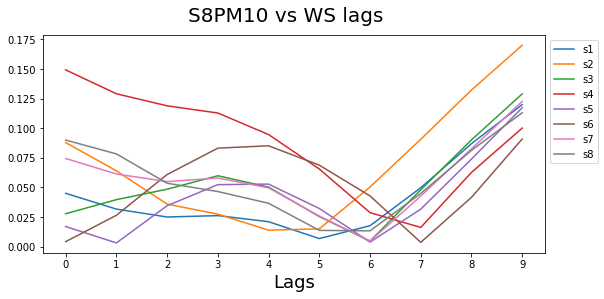

In [ ]:
ss=['s1','s2','s3','s4','s5','s6','s7','s8']

dfcs1ws=dfCorr('s1','WS')
dfcs2ws=dfCorr('s2','WS')
dfcs3ws=dfCorr('s3','WS')
dfcs4ws=dfCorr('s4','WS')
dfcs5ws=dfCorr('s5','WS')
dfcs6ws=dfCorr('s6','WS')
dfcs7ws=dfCorr('s7','WS')
dfcs8ws=dfCorr('s8','WS')


title1='S1PM10 vs WS lags'
mi_grafico(dfcs1ws,title1)
title2='S2PM10 vs WS lags'
mi_grafico(dfcs2ws,title2)
title3='S3PM10 vs WS lags'
mi_grafico(dfcs3ws,title3)
title4='S4PM10 vs WS lags'
mi_grafico(dfcs4ws,title4)
title5='S5PM10 vs WS lags'
mi_grafico(dfcs5ws,title5)
title6='S6PM10 vs WS lags'
mi_grafico(dfcs6ws,title6)
title7='S7PM10 vs WS lags'
mi_grafico(dfcs7ws,title7)
title8='S8PM10 vs WS lags'
mi_grafico(dfcs8ws,title8)



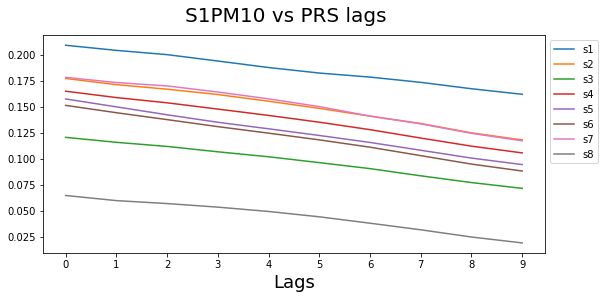

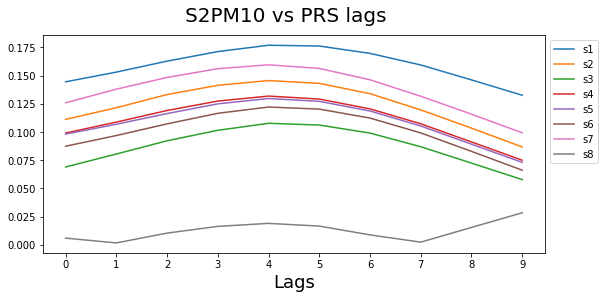

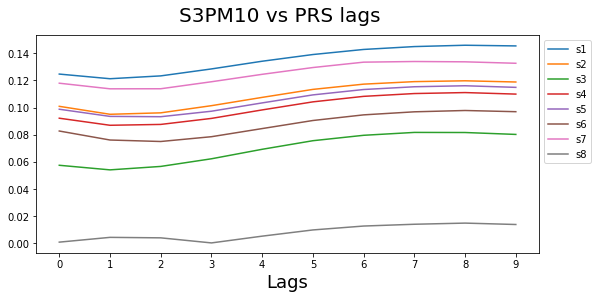

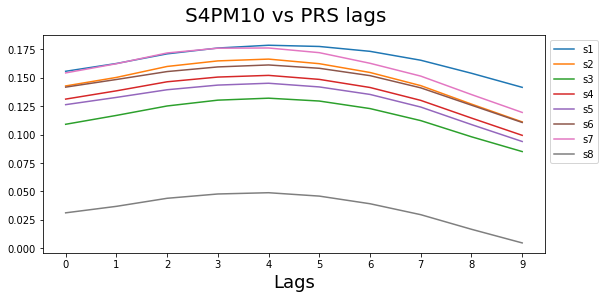

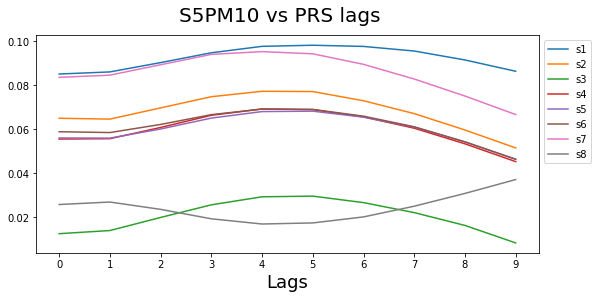

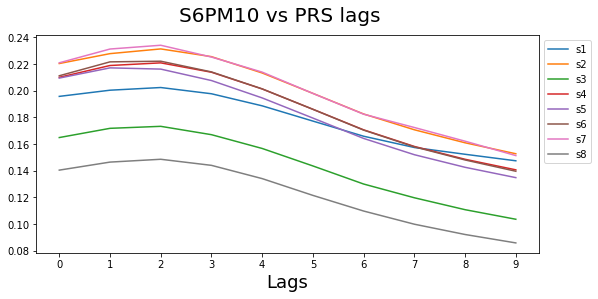

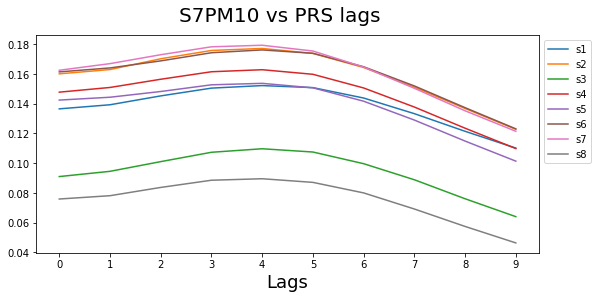

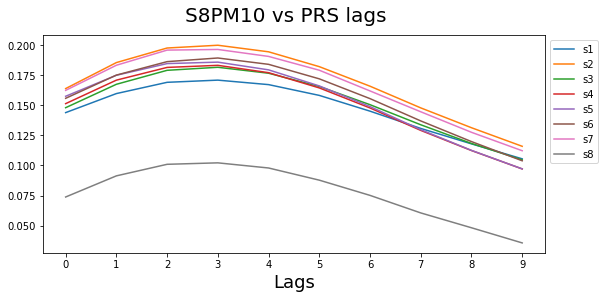

In [ ]:

dfcs1prs=dfCorr('s1','PRS')
dfcs2prs=dfCorr('s2','PRS')
dfcs3prs=dfCorr('s3','PRS')
dfcs4prs=dfCorr('s4','PRS')
dfcs5prs=dfCorr('s5','PRS')
dfcs6prs=dfCorr('s6','PRS')
dfcs7prs=dfCorr('s7','PRS')
dfcs8prs=dfCorr('s8','PRS')

title1='S1PM10 vs PRS lags'
mi_grafico(dfcs1prs,title1)
title2='S2PM10 vs PRS lags'
mi_grafico(dfcs2prs,title2)
title3='S3PM10 vs PRS lags'
mi_grafico(dfcs3prs,title3)
title4='S4PM10 vs PRS lags'
mi_grafico(dfcs4prs,title4)
title5='S5PM10 vs PRS lags'
mi_grafico(dfcs5prs,title5)
title6='S6PM10 vs PRS lags'
mi_grafico(dfcs6prs,title6)
title7='S7PM10 vs PRS lags'
mi_grafico(dfcs7prs,title7)
title8='S8PM10 vs PRS lags'
mi_grafico(dfcs8prs,title8)


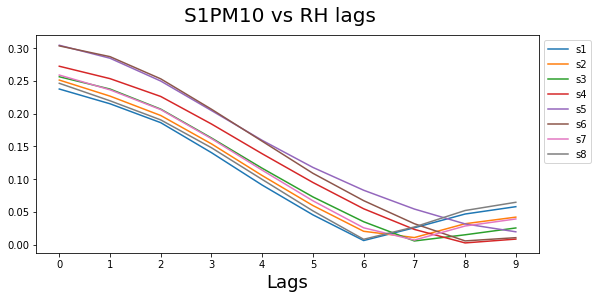

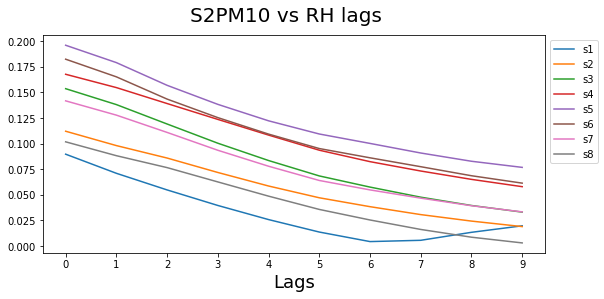

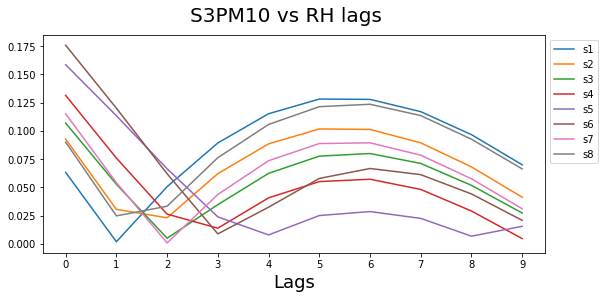

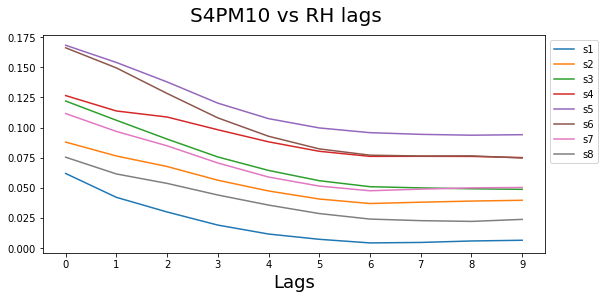

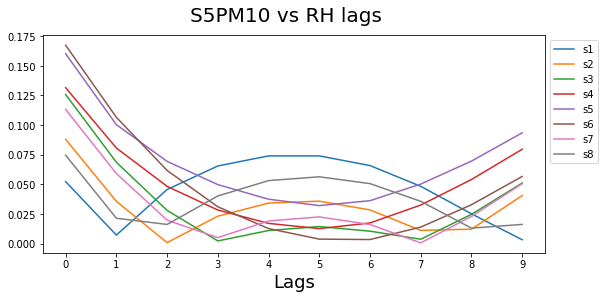

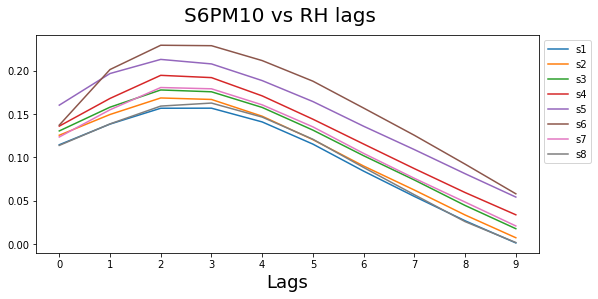

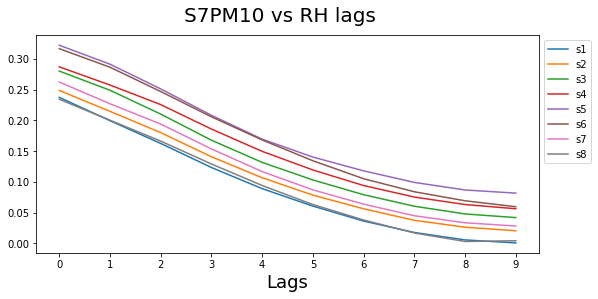

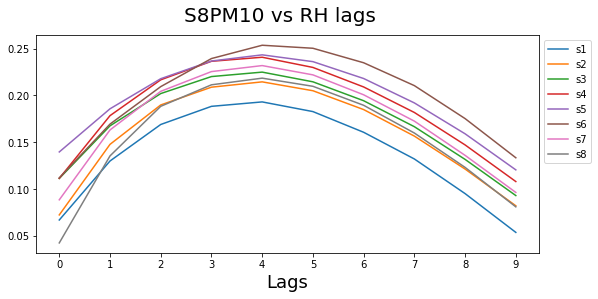

In [ ]:

dfcs1rh=dfCorr('s1','RH')
dfcs2rh=dfCorr('s2','RH')
dfcs3rh=dfCorr('s3','RH')
dfcs4rh=dfCorr('s4','RH')
dfcs5rh=dfCorr('s5','RH')
dfcs6rh=dfCorr('s6','RH')
dfcs7rh=dfCorr('s7','RH')
dfcs8rh=dfCorr('s8','RH')

title1='S1PM10 vs RH lags'
mi_grafico(dfcs1rh,title1)
title2='S2PM10 vs RH lags'
mi_grafico(dfcs2rh,title2)
title3='S3PM10 vs RH lags'
mi_grafico(dfcs3rh,title3)
title4='S4PM10 vs RH lags'
mi_grafico(dfcs4rh,title4)
title5='S5PM10 vs RH lags'
mi_grafico(dfcs5rh,title5)
title6='S6PM10 vs RH lags'
mi_grafico(dfcs6rh,title6)
title7='S7PM10 vs RH lags'
mi_grafico(dfcs7rh,title7)
title8='S8PM10 vs RH lags'
mi_grafico(dfcs8rh,title8)


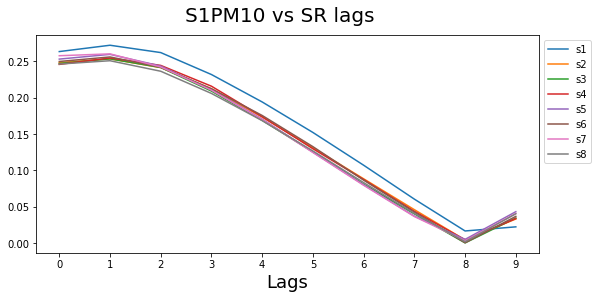

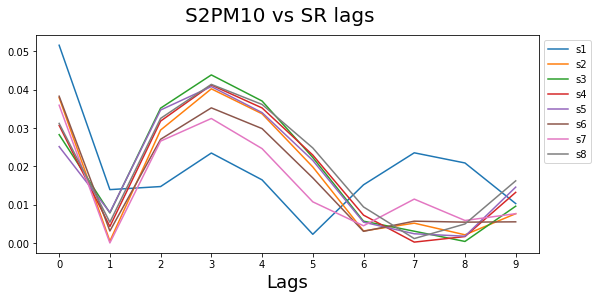

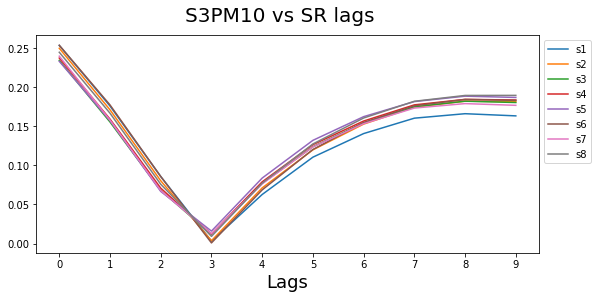

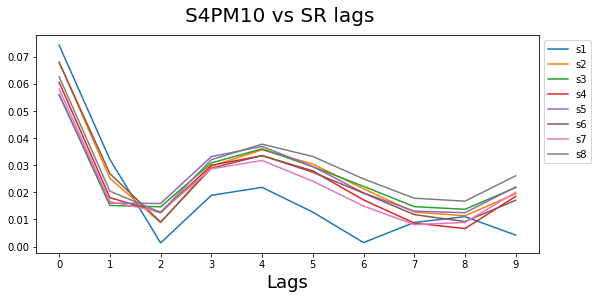

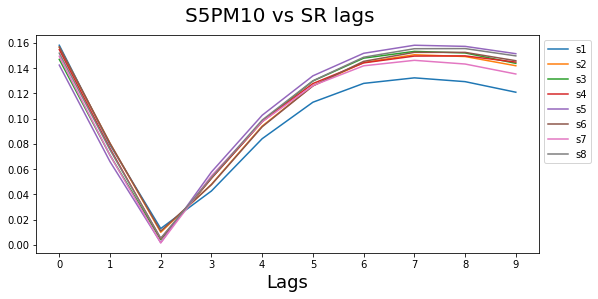

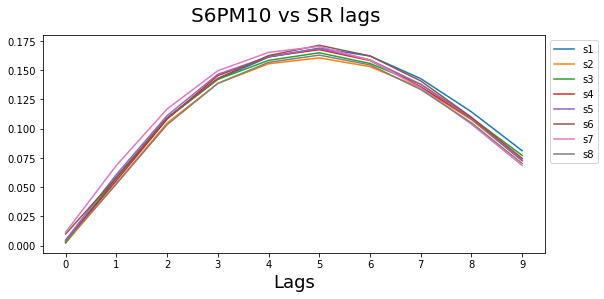

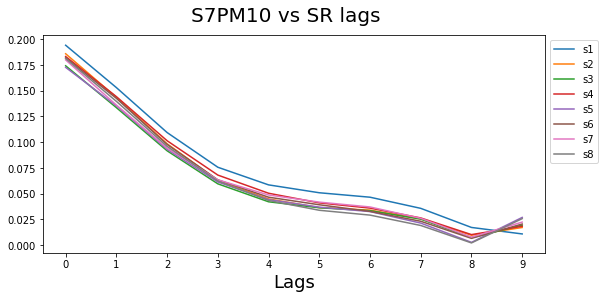

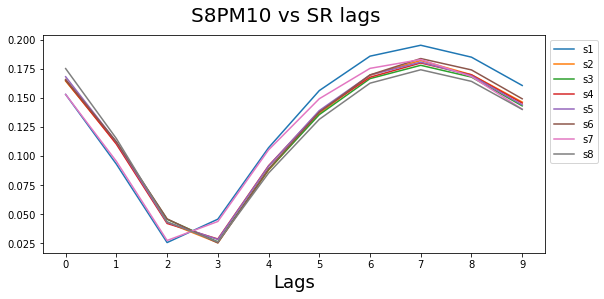

In [ ]:
#SR=Solar Radiation
dfcs1sr=dfCorr('s1','SR')
dfcs2sr=dfCorr('s2','SR')
dfcs3sr=dfCorr('s3','SR')
dfcs4sr=dfCorr('s4','SR')
dfcs5sr=dfCorr('s5','SR')
dfcs6sr=dfCorr('s6','SR')
dfcs7sr=dfCorr('s7','SR')
dfcs8sr=dfCorr('s8','SR')

title1='S1PM10 vs SR lags'
mi_grafico(dfcs1sr,title1)
title2='S2PM10 vs SR lags'
mi_grafico(dfcs2sr,title2)
title3='S3PM10 vs SR lags'
mi_grafico(dfcs3sr,title3)
title4='S4PM10 vs SR lags'
mi_grafico(dfcs4sr,title4)
title5='S5PM10 vs SR lags'
mi_grafico(dfcs5sr,title5)
title6='S6PM10 vs SR lags'
mi_grafico(dfcs6sr,title6)
title7='S7PM10 vs SR lags'
mi_grafico(dfcs7sr,title7)
title8='S8PM10 vs SR lags'
mi_grafico(dfcs8sr,title8)

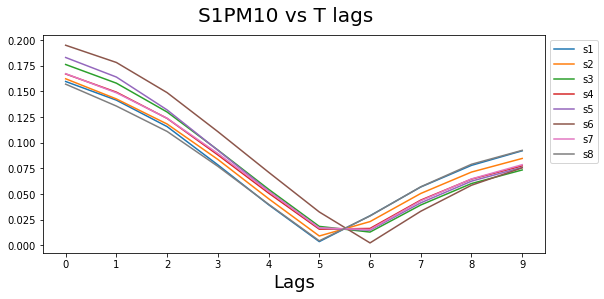

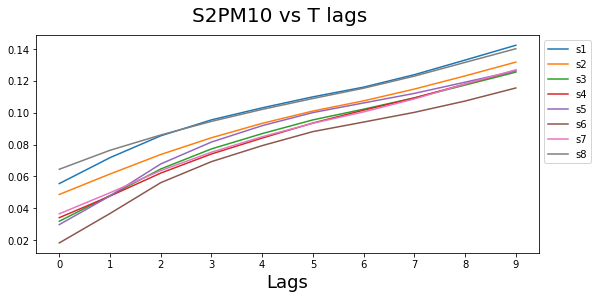

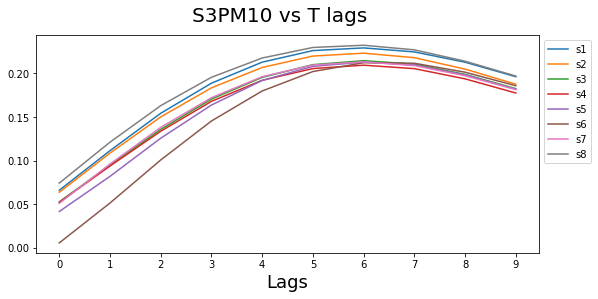

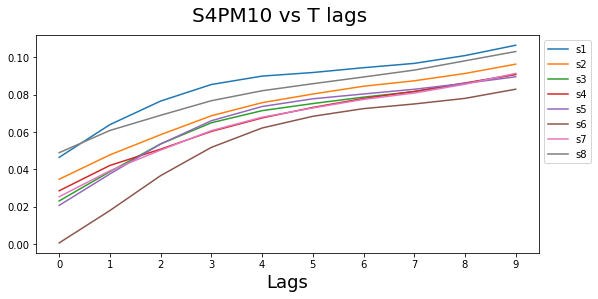

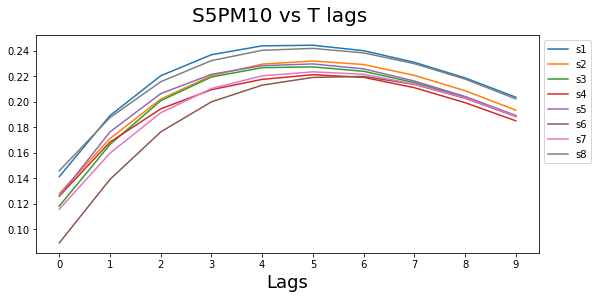

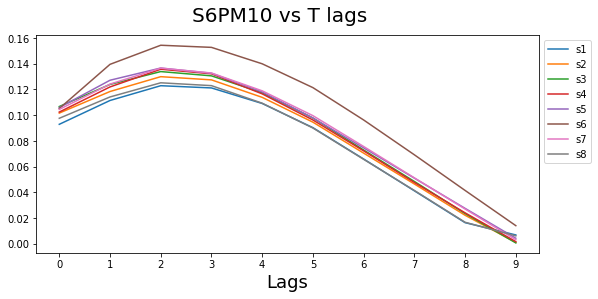

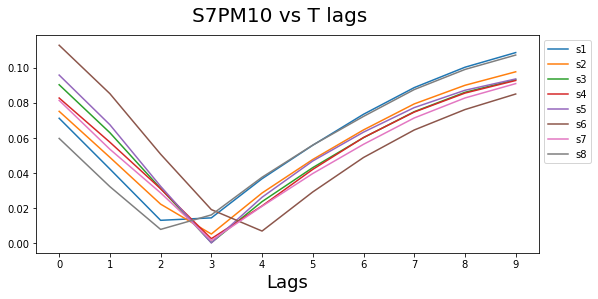

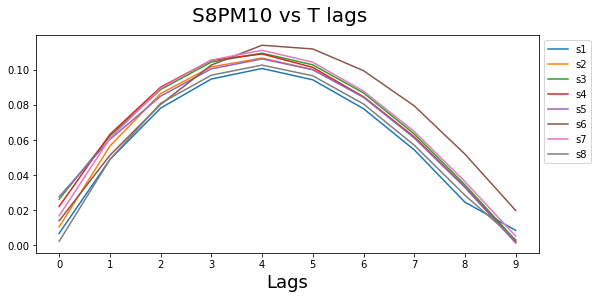

In [ ]:

dfcs1t=dfCorr('s1','T')
dfcs2t=dfCorr('s2','T')
dfcs3t=dfCorr('s3','T')
dfcs4t=dfCorr('s4','T')
dfcs5t=dfCorr('s5','T')
dfcs6t=dfCorr('s6','T')
dfcs7t=dfCorr('s7','T')
dfcs8t=dfCorr('s8','T')


title1='S1PM10 vs T lags'
mi_grafico(dfcs1t,title1)
title2='S2PM10 vs T lags'
mi_grafico(dfcs2t,title2)
title3='S3PM10 vs T lags'
mi_grafico(dfcs3t,title3)
title4='S4PM10 vs T lags'
mi_grafico(dfcs4t,title4)
title5='S5PM10 vs T lags'
mi_grafico(dfcs5t,title5)
title6='S6PM10 vs T lags'
mi_grafico(dfcs6t,title6)
title7='S7PM10 vs T lags'
mi_grafico(dfcs7t,title7)
title8='S8PM10 vs T lags'
mi_grafico(dfcs8t,title8)

## Correlation Heatmaps at n Lags


In [ ]:
#Read Lagged Datasets
correlacion1lags= pd.read_csv('./mtypollution/Correlacion1Lag.csv')
correlacion2lags = pd.read_csv('./mtypollution/Correlacion2Lag.csv')
correlacion3lags = pd.read_csv('./mtypollution/Correlacion3Lag.csv')

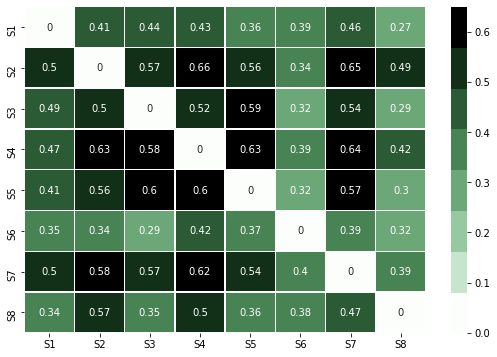

In [ ]:
#Correlation heatmap for target values at lag=1
f, ax = plt.subplots(figsize=(9, 6))
a=sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.99)
sns.heatmap(correlacion1lags,annot=True, linewidths=.5, vmax=0.65, cmap=a, yticklabels=correlacion1lags.columns);


In [ ]:
#3 Most correlated stations at lag=1
ddspm10={'s1':['s2','s7','s3'],'s2':['s4','s5','s7'],\
         's3':['s5','s4','s2'],'s4':['s2','s7','s5'],\
         's5':['s4','s3','s2'],'s6':['s7','s4','s1'],\
         's7':['s2','s4','s5'],'s8':['s2','s4','s7'],}
ddspm10=pd.DataFrame(ddspm10)
ddspm10

,s1,s2,s3,s4,s5,s6,s7,s8
0,s2,s4,s5,s2,s4,s7,s2,s2
1,s7,s5,s4,s7,s3,s4,s4,s4
2,s3,s7,s2,s5,s2,s1,s5,s7


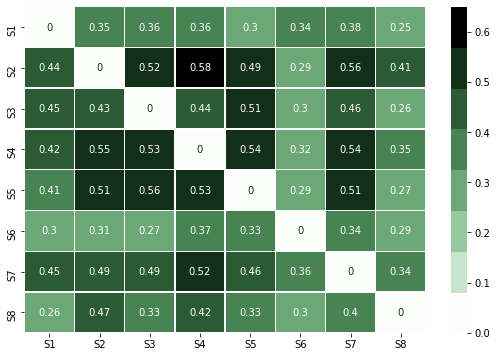

In [ ]:
#Correlation heatmap for target values at lag=2
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(correlacion2lags,annot=True, linewidths=.5, cmap=a,vmax=0.65, yticklabels=correlacion2lags.columns);

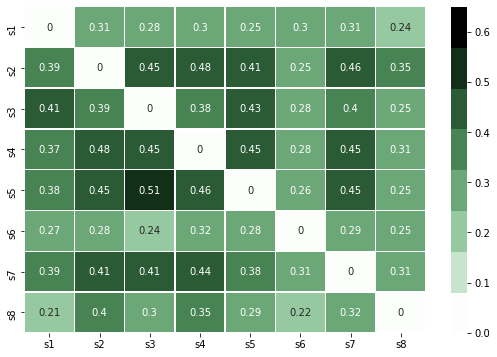

In [ ]:
#Correlation heatmap for target values at lag=3
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(correlacion3lags,annot=True, linewidths=.5, cmap=a,vmax=0.65, yticklabels=correlacion3lags.columns);

## Datasets

In [ ]:
#---------------------------
#-Velocidad del Viento (WS)-
#---------------------------
#-----Estación 1 vs WS -----
ss=['s1','s2','s3','s4','s5','s6','s7','s8']
#as1ws=dfcs1ws.nlargest(1,'s8')
ds1ws={'s':ss,'Lag':[8,7,9,8,9,9,0,0]}
dfs1ws =pd.DataFrame(ds1ws)
#-----Estación 2 vs WS -----
#as2ws=dfcs2ws.nlargest(1,'s7')
ds2ws={'s':ss,'Lag':[9,4,9,9,9,9,9,9]}
dfs2ws =pd.DataFrame(ds2ws)
#-----Estación 3 vs WS -----
#as3ws=dfcs3ws.nlargest(1,'s8')
ds3ws={'s':ss,'Lag':[4,4,4,4,5,5,4,5]}
dfs3ws =pd.DataFrame(ds3ws)
#-----Estación 4 vs WS -----
#as4ws=dfcs4ws.nlargest(1,'s8')
ds4ws={'s':ss,'Lag':[3,3,3,4,5,4,4,4]}
dfs4ws =pd.DataFrame(ds4ws)
#-----Estación 5 vs WS -----
#as5ws=dfcs5ws.nlargest(1,'s8')
ds5ws={'s':ss,'Lag':[4,3,4,4,4,4,4,4]}
dfs5ws =pd.DataFrame(ds5ws)
#-----Estación 6 vs WS -----
#as6ws=dfcs6ws.nlargest(1,'s8')
ds6ws={'s':ss,'Lag':[9,9,0,0,9,9,0,0]}
dfs6ws =pd.DataFrame(ds6ws)
#-----Estación 7 vs WS -----
#as7ws=dfcs7ws.nlargest(1,'s8')
ds7ws={'s':ss,'Lag':[8,6,9,7,9,9,8,9]}
dfs7ws =pd.DataFrame(ds7ws)
#-----Estación 8 vs WS -----
#as8ws=dfcs8ws.nlargest(1,'s8')
ds8ws={'s':ss,'Lag':[9,9,9,0,9,9,9,9]}
dfs8ws =pd.DataFrame(ds8ws)
#-----WS Dataframe -----
wsds={}
wsds["s{0}".format(1)]=dfs1ws
wsds["s{0}".format(2)]=dfs2ws
wsds["s{0}".format(3)]=dfs3ws
wsds["s{0}".format(4)]=dfs4ws
wsds["s{0}".format(5)]=dfs5ws
wsds["s{0}".format(6)]=dfs6ws
wsds["s{0}".format(7)]=dfs7ws
wsds["s{0}".format(8)]=dfs8ws

In [ ]:
#---------------------------
#--Humedad Relativa  (HR)---
#---------------------------
#-----Estación 1 vs RH -----
#as1rh=dfcs1rh.nlargest(1,'s8')
ds1rh={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs1rh =pd.DataFrame(ds1rh)
#-----Estación 2 vs RH -----
#as2rh=dfcs2rh.nlargest(1,'s8')
ds2rh={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs2rh =pd.DataFrame(ds2rh)
#-----Estación 3 vs RH -----
#as3rh=dfcs3rh.nlargest(1,'s8')
ds3rh={'s':ss,'Lag':[5,5,0,0,0,0,0,6]}
dfs3rh =pd.DataFrame(ds3rh)
#-----Estación 4 vs RH -----
#as4rh=dfcs4rh.nlargest(1,'s8')
ds4rh={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs4rh =pd.DataFrame(ds4rh)
#-----Estación 5 vs RH -----
#as5rh=dfcs5rh.nlargest(1,'s8')
ds5rh={'s':ss,'Lag':[4,0,0,0,0,0,0,0]}
dfs5rh =pd.DataFrame(ds5rh)
#-----Estación 6 vs RH -----
#as6rh=dfcs6rh.nlargest(1,'s8')
ds6rh={'s':ss,'Lag':[3,2,2,2,2,2,2,3]}
dfs6rh =pd.DataFrame(ds6rh)
#-----Estación 7 vs RH -----
#as7rh=dfcs7rh.nlargest(1,'s7')
ds7rh={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs7rh =pd.DataFrame(ds7rh)
#-----Estación 8 vs RH -----
#as8rh=dfcs8rh.nlargest(1,'s8')
ds8rh={'s':ss,'Lag':[4,4,4,4,4,4,4,4]}
dfs8rh =pd.DataFrame(ds8rh)
#-----PRS Dataframe -----
rhds={}
rhds["s{0}".format(1)]=dfs1rh
rhds["s{0}".format(2)]=dfs2rh
rhds["s{0}".format(3)]=dfs3rh
rhds["s{0}".format(4)]=dfs4rh
rhds["s{0}".format(5)]=dfs5rh
rhds["s{0}".format(6)]=dfs6rh
rhds["s{0}".format(7)]=dfs7rh
rhds["s{0}".format(8)]=dfs8rh

In [ ]:
#---------------------------
#--Radiación Solar  (SR)----
#---------------------------
#-----Estación 1 vs SR -----
#as1sr=dfcs1sr.nlargest(1,'s8')
ds1sr={'s':ss,'Lag':[1,1,1,1,1,1,1,1]}
dfs1sr =pd.DataFrame(ds1sr)
#-----Estación 2 vs SR -----
#as2sr=dfcs2sr.nlargest(1,'s8')
ds2sr={'s':ss,'Lag':[0,3,3,3,3,0,0,3]}
dfs2sr =pd.DataFrame(ds2sr)
#-----Estación 3 vs SR -----
#as3sr=dfcs3sr.nlargest(1,'s8')
ds3sr={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs3sr =pd.DataFrame(ds3sr)
#-----Estación 4 vs SR -----
#as4sr=dfcs4sr.nlargest(1,'s8')
ds4sr={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs4sr =pd.DataFrame(ds4sr)
#-----Estación 5 vs SR -----
#as5sr=dfcs5sr.nlargest(1,'s8')
ds5sr={'s':ss,'Lag':[0,0,7,0,7,0,0,8]}
dfs5sr =pd.DataFrame(ds5sr)
#-----Estación 6 vs SR -----
#as6sr=dfcs6sr.nlargest(1,'s8')
ds6sr={'s':ss,'Lag':[5,5,5,5,5,5,5,5]}
dfs6sr =pd.DataFrame(ds6sr)
#-----Estación 7 vs SR -----
#as7sr=dfcs7sr.nlargest(1,'s8')
ds7sr={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs7sr =pd.DataFrame(ds7sr)
#-----Estación 8 vs SR -----
#as8sr=dfcs8sr.nlargest(1,'s7')
ds8sr={'s':ss,'Lag':[7,7,7,7,7,7,7,0]}
dfs8sr =pd.DataFrame(ds8sr)
#-----SR Dataframe -----
srds={}
srds["s{0}".format(1)]=dfs1sr
srds["s{0}".format(2)]=dfs2sr
srds["s{0}".format(3)]=dfs3sr
srds["s{0}".format(4)]=dfs4sr
srds["s{0}".format(5)]=dfs5sr
srds["s{0}".format(6)]=dfs6sr
srds["s{0}".format(7)]=dfs7sr
srds["s{0}".format(8)]=dfs8sr
#srds['s8']

In [ ]:
#---------------------------
#------Temperatura  (T)-----
#---------------------------
#-----Estación 1 vs T -----
#as1t=dfcs1t.nlargest(1,'s8')
ds1t={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs1t =pd.DataFrame(ds1t)
#-----Estación 2 vs T -----
#as2t=dfcs2t.nlargest(1,'s8')
ds2t={'s':ss,'Lag':[9,9,9,9,9,9,9,9]}
dfs2t =pd.DataFrame(ds2t)
#-----Estación 3 vs T -----
#as3t=dfcs3t.nlargest(1,'s8')
ds3t={'s':ss,'Lag':[6,6,6,6,6,6,6,6]}
dfs3t =pd.DataFrame(ds3t)
#-----Estación 4 vs T -----
#as4t=dfcs4t.nlargest(1,'s8')
ds4t={'s':ss,'Lag':[9,9,9,9,9,9,9,9]}
dfs4t =pd.DataFrame(ds4t)
#-----Estación 5 vs T -----
#as5t=dfcs5t.nlargest(1,'s8')
ds5t={'s':ss,'Lag':[5,5,5,5,5,6,5,5]}
dfs5t =pd.DataFrame(ds5t)
#-----Estación 6 vs T -----
#as6t=dfcs6t.nlargest(1,'s8')
ds6t={'s':ss,'Lag':[2,2,2,2,2,2,2,2]}
dfs6t =pd.DataFrame(ds6t)
#-----Estación 7 vs T -----
#as7t=dfcs7t.nlargest(1,'s8')
ds7t={'s':ss,'Lag':[9,9,9,9,0,0,9,9]}
dfs7t =pd.DataFrame(ds7t)
#-----Estación 8 vs T -----
#as8t=dfcs8t.nlargest(1,'s8')
ds8t={'s':ss,'Lag':[4,4,4,4,4,4,4,4]}
dfs8t =pd.DataFrame(ds8t)
#-----SR Dataframe -----
tds={}
tds["s{0}".format(1)]=dfs1t
tds["s{0}".format(2)]=dfs2t
tds["s{0}".format(3)]=dfs3t
tds["s{0}".format(4)]=dfs4t
tds["s{0}".format(5)]=dfs5t
tds["s{0}".format(6)]=dfs6t
tds["s{0}".format(7)]=dfs7t
tds["s{0}".format(8)]=dfs8t
#tds['s8']

In [ ]:
def createds(dss,es,dspr,pr,cname):
  ss=['s1','s2','s3','s4','s5','s6','s7','s8']
  for i in range(0,8):
    a=dspr[es][i:i+1]['Lag'].item()
    datap=ds[ss[i]][pr].shift(a).fillna(0)
    dss[cname[i]]=pd.DataFrame(datap,index=dates)
  return dss

In [ ]:
#Inicializar dataframe y filtrado
dss1=ds['s1']
dss1= dss1.drop(['PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'], axis=1)
dss1.columns=['s1_PM10'] 

#S.PM10 1 lag
dss1['s2_PM10']=ds['s2'].PM10.shift(1).fillna(0) 
dss1['s7_PM10']=ds['s7'].PM10.shift(1).fillna(0)
dss1['s3_PM10']=ds['s3'].PM10.shift(1).fillna(0)

#Nombre asignado a las columnas
rhname=['s1_RH','s2_RH','s3_RH','s4_RH','s5_RH','s6_RH','s7_RH','s8_RH']
tname=['s1_T','s2_T','s3_T','s4_T','s5_T','s6_T','s7_T','s8_T']
srname=['s1_SR','s2_SR','s3_SR','s4_SR','s5_SR','s6_SR','s7_SR','s8_SR']
wsname=['s1_WS','s2_WS','s3_WS','s4_WS','s5_WS','s6_WS','s7_WS','s8_WS']

#Funciones para crear dataframe
dss1= createds(dss1,'s1',rhds,'RH',rhname)
dss1= createds(dss1,'s1',srds,'SR',srname)
dss1= createds(dss1,'s1',tds,'T',tname)
dss1= createds(dss1,'s1',wsds,'WS',wsname)
dss1.head(9)


,s1_PM10,s2_PM10,s7_PM10,s3_PM10,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,213.0,0.0,0.0,0.0,53.0,46.0,36.0,31.0,34.0,34.0,39.0,49.0,0.000,0.000,0.0,0.000,0.0,0.000,0.000,0.000,16.11,16.86,17.33,18.62,15.12,15.69,18.18,16.96,0.0,0.0,0.0,0.0,0.0,0.0,1.8,5.2
2012-01-01 01:00:00,206.0,861.0,115.0,166.0,54.0,45.0,38.0,34.0,36.0,35.0,43.0,49.0,0.000,0.000,0.0,0.000,0.0,0.000,0.000,0.000,15.97,16.67,16.62,17.61,14.35,15.08,17.26,16.44,0.0,0.0,0.0,0.0,0.0,0.0,1.7,5.4
2012-01-01 02:00:00,226.0,991.0,268.0,150.0,50.0,50.0,39.0,34.0,33.0,35.0,41.0,47.0,0.000,0.000,0.0,0.000,0.0,0.000,0.000,0.000,16.65,16.75,16.24,17.13,14.86,14.83,17.05,15.71,0.0,0.0,0.0,0.0,0.0,0.0,4.3,9.0
2012-01-01 03:00:00,179.0,830.0,446.0,165.0,43.0,44.0,36.0,34.0,34.0,34.0,35.0,41.0,0.000,0.000,0.0,0.000,0.0,0.000,0.000,0.000,17.54,16.84,16.88,16.98,14.23,14.80,18.32,15.81,0.0,0.0,0.0,0.0,0.0,0.0,8.0,8.2
2012-01-01 04:00:00,129.0,966.0,272.0,158.0,38.0,46.0,35.0,28.0,32.0,34.0,32.0,38.0,0.000,0.000,0.0,0.000,0.0,0.000,0.000,0.000,17.80,15.96,16.33,17.75,14.37,14.16,18.00,15.49,0.0,0.0,0.0,0.0,0.0,0.0,4.7,7.0
2012-01-01 05:00:00,98.0,345.0,80.0,101.0,40.0,44.0,34.0,25.0,31.0,34.0,41.0,37.0,0.000,0.000,0.0,0.000,0.0,0.000,0.000,0.000,16.33,15.45,16.19,18.06,13.65,13.63,16.15,15.37,0.0,0.0,0.0,0.0,0.0,0.0,5.9,7.3
2012-01-01 06:00:00,87.0,332.0,141.0,66.0,49.0,42.0,39.0,29.0,31.0,34.0,38.0,36.0,0.000,0.000,0.0,0.000,0.0,0.000,0.000,0.000,14.63,14.85,14.82,16.51,13.28,13.48,15.57,15.01,0.0,0.0,0.0,0.0,0.0,0.0,4.6,9.2
2012-01-01 07:00:00,91.0,251.0,215.0,57.0,47.0,48.0,39.0,33.0,29.0,35.0,35.0,50.0,0.000,0.000,0.0,0.000,0.0,0.000,0.000,0.000,16.05,15.48,15.01,17.60,14.42,13.29,17.36,16.23,0.0,1.1,0.0,0.0,0.0,0.0,6.3,15.5
2012-01-01 08:00:00,81.0,149.0,174.0,63.0,47.0,49.0,42.0,34.0,32.0,33.0,38.0,53.0,0.002,0.004,0.0,0.006,0.0,0.004,0.003,0.005,17.19,16.06,16.36,18.65,17.51,13.80,17.20,15.60,6.8,1.7,0.0,6.8,0.0,0.0,6.1,17.7


In [ ]:
dss2=ds['s2']
dss2= dss2.drop(['PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'], axis=1)
dss2.columns=['s2_PM10'] 

dss2['s4_PM10']=ds['s4'].PM10.shift(1).fillna(0) 
dss2['s5_PM10']=ds['s5'].PM10.shift(1).fillna(0)
dss2['s7_PM10']=ds['s7'].PM10.shift(1).fillna(0)

dss2= createds(dss2,'s2',rhds,'RH',rhname)
dss2= createds(dss2,'s2',srds,'SR',srname)
dss2= createds(dss2,'s2',tds,'T',tname)
dss2= createds(dss2,'s2',wsds,'WS',wsname)
dss2.head()


,s2_PM10,s4_PM10,s5_PM10,s7_PM10,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,861.0,0.0,0.0,0.0,53.0,46.0,36.0,31.0,34.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,991.0,300.0,508.0,115.0,54.0,45.0,38.0,34.0,36.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,830.0,255.0,427.0,268.0,50.0,50.0,39.0,34.0,33.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,966.0,433.0,531.0,446.0,43.0,44.0,36.0,34.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,345.0,216.0,451.0,272.0,38.0,46.0,35.0,28.0,32.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.1,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
dss3=ds['s3']
dss3= dss3.drop(['PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'], axis=1)
dss3.columns=['s3_PM10'] 

dss3['s5_PM10']=ds['s5'].PM10.shift(1).fillna(0) 
dss3['s4_PM10']=ds['s4'].PM10.shift(1).fillna(0)
dss3['s2_PM10']=ds['s2'].PM10.shift(1).fillna(0)

dss3= createds(dss3,'s3',rhds,'RH',rhname)
dss3= createds(dss3,'s3',srds,'SR',srname)
dss3= createds(dss3,'s3',tds,'T',tname)
dss3= createds(dss3,'s3',wsds,'WS',wsname)
dss3.head()


,s3_PM10,s5_PM10,s4_PM10,s2_PM10,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,166.0,0.0,0.0,0.0,0.0,0.0,36.0,31.0,34.0,34.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,150.0,508.0,300.0,861.0,0.0,0.0,38.0,34.0,36.0,35.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,165.0,427.0,255.0,991.0,0.0,0.0,39.0,34.0,33.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,158.0,531.0,433.0,830.0,0.0,0.0,36.0,34.0,34.0,34.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,101.0,451.0,216.0,966.0,0.0,0.0,35.0,28.0,32.0,34.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.8,1.1,4.2,6.8,0.0,0.0,1.8,0.0


In [ ]:
dss4=ds['s4']
dss4= dss4.drop(['PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'], axis=1)
dss4.columns=['s4_PM10'] 

dss4['s2_PM10']=ds['s2'].PM10.shift(1).fillna(0) 
dss4['s7_PM10']=ds['s7'].PM10.shift(1).fillna(0)
dss4['s5_PM10']=ds['s5'].PM10.shift(1).fillna(0)

dss4= createds(dss4,'s4',rhds,'RH',rhname)
dss4= createds(dss4,'s4',srds,'SR',srname)
dss4= createds(dss4,'s4',tds,'T',tname)
dss4= createds(dss4,'s4',wsds,'WS',wsname)
dss4.head()


,s4_PM10,s2_PM10,s7_PM10,s5_PM10,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,300.0,0.0,0.0,0.0,53.0,46.0,36.0,31.0,34.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,255.0,861.0,115.0,508.0,54.0,45.0,38.0,34.0,36.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,433.0,991.0,268.0,427.0,50.0,50.0,39.0,34.0,33.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,216.0,830.0,446.0,531.0,43.0,44.0,36.0,34.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.8,1.1,4.2,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,212.0,966.0,272.0,451.0,38.0,46.0,35.0,28.0,32.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.5,1.7,2.6,6.8,0.0,3.6,1.8,5.2


In [ ]:
dss5=ds['s5']
dss5= dss5.drop(['PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'], axis=1)
dss5.columns=['s5_PM10'] 

dss5['s4_PM10']=ds['s4'].PM10.shift(1).fillna(0) 
dss5['s3_PM10']=ds['s3'].PM10.shift(1).fillna(0)
dss5['s2_PM10']=ds['s2'].PM10.shift(1).fillna(0)

dss5= createds(dss5,'s5',rhds,'RH',rhname)
dss5= createds(dss5,'s5',srds,'SR',srname)
dss5= createds(dss5,'s5',tds,'T',tname)
dss5= createds(dss5,'s5',wsds,'WS',wsname)
dss5.head()


,s5_PM10,s4_PM10,s3_PM10,s2_PM10,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,508.0,0.0,0.0,0.0,0.0,46.0,36.0,31.0,34.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,427.0,300.0,166.0,861.0,0.0,45.0,38.0,34.0,36.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,531.0,255.0,150.0,991.0,0.0,50.0,39.0,34.0,33.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,451.0,433.0,165.0,830.0,0.0,44.0,36.0,34.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.1,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,295.0,216.0,158.0,966.0,53.0,46.0,35.0,28.0,32.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.8,1.7,4.2,6.8,5.6,3.6,1.8,5.2


In [ ]:
dss6=ds['s6']
dss6= dss6.drop(['PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'], axis=1)
dss6.columns=['s6_PM10'] 

dss6['s7_PM10']=ds['s7'].PM10.shift(1).fillna(0) 
dss6['s4_PM10']=ds['s4'].PM10.shift(1).fillna(0)
dss6['s1_PM10']=ds['s1'].PM10.shift(1).fillna(0)

dss6= createds(dss6,'s6',rhds,'RH',rhname)
dss6= createds(dss6,'s6',srds,'SR',srname)
dss6= createds(dss6,'s6',tds,'T',tname)
dss6= createds(dss6,'s6',wsds,'WS',wsname)
dss6.head()


,s6_PM10,s7_PM10,s4_PM10,s1_PM10,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,256.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,4.2,6.8,0.0,0.0,1.8,5.2
2012-01-01 01:00:00,290.0,115.0,300.0,213.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,2.6,2.4,0.0,0.0,1.7,5.4
2012-01-01 02:00:00,167.0,268.0,255.0,206.0,0.0,46.0,36.0,31.0,34.0,34.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.11,16.86,17.33,18.62,15.12,15.69,18.18,16.96,0.0,0.0,2.5,5.3,0.0,0.0,4.3,9.0
2012-01-01 03:00:00,150.0,446.0,433.0,226.0,53.0,45.0,38.0,34.0,36.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.97,16.67,16.62,17.61,14.35,15.08,17.26,16.44,0.0,0.0,5.5,8.1,0.0,0.0,8.0,8.2
2012-01-01 04:00:00,127.0,272.0,216.0,179.0,54.0,50.0,39.0,34.0,33.0,35.0,41.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.65,16.75,16.24,17.13,14.86,14.83,17.05,15.71,0.0,0.0,3.1,11.0,0.0,0.0,4.7,7.0


In [ ]:
dss7=ds['s7']
dss7= dss7.drop(['PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'], axis=1)
dss7.columns=['s7_PM10'] 

dss7['s2_PM10']=ds['s5'].PM10.shift(1).fillna(0) 
dss7['s4_PM10']=ds['s4'].PM10.shift(1).fillna(0)
dss7['s5_PM10']=ds['s2'].PM10.shift(1).fillna(0)

dss7= createds(dss7,'s7',rhds,'RH',rhname)
dss7= createds(dss7,'s7',srds,'SR',srname)
dss7= createds(dss7,'s7',tds,'T',tname)
dss7= createds(dss7,'s7',wsds,'WS',wsname)
dss7.head()


,s7_PM10,s2_PM10,s4_PM10,s5_PM10,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,115.0,0.0,0.0,0.0,53.0,46.0,36.0,31.0,34.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.12,15.69,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,268.0,508.0,300.0,861.0,54.0,45.0,38.0,34.0,36.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.35,15.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,446.0,427.0,255.0,991.0,50.0,50.0,39.0,34.0,33.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.86,14.83,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,272.0,531.0,433.0,830.0,43.0,44.0,36.0,34.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.23,14.80,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,80.0,451.0,216.0,966.0,38.0,46.0,35.0,28.0,32.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.37,14.16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
dss8=ds['s7']
dss8= dss8.drop(['PRS', 'RAIN', 'RH', 'SR', 'T', 'WS'], axis=1)
dss8.columns=['s8_PM10'] 

dss8['s2_PM10']=ds['s2'].PM10.shift(1).fillna(0) 
dss8['s4_PM10']=ds['s4'].PM10.shift(1).fillna(0)
dss8['s7_PM10']=ds['s7'].PM10.shift(1).fillna(0)

dss8= createds(dss8,'s8',rhds,'RH',rhname)
dss8= createds(dss8,'s8',srds,'SR',srname)
dss8= createds(dss8,'s8',tds,'T',tname)
dss8= createds(dss8,'s8',wsds,'WS',wsname)
dss8.head()

,s8_PM10,s2_PM10,s4_PM10,s7_PM10,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,115.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,6.8,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,268.0,861.0,300.0,115.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,2.4,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,446.0,991.0,255.0,268.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.3,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,272.0,830.0,433.0,446.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,8.1,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,80.0,966.0,216.0,272.0,53.0,46.0,36.0,31.0,34.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.11,16.86,17.33,18.62,15.12,15.69,18.18,16.96,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0


## Linear Lagged Regression

In [ ]:
dss={'s1':dss1,'s2':dss2,'s3':dss3,'s4':dss4,'s5':dss5,'s6':dss6,'s7':dss7,'s8':dss8}

In [ ]:
#Linear Model
def modelev(dss1,ns):
  y1=dss1.iloc[:,0]
  dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)
  regr = LinearRegression()
  # Train the model using the training sets
  regr.fit(X_train, y_train)
  lin_pred = regr.predict(X_test)
  from math import sqrt
  print('s'+str(ns))
  # The coefficients
  print('Coefficients: \n', regr.coef_)
  # The mean squared error
  print("Root mean squared error: %.2f"
        % sqrt(mean_squared_error(y_test, lin_pred)))
  # The absolute squared error
  print("Mean absolute error: %.2f"
        % mean_absolute_error(y_test, lin_pred))
  # Explained variance score: 1 is perfect prediction
  print('R-squared: %.2f' % r2_score(y_test, lin_pred))

In [ ]:
#Iterate the regression over the 8 stations
i=1
for key in dss:
  modelev(dss[key],i)
  i=i+1

s1
Coefficients: 
 [ 1.22426911e-01 -1.11163172e-02  1.01461368e-01  8.70950969e-02
 -5.92640593e-02  1.23340773e-01 -9.17898211e-02 -3.70870772e-01
  2.25597616e-01 -1.31725480e-02  2.56123575e-02  1.26828645e+01
 -1.02391508e+01  1.87848410e+00  1.19782316e+01  8.18382849e+00
 -1.98610177e+01 -2.66948032e+00  2.68406198e-01 -1.17223629e+00
 -7.61964074e-01  1.15680879e+00 -1.79367008e+00  6.91647618e-01
  2.76571747e+00 -8.76260995e-01  2.33636640e-01 -6.44688223e-02
  9.21516849e-02  2.49761080e-01 -7.74549460e-02 -1.96442436e-01
 -9.72652695e-02  4.54150268e-01 -9.17301136e-02  5.77601576e-01
  2.81338829e-02]
Root mean squared error: 29.72
Mean absolute error: 15.40
R-squared: 0.60
s2
Coefficients: 
 [ 5.91193718e-02  4.69917816e-02 -3.22460152e-03  3.83109122e-01
  4.69397599e-01 -4.63190528e-01 -1.11888177e-01  5.70524734e-02
 -2.68141089e-01 -1.15982312e-01 -4.74816943e-02  2.16897314e+00
 -9.64582406e+00 -4.29159708e+00 -2.01325705e+00  8.83078471e+00
 -4.38068610e+00 -9.21009

## Model Comparison

In [ ]:
#Boosted Decision Tree
def modelev2(dss1,ns):
  y1=dss1.iloc[:,0]
  dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)

  # Create Decision Tree Regressor object
  tree_1 = DecisionTreeRegressor()

  tree_2 = AdaBoostRegressor(DecisionTreeRegressor(), n_estimators=200, learning_rate=.1)
  tree_1.fit(X_train, y_train)
  tree_2.fit(X_train, y_train)

  features = x1.columns
  importances = tree_2.feature_importances_
  indices = np.argsort(importances)

  # Make predictions using the testing set
  tree_1_pred = tree_1.predict(X_test)
  tree_2_pred = tree_2.predict(X_test)

  # The coefficients
  #print('Coefficients: \n', regr.coef_)
  # The mean squared error
  print("Root mean squared error: %.2f"
        % sqrt(mean_squared_error(y_test, tree_2_pred)))
  # The absolute squared error
  print("Mean absolute error: %.2f"
        % mean_absolute_error(y_test, tree_2_pred))
  # Explained variance score: 1 is perfect prediction
  print('R-squared: %.2f' % r2_score(y_test, tree_2_pred))

  plt.figure(figsize=(10,10))
  plt.title('Feature Importances')
  plt.barh(range(len(indices)), importances[indices], color='b', align='center')
  plt.yticks(range(len(indices)), features[indices])
  plt.xlabel('Relative Importance')
  plt.show()

s1
Root mean squared error: 28.71
Mean absolute error: 14.14
R-squared: 0.62


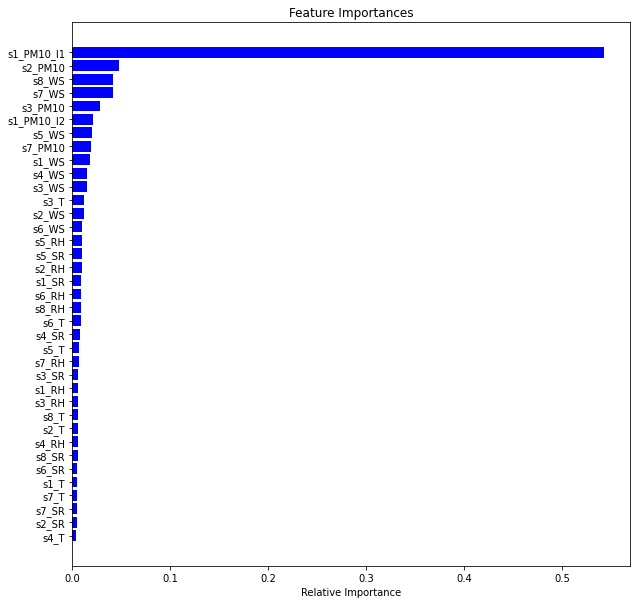

s2
Root mean squared error: 28.27
Mean absolute error: 15.55
R-squared: 0.66


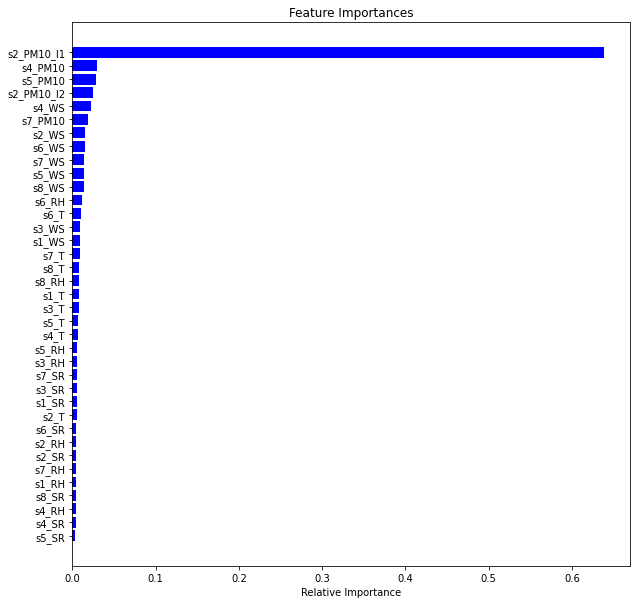

s3
Root mean squared error: 19.50
Mean absolute error: 11.42
R-squared: 0.67


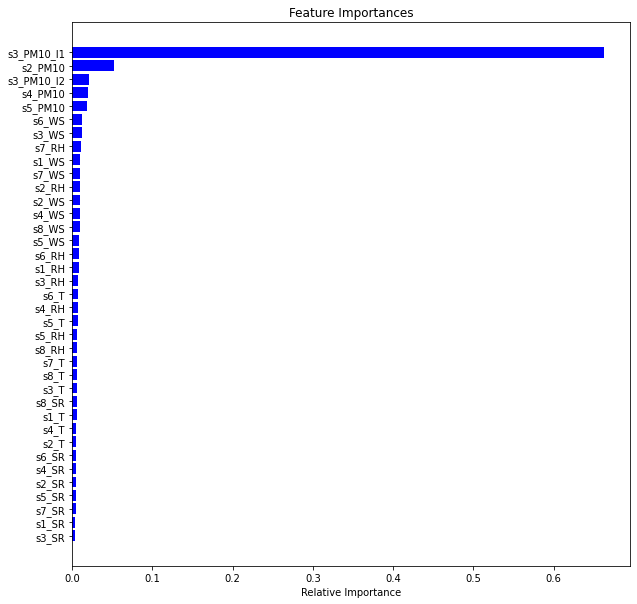

s4
Root mean squared error: 31.54
Mean absolute error: 16.57
R-squared: 0.62


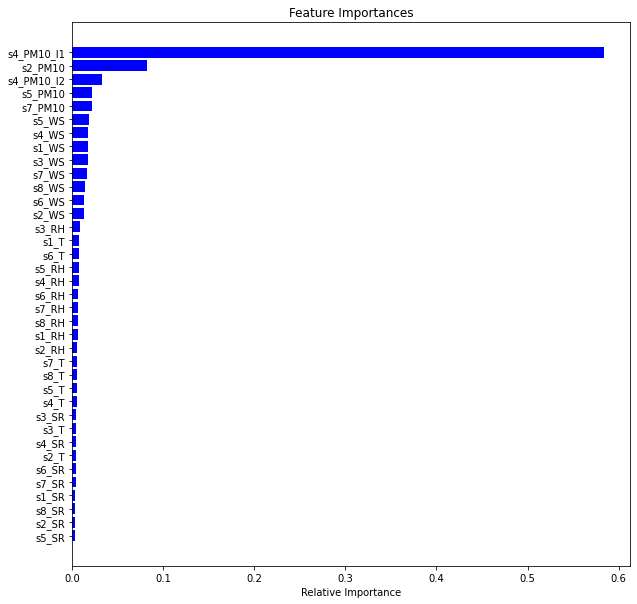

s5
Root mean squared error: 31.46
Mean absolute error: 16.54
R-squared: 0.74


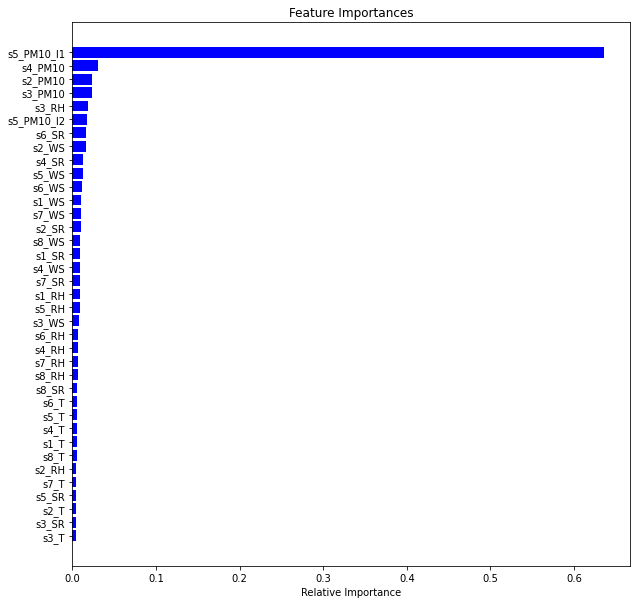

s6
Root mean squared error: 52.39
Mean absolute error: 28.97
R-squared: 0.45


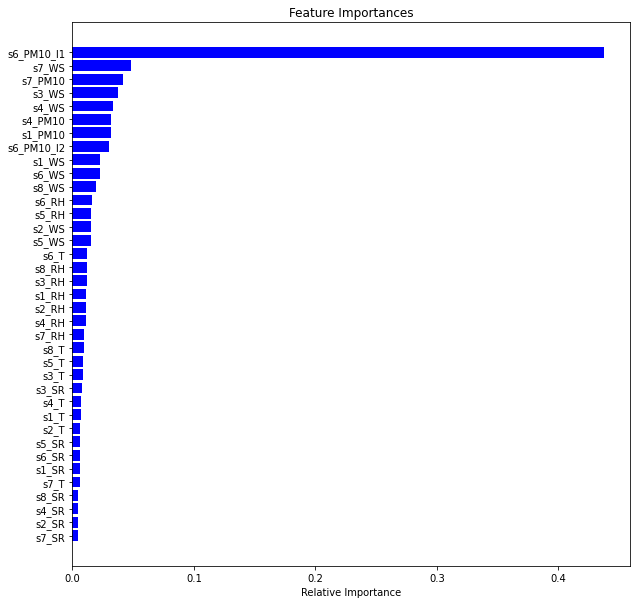

s7
Root mean squared error: 22.69
Mean absolute error: 12.36
R-squared: 0.67


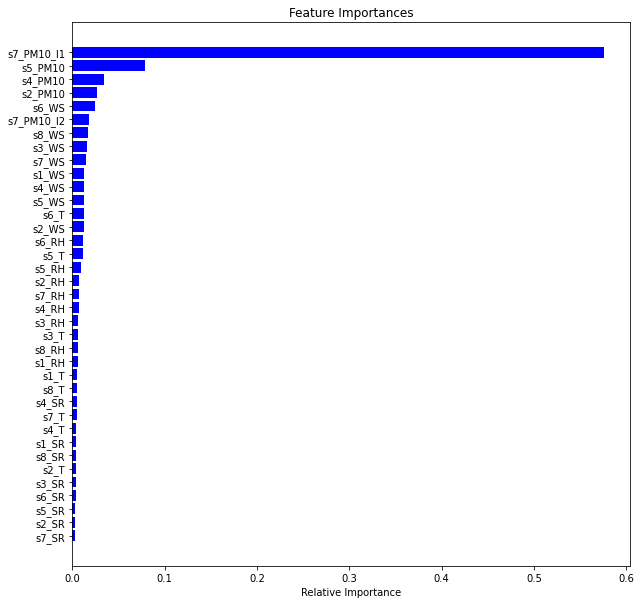

s8
Root mean squared error: 22.55
Mean absolute error: 12.48
R-squared: 0.68


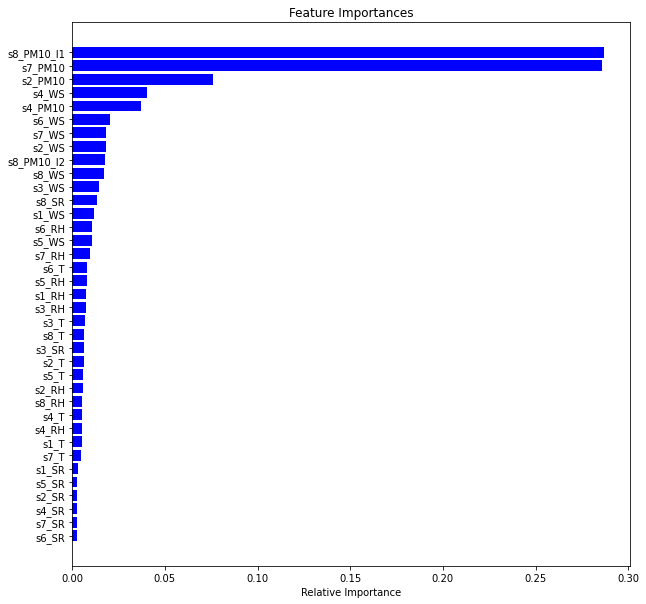

CPU times: user 13min 33s, sys: 282 ms, total: 13min 34s
Wall time: 13min 34s


In [ ]:
%%time
#Iterate the regression over the 8 stations
i=1
for key in dss:
  print(key)
  modelev2(dss[key],i)

  i=i+1

In [ ]:
#XGBoost
def modelev3(dss1,ns):
  y1=dss1.iloc[:,0]
  dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)

   #Fitting XGB regressor 
  xboost = XGBRegressor(n_estimators=200)

  xboost.fit(X_train, y_train)

  #Predict 
  xboost_pred = xboost.predict(X_test)

  print("Root mean squared error: %.2f"
        % sqrt(mean_squared_error(y_test, xboost_pred)))


In [ ]:
%%time
#Iterate the regression over the 8 stations
i=1
for key in dss:
  print(key)
  modelev3(dss[key],i)
  i=i+1

s1
[03:13:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Root mean squared error: 28.25
s2
[03:13:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Root mean squared error: 27.80
s3
[03:13:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Root mean squared error: 19.21
s4
[03:13:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Root mean squared error: 29.65
s5
[03:13:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Root mean squared error: 31.23
s6
[03:13:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Root mean squared error: 51.58
s7
[03:13:24] WARNING: /workspace/

In [ ]:
#Random Forest
def modelev5(dss1,ns):
  y1=dss1.iloc[:,0]
  dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.25, random_state=1234)
  sc = StandardScaler()
  X_train = sc.fit_transform(X_train)
  X_test = sc.transform(X_test)

  regressor = RandomForestRegressor(n_estimators=20, random_state=0)
  regressor.fit(X_train, y_train)
  y_pred = regressor.predict(X_test)
 
  print('Mean Absolute Error: %.2f'  %mean_absolute_error(y_test, y_pred))
  print('Root Mean Squared Error: %.2f' %np.sqrt(mean_squared_error(y_test, y_pred)))
  print('R^2: %.2f' %r2_score(y_test, y_pred))


In [ ]:
#Iterate the regression over the 8 stations
i=1
for key in dss:
  print(key)
  modelev5(dss[key],i)
  i=i+1

s1
Mean Absolute Error: 15.08
Root Mean Squared Error: 29.42
R^2: 0.60
s2
Mean Absolute Error: 16.31
Root Mean Squared Error: 28.70
R^2: 0.65
s3
Mean Absolute Error: 11.83
Root Mean Squared Error: 19.45
R^2: 0.67
s4
Mean Absolute Error: 17.38
Root Mean Squared Error: 29.51
R^2: 0.67
s5
Mean Absolute Error: 17.68
Root Mean Squared Error: 31.90
R^2: 0.74
s6
Mean Absolute Error: 30.82
Root Mean Squared Error: 52.73
R^2: 0.44
s7
Mean Absolute Error: 13.23
Root Mean Squared Error: 23.32
R^2: 0.66
s8
Mean Absolute Error: 13.15
Root Mean Squared Error: 22.98
R^2: 0.67


#Interpolation

## IDW

From: https://github.com/paulbrodersen/inverse_distance_weighting

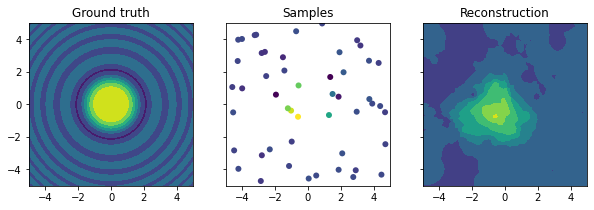

In [ ]:
#Example of
# create sample points with structured scores
X1 = 10 * np.random.rand(50, 2) -5

def func(x, y):
    return np.sin(x**2 + y**2) / (x**2 + y**2)

z1 = func(X1[:,0], X1[:,1])

# 'train'
idw_tree = idw.tree(X1, z1)

# 'test'
spacing = np.linspace(-5., 5., 100)
X2 = np.meshgrid(spacing, spacing)
grid_shape = X2[0].shape
X2 = np.reshape(X2, (2, -1)).T
z2 = idw_tree(X2)

# plot
fig, (ax1, ax2, ax3) = plt.subplots(1,3, sharex=True, sharey=True, figsize=(10,3))
ax1.contourf(spacing, spacing, func(*np.meshgrid(spacing, spacing)))
ax1.set_title('Ground truth')
ax2.scatter(X1[:,0], X1[:,1], c=z1, linewidths=0)
ax2.set_title('Samples')
ax3.contourf(spacing, spacing, z2.reshape(grid_shape))
ax3.set_title('Reconstruction')
plt.show()

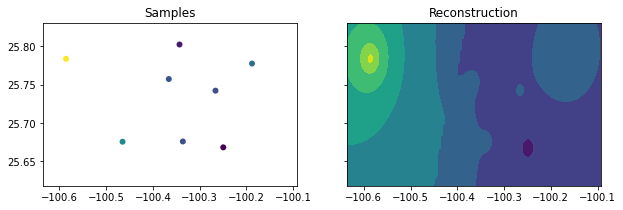

In [ ]:
#IDW interpolation for a date

val=[0]*8
i=0
for key in ds:
    val[i]=int(ds[key]['2014-07-04 06:00:00'].PM10.values)
    i=i+1

station_position=[0]*8

station_position[0] = [25.668366, -100.249512]
station_position[1] = [25.742053, -100.266144]
station_position[2] = [25.676027, -100.335939]
station_position[3] = [25.757178, -100.365981]
station_position[4] = [25.675702, -100.464958]
station_position[5] = [25.783503, -100.585897]
station_position[6] = [25.802037, -100.343083]
station_position[7] = [25.777312, -100.187950]

sp=np.array(station_position)
# create sample points with structured scores

# 'train'
idw_tree = idw.tree(sp, val)

# 'test'
spacingx = np.linspace(-100.635239, -100.092657, 100)
spacingy = np.linspace(25.618419, 25.830345, 100)

#mesh generation
X2 = np.meshgrid(spacingy, spacingx)
grid_shape = X2[0].shape
X2 = np.reshape(X2, (2, -1)).T
z2 = idw_tree(X2)

# plot
fig, (ax2, ax3) = plt.subplots(1,2, sharex=True, sharey=True, figsize=(10,3))
ax2.scatter(sp[:,1], sp[:,0], c=val, linewidths=0)
ax2.set_title('Samples')
ax3.contourf(spacingx, spacingy, z2.reshape(grid_shape).T)
ax3.set_title('Reconstruction')
plt.show()

In [ ]:
#Export data points to .csv
res=pd.DataFrame(X2,columns=['lat','lon'])
res['val']=z2
res
res.to_csv('inter.csv')

In [ ]:
#IDW Function
def spmodeval(df):
  val=[0]*8
  val=np.reshape(df.values,8).tolist()

  station_position=[0]*8
  station_position[0] = [25.668366, -100.249512]
  station_position[1] = [25.742053, -100.266144]
  station_position[2] = [25.676027, -100.335939]
  station_position[3] = [25.757178, -100.365981]
  station_position[4] = [25.675702, -100.464958]
  station_position[5] = [25.783503, -100.585897]
  station_position[6] = [25.802037, -100.343083]
  station_position[7] = [25.777312, -100.187950]
  sp=np.array(station_position)
  e=np.zeros(10)

  for k in range(0,8):
    sp2=np.delete(sp,k,axis=0)
    val2=np.delete(val,k,axis=0)
    idw_tree = idw.tree(X=sp2, z=val2)
    z2 = idw_tree(X=np.reshape(sp[k],(2, -1)).T)
    e[k]=int(z2-val[k])
  mae=np.sum(np.abs(e))/8
  rmse=np.sqrt(np.sum(e**2)/8)
  e[8]=mae
  e[9]=rmse
  return e

In [ ]:
%%time
#IDW interpolation: 1/d, k=3: calculates error of each station
df3=pd.DataFrame(columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse'])
for k in range(0,pm10.shape[0]):
  df=pm10.iloc[k]
  df3=df3.append(pd.DataFrame([spmodeval(df)],columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse']))

CPU times: user 48.8 s, sys: 146 ms, total: 48.9 s
Wall time: 48.9 s


In [ ]:
print(df3.mae.mean())
print(df3.rmse.mean())

24.265814176756095
31.69014315798482


In [ ]:
px.set_mapbox_access_token(mapboxtoken)
df = res
fig = px.scatter_mapbox(res, lat="lat", lon="lon",     color="val",
                  color_continuous_scale=px.colors.sequential.Rainbow,  zoom=10,opacity=0.5)
fig.show()

## Exponential

In [ ]:
#Exponential interpolation for a date
val=[0]*8
lam=9.05
i=0
for key in ds:
    val[i]=int(ds[key]['2014-07-04 06:00:00'].PM10.values)
    i=i+1


station_position=[0]*8
station_position[0] = [25.668366, -100.249512]
station_position[1] = [25.742053, -100.266144]
station_position[2] = [25.676027, -100.335939]
station_position[3] = [25.757178, -100.365981]
station_position[4] = [25.675702, -100.464958]
station_position[5] = [25.783503, -100.585897]
station_position[6] = [25.802037, -100.343083]
station_position[7] = [25.777312, -100.187950]
sp=np.array(station_position)



idw_tree = idwexp.tree(X=sp, z=val,la=lam)

# 'test'
spacingx = np.linspace(-100.635239, -100.092657, 100)
spacingy = np.linspace(25.618419, 25.830345, 100)

X2 = np.meshgrid(spacingy, spacingx)
grid_shape = X2[0].shape
X2 = np.reshape(X2, (2, -1)).T
z2 = idw_tree(X=X2,la=lam)



In [ ]:
#Export data points to .csv
res=pd.DataFrame(X2,columns=['lat','lon'])
res['val']=z2
res
res.to_csv('interexp.csv')

In [ ]:
#Exponential IDW function
def spmodeval2(df,lam):
  val=[0]*8

  val=np.reshape(df.values,8).tolist()

  station_position=[0]*8
  station_position[0] = [25.668366, -100.249512]
  station_position[1] = [25.742053, -100.266144]
  station_position[2] = [25.676027, -100.335939]
  station_position[3] = [25.757178, -100.365981]
  station_position[4] = [25.675702, -100.464958]
  station_position[5] = [25.783503, -100.585897]
  station_position[6] = [25.802037, -100.343083]
  station_position[7] = [25.777312, -100.187950]
  sp=np.array(station_position)
  e=np.zeros(10)

  for k in range(0,8):
    sp2=np.delete(sp,k,axis=0)
    val2=np.delete(val,k,axis=0)
    idw_tree = idwexp.tree(X=sp2, z=val2,la=lam)
    z2 = idw_tree(X=np.reshape(sp[k],(2, -1)).T,la=lam)
    e[k]=int(z2-val[k])
  mae=np.sum(np.abs(e))/8
  rmse=np.sqrt(np.sum(e**2)/8)
  e[8]=mae
  e[9]=rmse
  return e

### Parameter Estimation



In [ ]:
%%time
#Iterate between range to find best parameter
for l in range(0,21):
  df2=pd.DataFrame(columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse'])
  for k in range(0,pm10.shape[0]):
    df=pm10.iloc[k]
    df2=df2.append(pd.DataFrame([spmodeval2(df,l)],columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse']))
  print('lambda='+str(l))
  print(df2.mae.mean())
  print(df2.rmse.mean()) 

In [ ]:
#Results of error from parameter iteration
means=[24.628853538855406, 24.46711157928423, 24.397281188330044, 24.339624779988267, 24.293995679769587,\
       24.2575270681103, 24.23219238359379, 24.21509813856739, 24.206477678809538, 24.20727772147848, \
       24.21245133073764, 24.22690543495653,24.2461797962558,24.273174569310363,24.305322950557365, \
       24.341538215371486,24.3830937650008,24.429482905754973,24.476798762600673,24.528761533948476, 24.582077710811244]
rmse=[32.022440568902375, 31.880682252819632,31.810781386014124,31.75238051434688,31.705779948860023, \
      31.666322987680207, 31.637326448758156, 31.616732337432374, 31.604322147738745, 31.60131888467071,\
      31.60235649370712, 31.61325563395803, 31.62980165805126, 31.653806760978505, 31.68423642553149, \
      31.71949870637823, 31.760580319963157,31.80738490000625, 31.855309841981793, 31.909549431907898, 31.96590354899337]

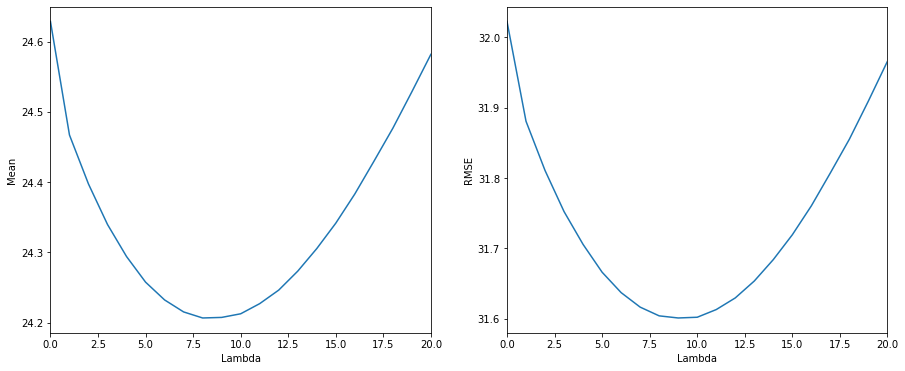

In [ ]:
#Plot results
dataexp = pd.DataFrame({"means": means,"rmse":rmse})
f, axes = plt.subplots(1,2,figsize=(15,6))
axes[0].plot(dataexp.means)
axes[0].set_xlabel("Lambda")
axes[0].set_ylabel("Mean")
axes[0].set(xlim=(0,20))
axes[1].plot(dataexp.rmse)
axes[1].set_xlabel("Lambda")
axes[1].set_ylabel("RMSE")
axes[1].set(xlim=(0,20))
plt.show()


In [ ]:
%%time
#Refined search
r=np.linspace(8,9,20)
for lq in range(0,19):
  l=r[lq]
  df2=pd.DataFrame(columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse'])
  for k in range(0,pm10.shape[0]):
    df=pm10.iloc[k]
    df2=df2.append(pd.DataFrame([spmodeval2(df,l)],columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse']))
  print('lambda='+str(l))
  print(df2.mae.mean())
  print(df2.rmse.mean()) 

lambda=8.0
24.206477678809538
31.604322147738745
lambda=8.052631578947368
24.205890980852313
31.603490506511402
lambda=8.105263157894736
24.20558429782922
31.6034058199031
lambda=8.157894736842104
24.205217611605953
31.602560251039474
lambda=8.210526315789474
24.205070937116645
31.60216365202695
lambda=8.263157894736842
24.20509093818337
31.601860012869246
lambda=8.31578947368421
24.205410955250947
31.60167735413053
lambda=8.368421052631579
24.20543095631767
31.6013860373851
lambda=8.421052631578947
24.20526428076164
31.601051689620608
lambda=8.473684210526315
24.205604298895942
31.601092495730835
lambda=8.526315789473685
24.20559096485146
31.600781035482946
lambda=8.578947368421053
24.2057109712518
31.600627784482505
lambda=8.631578947368421
24.20571763827404
31.60059183950052
lambda=8.68421052631579
24.206177662808685
31.60067457599088
lambda=8.736842105263158
24.206190996853167
31.600766091432202
lambda=8.789473684210526
24.206150994719717
31.600611152904875
lambda=8.842105263157894

In [ ]:
%%time
#Refined search in another range
r=np.linspace(9,10,21)
for lq in range(0,20):
  l=r[lq]
  df2=pd.DataFrame(columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse'])
  for k in range(0,pm10.shape[0]):
    df=pm10.iloc[k]
    df2=df2.append(pd.DataFrame([spmodeval(df,l)],columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse']))
  print('lambda='+str(l))
  print(df2.mae.mean())
  print(df2.rmse.mean()) 

lambda=9.0
24.20727772147848
31.60131888467071
lambda=9.05
24.207037708677795
31.60113414619508
lambda=9.1
24.2077510800576
31.601269691672943
lambda=9.15
24.207971091791563
31.601185035003283
lambda=9.2
24.208477785481893
31.601678403692755
lambda=9.25
24.208397781214998
31.601336391522555
lambda=9.3
24.20841111525948
31.600998741205235
lambda=9.35
24.208051096058455
31.600720440007255
lambda=9.4
24.20806443010294
31.6005621387424
lambda=9.45
24.20845111739293
31.60052274045708
lambda=9.5
24.208597791882234
31.60029700077205
lambda=9.55
24.209297829217558
31.600887511795943
lambda=9.6
24.208997813216705
31.600530633394758
lambda=9.65
24.209904528241506
31.60098015145421
lambda=9.7
24.21021787828684
31.601347469640753
lambda=9.75
24.21047789215425
31.60110218242318
lambda=9.8
24.210904581577683
31.60122907053442
lambda=9.85
24.21156461677956
31.601238430289683
lambda=9.9
24.211737959357833
31.601444424566353
lambda=9.95
24.212097978558855
31.60163537788002
CPU times: user 19min 54s, sy

## RBFN

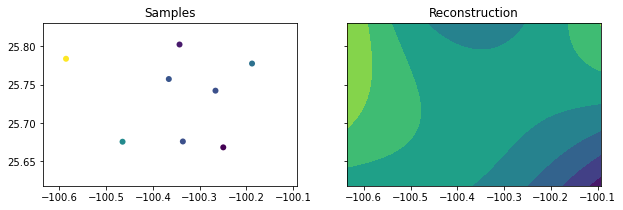

In [ ]:
#RBFN Interpolation for a date
station_position=[0]*8
station_position[0] = [25.668366, -100.249512]
station_position[1] = [25.742053, -100.266144]
station_position[2] = [25.676027, -100.335939]
station_position[3] = [25.757178, -100.365981]
station_position[4] = [25.675702, -100.464958]
station_position[5] = [25.783503, -100.585897]
station_position[6] = [25.802037, -100.343083]
station_position[7] = [25.777312, -100.187950]
sp=np.array(station_position)

val=[0]*8
i=0
for key in ds:
    val[i]=int(ds[key]['2014-07-04 06:00:00'].PM10.values)
    i=i+1
model = RBFN(hidden_shape=70, sigma=1.)
model.fit(sp,val)
X2 = np.meshgrid(spacingy, spacingx)
grid_shape = X2[0].shape
X2 = np.reshape(X2, (2, -1)).T
model.predict(sp)
z2=model.predict(X2)

fig, (ax2, ax3) = plt.subplots(1,2, sharex=True, sharey=True, figsize=(10,3))
ax2.scatter(sp[:,1], sp[:,0], c=val, linewidths=0)
ax2.set_title('Samples')
ax3.contourf(spacingx, spacingy, z2.reshape(grid_shape).T)
ax3.set_title('Reconstruction')
plt.show()

In [ ]:
#RBFN Interpolation Function
def spmodeval3(df,i):
  val=[0]*8
  val=np.reshape(df.values,8).tolist()

  station_position=[0]*8
  station_position[0] = [25.668366, -100.249512]
  station_position[1] = [25.742053, -100.266144]
  station_position[2] = [25.676027, -100.335939]
  station_position[3] = [25.757178, -100.365981]
  station_position[4] = [25.675702, -100.464958]
  station_position[5] = [25.783503, -100.585897]
  station_position[6] = [25.802037, -100.343083]
  station_position[7] = [25.777312, -100.187950]
  sp=np.array(station_position)
  e=np.zeros(10)
  model = RBFN(hidden_shape=70, sigma=i)
  for k in range(0,8):
    sp2=np.delete(sp,k,axis=0)
    val2=np.delete(val,k,axis=0)

    model.fit(sp2,val2)
    z2 = model.predict(np.reshape(sp[k],(2, -1)).T)

    e[k]=int(z2-val[k])
  mae=np.sum(np.abs(e))/8
  rmse=np.sqrt(np.sum(e**2)/8)
  e[8]=mae
  e[9]=rmse
  return e

In [ ]:
%%time
#RBFN interpolation: calculates error of each station
df3=pd.DataFrame(columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse'])
for k in range(0,pm10.shape[0]):
  df=pm10.iloc[k]
  df3=df3.append(pd.DataFrame([spmodeval3(df,20)],columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse']))
print(df3.mae.mean())
print(df3.rmse.mean())

CPU times: user 13min 22s, sys: 1.12 s, total: 13min 23s
Wall time: 13min 23s


In [ ]:
print(df3.mae.mean())
print(df3.rmse.mean())

35.085564563443384
44.09875774079715


### Parameter Estimation

In [ ]:
%%time
for i in range(0,11):
  df3=pd.DataFrame(columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse'])
  for k in range(0,pm10.shape[0]):
    df=pm10.iloc[k]
    df3=df3.append(pd.DataFrame([spmodeval3(df,i)],columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse']))
  print('sigma='+str(i))
  print(df3.mae.mean())
  print(df3.rmse.mean())

sigma=0
25.19390367486266
32.115991534210565
sigma=1
56.32000373353245
80.43201040950731
sigma=2
52.957511067256924
75.23837062384743
sigma=3
50.40911515280815
70.9874850192231
sigma=4
48.289202090778176
67.26304884532897
sigma=5
46.43738999413302
63.92397129437326
sigma=6
44.77860819243693
60.90468775635258
sigma=7
43.27935489892794
58.166345833024664
sigma=8
41.90692836951304
55.67483404099307
sigma=9
40.658868472985226
53.435020136623784
sigma=10
39.51466744893061
51.4098553657567
CPU times: user 2h 45min 5s, sys: 15.7 s, total: 2h 45min 21s
Wall time: 2h 45min 38s


In [ ]:
%%time
r=np.linspace(0,1,11)
for lq in range(0,10):
  l=r[lq]
  df3=pd.DataFrame(columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse'])
  for k in range(0,pm10.shape[0]):
    df=pm10.iloc[k]
    df3=df3.append(pd.DataFrame([spmodeval3(df,l)],columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse']))
  print('sigma='+str(l))
  print(df3.mae.mean())
  print(df3.rmse.mean())

sigma=0.0
25.19390367486266
32.115991534210565


In [ ]:
smean=[25.19390367486266, 56.32000373353245, 52.957511067256924, 50.40911515280815, 48.289202090778176, 46.43738999413302,\
       44.77860819243693, 43.27935489892794, 41.90692836951304, 40.658868472985226, 39.51466744893061]
srmse=[ 32.115991534210565, 80.43201040950731, 75.23837062384743, 70.9874850192231, 67.26304884532897, 63.92397129437326, \
       60.90468775635258, 58.166345833024664, 55.67483404099307, 53.435020136623784, 51.4098553657567]
datarbfn = pd.DataFrame({"smean": smean,"srmse":srmse})

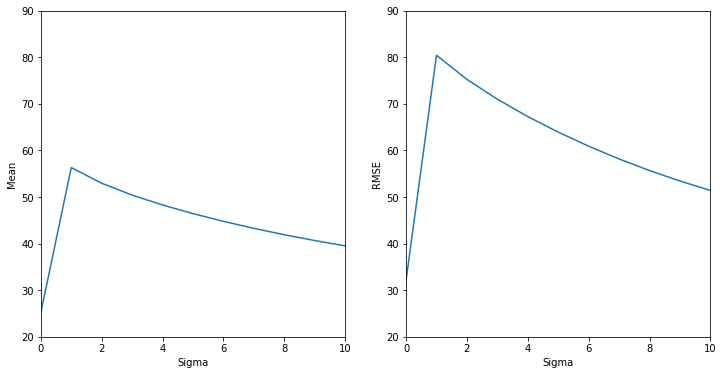

In [ ]:
f, axes = plt.subplots(1,2,figsize=(12,6))
axes[0].plot(datarbfn.smean)
axes[0].set_xlabel("Sigma")
axes[0].set_ylabel("Mean")
axes[0].set(xlim=(0,10),ylim=(20,90))
axes[1].plot(datarbfn.srmse)
axes[1].set_xlabel("Sigma")
axes[1].set_ylabel("RMSE")
axes[1].set(xlim=(0,10),ylim=(20,90))
plt.show()

## Green Function

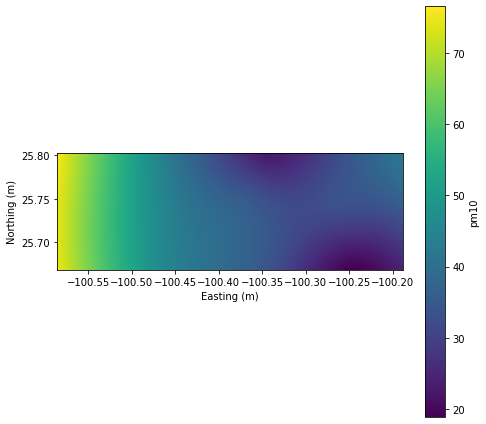

In [ ]:
#Green Function Interpolation
dsp=pd.DataFrame(sp,columns=['lat','lon'])
spline = vd.Spline().fit((dsp.lon,dsp.lat), np.array(val))
grid = spline.grid(spacing=0.0001, data_names=["pm10"])
plt.figure(figsize=(7, 6))
pc = grid.pm10.plot.pcolormesh(cmap="viridis", add_colorbar=True)
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.gca().set_aspect("equal")
plt.tight_layout()
plt.show()

In [ ]:
def spmodeval4(df):
  val=[0]*8


  val=np.reshape(df.values,8).tolist()

  station_position=[0]*8
  station_position[0] = [25.668366, -100.249512]
  station_position[1] = [25.742053, -100.266144]
  station_position[2] = [25.676027, -100.335939]
  station_position[3] = [25.757178, -100.365981]
  station_position[4] = [25.675702, -100.464958]
  station_position[5] = [25.783503, -100.585897]
  station_position[6] = [25.802037, -100.343083]
  station_position[7] = [25.777312, -100.187950]
  sp=np.array(station_position)
  e=np.zeros(10)
  dsp=pd.DataFrame(sp,columns=['lat','lon'])
  model = vd.Spline()
  

  for k in range(0,8):
    sp2=np.delete(sp,k,axis=0)
    val2=np.delete(val,k,axis=0)
    dsp2=pd.DataFrame(sp2,columns=['lat','lon'])

    model.fit((dsp2.lon,dsp2.lat), np.array(val2))
    z2 = model.predict(sp[k])

    e[k]=int(z2-val[k])
  mae=np.sum(np.abs(e))/8
  rmse=np.sqrt(np.sum(e**2)/8)
  e[8]=mae
  e[9]=rmse
  return e

In [ ]:
%%time
#IDW interpolation: 1/d, k=3: calculates error of each station
df3=pd.DataFrame(columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse'])
for k in range(0,pm10.shape[0]):
  df=pm10.iloc[k]
  df3=df3.append(pd.DataFrame([spmodeval4(df)],columns=['es1','es2','es3','es4','es5','es6','es7','es8','mae','rmse']))

CPU times: user 4min, sys: 12.4 s, total: 4min 12s
Wall time: 4min 12s


#Neural Network Regression

In [ ]:
#NN Regression Function
def modelev4(dss1,ns):
  # Create MLPRegressor object
  mlp = MLPRegressor()
  y1=dss1.iloc[:,0]
  dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)
  mlp.fit(X_train, y_train)
  # Make predictions using the testing set
  nnr_pred = mlp.predict(X_test)
  # The mean squared error
  print("Root mean squared error: %.2f"
  % sqrt(mean_squared_error(y_test, nnr_pred)))
  # The absolute squared error
  print("Mean absolute error: %.2f"
  % mean_absolute_error(y_test, nnr_pred))
  # Explained variance score: 1 is perfect prediction
  print('R-squared: %.2f' % r2_score(y_test, nnr_pred))
  plt.scatter(y_test, nnr_pred)
  plt.xlabel('Measured')
  plt.ylabel('Predicted')
  plt.title('Neural Network Regression Predicted vs Actual')
  plt.show()

Root mean squared error: 29.03
Mean absolute error: 14.89
R-squared: 0.61


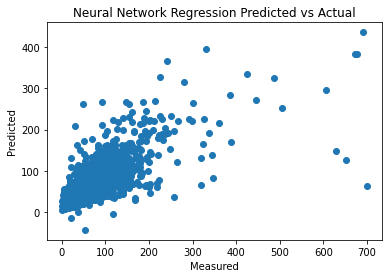

Root mean squared error: 28.00
Mean absolute error: 15.69
R-squared: 0.67


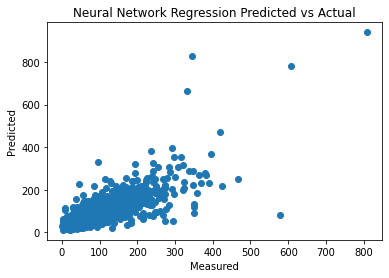

Root mean squared error: 19.32
Mean absolute error: 11.39
R-squared: 0.67


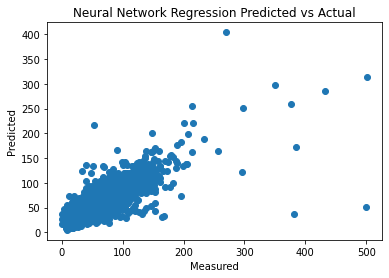

Root mean squared error: 28.90
Mean absolute error: 17.54
R-squared: 0.68


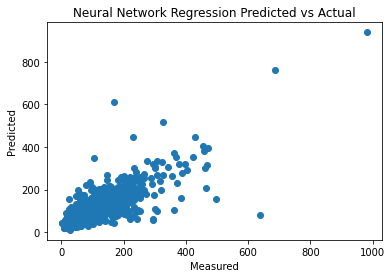

Root mean squared error: 33.49
Mean absolute error: 18.61
R-squared: 0.71


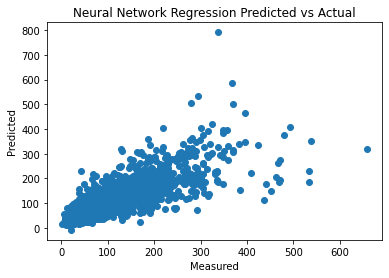

Root mean squared error: 50.89
Mean absolute error: 29.99
R-squared: 0.48


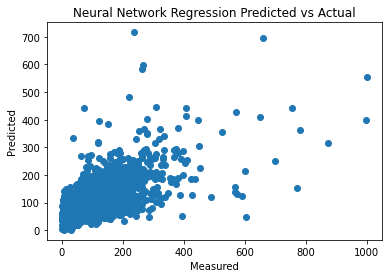

Root mean squared error: 21.71
Mean absolute error: 12.72
R-squared: 0.70


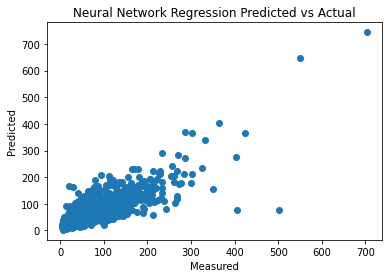

Root mean squared error: 23.39
Mean absolute error: 13.40
R-squared: 0.65


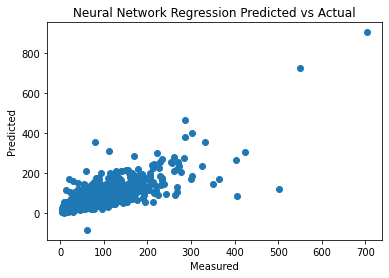

In [ ]:
#Calculates NN Regression in each station
i=1
for key in dss:
  modelev4(dss[key],i)
  i=i+1

# Datasets 1.1
A lo siguientes Datasets se les agrego las distancias en "x" y "y" de las 4 estaciones con mayor correlacion de PM10 

Se incluyen valores de PM10 de 4 estaciones con mayor correlacion a 1 lag

Datasets {dssv1,dssv2 ....}

## Distances (x,y)


In [ ]:
#station_lat = [25.668366, 25.742053, 25.676027, 25.757178, \
#          25.675702, 25.783503, 25.802037, 25.777312]
#station_long=[ -100.249512, -100.266144, -100.335939, -100.365981,\
 #             -100.464958, -100.585897, -100.343083, -100.187950]
#Station in UTM format https://entomologia.net/Conversor.htm

station_x=[374596.48696077376, 373005.3351313188, 365930.1166791818, 363007.85885634535,\
           352980.1529408633, 340984.63407377625, 365355.19305298384, 380884.1406071341]

station_y=[2839550.6794894706 ,2847727.846517724, 2840483.989527142, 2849503.01284310,\
           2840585.161780005, 2852665.928874652, 2854447.9680498196, 2851559.9865085697]

station_km=pd.DataFrame({"X": station_x, "Y": station_y})
station_km

,X,Y
0,374596.486961,2.839551e+06
1,373005.335131,2.847728e+06
2,365930.116679,2.840484e+06
3,363007.858856,2.849503e+06
4,352980.152941,2.840585e+06
5,340984.634074,2.852666e+06
6,365355.193053,2.854448e+06
7,380884.140607,2.851560e+06


In [ ]:
lst=[0,1,2,3,4,5,6,7]
co=list(combinations(lst,2))
dlx=[]
dly=[]
nd=[]

for t in co:
  dx=abs(station_x[t[0]] - station_x[t[1]])
  dy=abs(station_y[t[0]] - station_y[t[1]])
  n='s'+str(t[0]+1)+'<->'+'s'+str(t[1]+1)
  dlx=np.append(dlx,dx/1000)
  dly=np.append(dly,dy/1000)
  nd=np.append(nd,n)
station_km = pd.DataFrame({"Nd":nd, "distx": dlx,"disty": dly})
station_km.set_index("Nd", inplace=True )
station_km

,distx,disty
Nd,,
s1<->s2,1.591152,8.177167
s1<->s3,8.666370,0.933310
s1<->s4,11.588628,9.952333
s1<->s5,21.616334,1.034482
s1<->s6,33.611853,13.115249
s1<->s7,9.241294,14.897289
s1<->s8,6.287654,12.009307
s2<->s3,7.075218,7.243857
s2<->s4,9.997476,1.775166


## Data

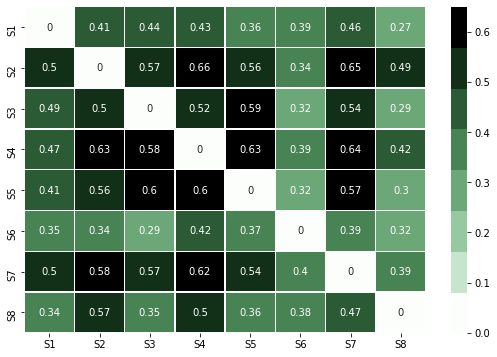

In [ ]:
#Using the results of the correlation analysis at 3 lags
correlacion1lags= pd.read_csv('./mtypollution/Correlacion1Lag.csv')
f, ax = plt.subplots(figsize=(9, 6))
a=sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.99)
sns.heatmap(correlacion1lags,annot=True, linewidths=.5, vmax=0.65, cmap=a, yticklabels=correlacion1lags.columns);

In [ ]:
#Inicializar DataFrames
dssv1= pd.DataFrame({'s1_PM10': ds['s1'].PM10})
dssv2= pd.DataFrame({'s2_PM10': ds['s2'].PM10})
dssv3= pd.DataFrame({'s3_PM10': ds['s3'].PM10})
dssv4= pd.DataFrame({'s4_PM10': ds['s4'].PM10})
dssv5= pd.DataFrame({'s5_PM10': ds['s5'].PM10})
dssv6= pd.DataFrame({'s6_PM10': ds['s6'].PM10})
dssv7= pd.DataFrame({'s7_PM10': ds['s7'].PM10})
dssv8= pd.DataFrame({'s8_PM10': ds['s8'].PM10})

#Escribir las 4 estaciones con mayor correlacion a 1 LAG y 
# las distancias en X,Y de esas estaciones


dssv1= dssv1.assign( s2_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                     s7_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                     s3_PM10= ds['s3'].PM10.shift(1).fillna(0),\
                     s4_PM10= ds['s4'].PM10.shift(1).fillna(0),\
                     s2_dx = 1.591152, s2_dy = 8.177167,\
                     s7_dx =	9.241294, s7_dy	= 14.897289, \
                     s3_dx = 8.666370,	s3_dy = 0.933310,\
                     s4_dx = 11.588628, s4_dy =	9.952333 )

dssv2 = dssv2.assign( s4_PM10 = ds['s4'].PM10.shift(1).fillna(0),\
                      s7_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                      s8_PM10 = ds ['s8'].PM10.shift(1).fillna(0),\
                      s5_PM10 = ds['s5'].PM10.shift(1).fillna(0),\
                      s4_dx = 9.997476, s4_dy = 1.77516,\
                      s7_dx =	7.650142, s7_dy	= 6.720122, \
                      s8_dx = 7.878805,	s8_dy = 3.832140,\
                      s5_dx = 20.025182, s5_dy = 7.142685)                    

dssv3 = dssv3.assign( s5_PM10 = ds['s5'].PM10.shift(1).fillna(0),\
                      s4_PM10 = ds['s4'].PM10.shift(1).fillna(0),\
                      s2_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                      s7_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                      s5_dx = 12.949964, s5_dy = 	0.101172,\
                      s4_dx =	2.922258, s4_dy	= 9.019023, \
                      s2_dx = 7.075218,	s2_dy = 7.243857,\
                      s7_dx = 0.574924, s7_dy = 13.963979)     


dssv4 = dssv4.assign(s2_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                     s7_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                     s5_PM10 = ds['s5'].PM10.shift(1).fillna(0),\
                     s3_PM10 = ds['s3'].PM10.shift(1).fillna(0),\
                      s2_dx = 9.997476, s2_dy = 1.775166,\
                      s7_dx =	2.347334, s7_dy	= 4.944955, \
                      s5_dx = 10.027706, s5_dy = 8.917851,\
                      s3_dx = 2.922258, s3_dy = 9.019023)   

dssv5 = dssv5.assign(s4_PM10 = ds['s4'].PM10.shift(1).fillna(0),\
                     s3_PM10 = ds['s3'].PM10.shift(1).fillna(0),\
                     s2_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                     s7_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                     s4_dx =	10.027706, s4_dy = 8.917851,\
                     s3_dx =	12.949964, s3_dy	= 0.101172, \
                     s2_dx = 20.025182, s2_dy = 7.142685,\
                     s7_dx = 12.375040, s7_dy = 13.862806)

dssv6 = dssv6.assign(s7_PM10 =ds['s7'].PM10.shift(1).fillna(0),\
                     s4_PM10 =ds['s4'].PM10.shift(1).fillna(0),\
                     s1_PM10 =ds['s1'].PM10.shift(1).fillna(0),\
                     s8_PM10 =ds['s8'].PM10.shift(1).fillna(0),\
                     s7_dx = 24.370559, s7_dy = 1.782039,\
                     s4_dx =	22.023225, s4_dy = 3.162916, \
                     s1_dx = 33.611853, s1_dy = 13.115249,\
                     s8_dx = 39.899507, s8_dy = 1.105942)

dssv7 = dssv7.assign(s2_PM10 =ds['s5'].PM10.shift(1).fillna(0),\
                     s4_PM10 =ds['s4'].PM10.shift(1).fillna(0),\
                     s5_PM10 =ds['s2'].PM10.shift(1).fillna(0),\
                     s3_PM10 =ds['s3'].PM10.shift(1).fillna(0),\
                     s2_dx = 7.650142, s2_dy = 6.720122,\
                     s4_dx = 2.347334, s4_dy = 4.944955,\
                     s5_dx = 12.375040, s5_dy = 13.862806,\
                     s3_dx = 0.574924, s3_dy = 13.963979)

dssv8 = dssv8.assign(s2_PM10 =ds['s2'].PM10.shift(1).fillna(0),\
                     s4_PM10 =ds['s4'].PM10.shift(1).fillna(0),\
                     s7_PM10 =ds['s7'].PM10.shift(1).fillna(0),\
                     s6_PM10 =ds['s6'].PM10.shift(1).fillna(0),\
                     s2_dx = 7.878805, s2_dy = 3.832140,\
                     s4_dx = 17.876282, s4_dy = 2.056974,\
                     s7_dx = 15.528948, s7_dy = 2.887982,\
                     s6_dx = 39.899507, s6_dy = 1.105942)

In [ ]:
#---------------------------
#-Velocidad del Viento (WS)-
#---------------------------
#-----Estación 1 vs WS -----
ss=['s1','s2','s3','s4','s5','s6','s7','s8']
#as1ws=dfcs1ws.nlargest(1,'s8')
ds1ws={'s':ss,'Lag':[8,7,9,8,9,9,0,0]}
dfs1ws =pd.DataFrame(ds1ws)
#-----Estación 2 vs WS -----
#as2ws=dfcs2ws.nlargest(1,'s7')
ds2ws={'s':ss,'Lag':[9,4,9,9,9,9,9,9]}
dfs2ws =pd.DataFrame(ds2ws)
#-----Estación 3 vs WS -----
#as3ws=dfcs3ws.nlargest(1,'s8')
ds3ws={'s':ss,'Lag':[4,4,4,4,5,5,4,5]}
dfs3ws =pd.DataFrame(ds3ws)
#-----Estación 4 vs WS -----
#as4ws=dfcs4ws.nlargest(1,'s8')
ds4ws={'s':ss,'Lag':[3,3,3,4,5,4,4,4]}
dfs4ws =pd.DataFrame(ds4ws)
#-----Estación 5 vs WS -----
#as5ws=dfcs5ws.nlargest(1,'s8') 
ds5ws={'s':ss,'Lag':[4,3,4,4,4,4,4,4]}
dfs5ws =pd.DataFrame(ds5ws)
#-----Estación 6 vs WS -----
#as6ws=dfcs6ws.nlargest(1,'s8')
ds6ws={'s':ss,'Lag':[9,9,0,0,9,9,0,0]}
dfs6ws =pd.DataFrame(ds6ws)
#-----Estación 7 vs WS -----
#as7ws=dfcs7ws.nlargest(1,'s8')
ds7ws={'s':ss,'Lag':[8,6,9,7,9,9,8,9]}
dfs7ws =pd.DataFrame(ds7ws)
#-----Estación 8 vs WS -----
#as8ws=dfcs8ws.nlargest(1,'s8') 
ds8ws={'s':ss,'Lag':[9,9,9,0,9,9,9,9]}
dfs8ws =pd.DataFrame(ds8ws)
#-----WS Dataframe -----
wsds={}
wsds["s{0}".format(1)]=dfs1ws
wsds["s{0}".format(2)]=dfs2ws
wsds["s{0}".format(3)]=dfs3ws
wsds["s{0}".format(4)]=dfs4ws
wsds["s{0}".format(5)]=dfs5ws
wsds["s{0}".format(6)]=dfs6ws
wsds["s{0}".format(7)]=dfs7ws
wsds["s{0}".format(8)]=dfs8ws

In [ ]:
#---------------------------
#--Humedad Relativa  (HR)---
#---------------------------
#-----Estación 1 vs RH -----
#as1rh=dfcs1rh.nlargest(1,'s8')
ds1rh={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs1rh =pd.DataFrame(ds1rh)
#-----Estación 2 vs RH -----
#as2rh=dfcs2rh.nlargest(1,'s8')
ds2rh={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs2rh =pd.DataFrame(ds2rh)
#-----Estación 3 vs RH -----
#as3rh=dfcs3rh.nlargest(1,'s8')
ds3rh={'s':ss,'Lag':[5,5,0,0,0,0,0,6]}
dfs3rh =pd.DataFrame(ds3rh)
#-----Estación 4 vs RH -----
#as4rh=dfcs4rh.nlargest(1,'s8')
ds4rh={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs4rh =pd.DataFrame(ds4rh)
#-----Estación 5 vs RH -----
#as5rh=dfcs5rh.nlargest(1,'s8')
ds5rh={'s':ss,'Lag':[4,0,0,0,0,0,0,0]}
dfs5rh =pd.DataFrame(ds5rh)
#-----Estación 6 vs RH -----
#as6rh=dfcs6rh.nlargest(1,'s8')
ds6rh={'s':ss,'Lag':[3,2,2,2,2,2,2,3]}
dfs6rh =pd.DataFrame(ds6rh)
#-----Estación 7 vs RH -----
#as7rh=dfcs7rh.nlargest(1,'s7')
ds7rh={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs7rh =pd.DataFrame(ds7rh)
#-----Estación 8 vs RH -----
#as8rh=dfcs8rh.nlargest(1,'s8')
ds8rh={'s':ss,'Lag':[4,4,4,4,4,4,4,4]}
dfs8rh =pd.DataFrame(ds8rh)
#-----PRS Dataframe -----
rhds={}
rhds["s{0}".format(1)]=dfs1rh
rhds["s{0}".format(2)]=dfs2rh
rhds["s{0}".format(3)]=dfs3rh
rhds["s{0}".format(4)]=dfs4rh
rhds["s{0}".format(5)]=dfs5rh
rhds["s{0}".format(6)]=dfs6rh
rhds["s{0}".format(7)]=dfs7rh
rhds["s{0}".format(8)]=dfs8rh
#rhds['s8']

In [ ]:
#---------------------------
#--Radiación Solar  (SR)----
#---------------------------
#-----Estación 1 vs SR -----
#as1sr=dfcs1sr.nlargest(1,'s8')
ds1sr={'s':ss,'Lag':[1,1,1,1,1,1,1,1]}
dfs1sr =pd.DataFrame(ds1sr)
#-----Estación 2 vs SR -----
#as2sr=dfcs2sr.nlargest(1,'s8')
ds2sr={'s':ss,'Lag':[0,3,3,3,3,0,0,3]}
dfs2sr =pd.DataFrame(ds2sr)
#-----Estación 3 vs SR -----
#as3sr=dfcs3sr.nlargest(1,'s8')
ds3sr={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs3sr =pd.DataFrame(ds3sr)
#-----Estación 4 vs SR -----
#as4sr=dfcs4sr.nlargest(1,'s8')
ds4sr={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs4sr =pd.DataFrame(ds4sr)
#-----Estación 5 vs SR -----
#as5sr=dfcs5sr.nlargest(1,'s8')
ds5sr={'s':ss,'Lag':[0,0,7,0,7,0,0,8]}
dfs5sr =pd.DataFrame(ds5sr)
#-----Estación 6 vs SR -----
#as6sr=dfcs6sr.nlargest(1,'s8')
ds6sr={'s':ss,'Lag':[5,5,5,5,5,5,5,5]}
dfs6sr =pd.DataFrame(ds6sr)
#-----Estación 7 vs SR -----
#as7sr=dfcs7sr.nlargest(1,'s8')
ds7sr={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs7sr =pd.DataFrame(ds7sr)
#-----Estación 8 vs SR -----
#as8sr=dfcs8sr.nlargest(1,'s7')
ds8sr={'s':ss,'Lag':[7,7,7,7,7,7,7,0]}
dfs8sr =pd.DataFrame(ds8sr)
#-----SR Dataframe -----
srds={}
srds["s{0}".format(1)]=dfs1sr
srds["s{0}".format(2)]=dfs2sr
srds["s{0}".format(3)]=dfs3sr
srds["s{0}".format(4)]=dfs4sr
srds["s{0}".format(5)]=dfs5sr
srds["s{0}".format(6)]=dfs6sr
srds["s{0}".format(7)]=dfs7sr
srds["s{0}".format(8)]=dfs8sr
#srds['s8']

In [ ]:
#---------------------------
#------Temperatura  (T)-----
#---------------------------
#-----Estación 1 vs T -----
#as1t=dfcs1t.nlargest(1,'s8')
ds1t={'s':ss,'Lag':[0,0,0,0,0,0,0,0]}
dfs1t =pd.DataFrame(ds1t)
#-----Estación 2 vs T -----
#as2t=dfcs2t.nlargest(1,'s8')
ds2t={'s':ss,'Lag':[9,9,9,9,9,9,9,9]}
dfs2t =pd.DataFrame(ds2t)
#-----Estación 3 vs T -----
#as3t=dfcs3t.nlargest(1,'s8')
ds3t={'s':ss,'Lag':[6,6,6,6,6,6,6,6]}
dfs3t =pd.DataFrame(ds3t)
#-----Estación 4 vs T -----
#as4t=dfcs4t.nlargest(1,'s8')
ds4t={'s':ss,'Lag':[9,9,9,9,9,9,9,9]}
dfs4t =pd.DataFrame(ds4t)
#-----Estación 5 vs T -----
#as5t=dfcs5t.nlargest(1,'s8')
ds5t={'s':ss,'Lag':[5,5,5,5,5,6,5,5]}
dfs5t =pd.DataFrame(ds5t)
#-----Estación 6 vs T -----
#as6t=dfcs6t.nlargest(1,'s8')
ds6t={'s':ss,'Lag':[2,2,2,2,2,2,2,2]}
dfs6t =pd.DataFrame(ds6t)
#-----Estación 7 vs T -----
#as7t=dfcs7t.nlargest(1,'s8')
ds7t={'s':ss,'Lag':[9,9,9,9,0,0,9,9]}
dfs7t =pd.DataFrame(ds7t)
#-----Estación 8 vs T -----
#as8t=dfcs8t.nlargest(1,'s8')
ds8t={'s':ss,'Lag':[4,4,4,4,4,4,4,4]}
dfs8t =pd.DataFrame(ds8t)
#-----SR Dataframe -----
tds={}
tds["s{0}".format(1)]=dfs1t
tds["s{0}".format(2)]=dfs2t
tds["s{0}".format(3)]=dfs3t
tds["s{0}".format(4)]=dfs4t
tds["s{0}".format(5)]=dfs5t
tds["s{0}".format(6)]=dfs6t
tds["s{0}".format(7)]=dfs7t
tds["s{0}".format(8)]=dfs8t
#tds['s8']

In [ ]:
def createds(dss,es,dspr,pr,cname):
  ss=['s1','s2','s3','s4','s5','s6','s7','s8']
  for i in range(0,8):
    a=dspr[es][i:i+1]['Lag'].item()
    datap=ds[ss[i]][pr].shift(a).fillna(0)
    dss[cname[i]]=pd.DataFrame(datap,index=dates)
  return dss

In [ ]:
#Nombre asignado a las columnas
rhname=['s1_RH','s2_RH','s3_RH','s4_RH','s5_RH','s6_RH','s7_RH','s8_RH']
tname=['s1_T','s2_T','s3_T','s4_T','s5_T','s6_T','s7_T','s8_T']
srname=['s1_SR','s2_SR','s3_SR','s4_SR','s5_SR','s6_SR','s7_SR','s8_SR']
wsname=['s1_WS','s2_WS','s3_WS','s4_WS','s5_WS','s6_WS','s7_WS','s8_WS']

#Funciones que agregan las columnas de (RH,SR,WS,T)
dssv1= createds(dssv1,'s1',rhds,'RH',rhname)
dssv1= createds(dssv1,'s1',srds,'SR',srname)
dssv1= createds(dssv1,'s1',tds,'T',tname)
dssv1= createds(dssv1,'s1',wsds,'WS',wsname)

#Quitar las columnas que contengan la estacion a evaluar (s1)
dssv1 = dssv1.drop(dssv1.columns[dssv1.columns.str.match('s1')], axis=1)
dssv1.head()

,s2_PM10,s7_PM10,s3_PM10,s4_PM10,s2_dx,s2_dy,s7_dx,s7_dy,s3_dx,s3_dy,s4_dx,s4_dy,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,46.0,36.0,31.0,34.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.86,17.33,18.62,15.12,15.69,18.18,16.96,0.0,0.0,0.0,0.0,0.0,1.8,5.2
2012-01-01 01:00:00,861.0,115.0,166.0,300.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,45.0,38.0,34.0,36.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.67,16.62,17.61,14.35,15.08,17.26,16.44,0.0,0.0,0.0,0.0,0.0,1.7,5.4
2012-01-01 02:00:00,991.0,268.0,150.0,255.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,50.0,39.0,34.0,33.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.75,16.24,17.13,14.86,14.83,17.05,15.71,0.0,0.0,0.0,0.0,0.0,4.3,9.0
2012-01-01 03:00:00,830.0,446.0,165.0,433.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,44.0,36.0,34.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.84,16.88,16.98,14.23,14.80,18.32,15.81,0.0,0.0,0.0,0.0,0.0,8.0,8.2
2012-01-01 04:00:00,966.0,272.0,158.0,216.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,46.0,35.0,28.0,32.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.96,16.33,17.75,14.37,14.16,18.00,15.49,0.0,0.0,0.0,0.0,0.0,4.7,7.0


In [ ]:
dssv2= createds(dssv2,'s2',rhds,'RH',rhname)
dssv2= createds(dssv2,'s2',srds,'SR',srname)
dssv2= createds(dssv2,'s2',tds,'T',tname)
dssv2= createds(dssv2,'s2',wsds,'WS',wsname)
dssv2 = dssv2.drop(dssv2.columns[dssv2.columns.str.match('s2')], axis=1)
dssv2.head()

,s4_PM10,s7_PM10,s8_PM10,s5_PM10,s4_dx,s4_dy,s7_dx,s7_dy,s8_dx,s8_dy,s5_dx,s5_dy,s1_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,9.997476,1.77516,7.650142,6.720122,7.878805,3.83214,20.025182,7.142685,53.0,36.0,31.0,34.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,300.0,115.0,998.0,508.0,9.997476,1.77516,7.650142,6.720122,7.878805,3.83214,20.025182,7.142685,54.0,38.0,34.0,36.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,255.0,268.0,999.0,427.0,9.997476,1.77516,7.650142,6.720122,7.878805,3.83214,20.025182,7.142685,50.0,39.0,34.0,33.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,433.0,446.0,716.0,531.0,9.997476,1.77516,7.650142,6.720122,7.878805,3.83214,20.025182,7.142685,43.0,36.0,34.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,216.0,272.0,198.0,451.0,9.997476,1.77516,7.650142,6.720122,7.878805,3.83214,20.025182,7.142685,38.0,35.0,28.0,32.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
dssv3= createds(dssv3,'s3',rhds,'RH',rhname)
dssv3= createds(dssv3,'s3',srds,'SR',srname)
dssv3= createds(dssv3,'s3',tds,'T',tname)
dssv3= createds(dssv3,'s3',wsds,'WS',wsname)
dssv3 = dssv3.drop(dssv3.columns[dssv3.columns.str.match('s3')], axis=1)
dssv3.head()

,s5_PM10,s4_PM10,s2_PM10,s7_PM10,s5_dx,s5_dy,s4_dx,s4_dy,s2_dx,s2_dy,s7_dx,s7_dy,s1_RH,s2_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s4_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,12.949964,0.101172,2.922258,9.019023,7.075218,7.243857,0.574924,13.963979,0.0,0.0,31.0,34.0,34.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,508.0,300.0,861.0,115.0,12.949964,0.101172,2.922258,9.019023,7.075218,7.243857,0.574924,13.963979,0.0,0.0,34.0,36.0,35.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,427.0,255.0,991.0,268.0,12.949964,0.101172,2.922258,9.019023,7.075218,7.243857,0.574924,13.963979,0.0,0.0,34.0,33.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,531.0,433.0,830.0,446.0,12.949964,0.101172,2.922258,9.019023,7.075218,7.243857,0.574924,13.963979,0.0,0.0,34.0,34.0,34.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,451.0,216.0,966.0,272.0,12.949964,0.101172,2.922258,9.019023,7.075218,7.243857,0.574924,13.963979,0.0,0.0,28.0,32.0,34.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.8,1.1,6.8,0.0,0.0,1.8,0.0


In [ ]:
dssv4= createds(dssv4,'s4',rhds,'RH',rhname)
dssv4= createds(dssv4,'s4',srds,'SR',srname)
dssv4= createds(dssv4,'s4',tds,'T',tname)
dssv4= createds(dssv4,'s4',wsds,'WS',wsname)
dssv4 = dssv4.drop(dssv4.columns[dssv4.columns.str.match('s4')], axis=1)
dssv4.head()

,s2_PM10,s7_PM10,s5_PM10,s3_PM10,s2_dx,s2_dy,s7_dx,s7_dy,s5_dx,s5_dy,s3_dx,s3_dy,s1_RH,s2_RH,s3_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,53.0,46.0,36.0,34.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,861.0,115.0,508.0,166.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,54.0,45.0,38.0,36.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,991.0,268.0,427.0,150.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,50.0,50.0,39.0,33.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,830.0,446.0,531.0,165.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,43.0,44.0,36.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.8,1.1,4.2,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,966.0,272.0,451.0,158.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,38.0,46.0,35.0,32.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.5,1.7,2.6,0.0,3.6,1.8,5.2


In [ ]:
dssv5= createds(dssv5,'s5',rhds,'RH',rhname)
dssv5= createds(dssv5,'s5',srds,'SR',srname)
dssv5= createds(dssv5,'s5',tds,'T',tname)
dssv5= createds(dssv5,'s5',wsds,'WS',wsname)
dssv5 = dssv5.drop(dssv5.columns[dssv5.columns.str.match('s5')], axis=1)
dssv5.head()

,s4_PM10,s3_PM10,s2_PM10,s7_PM10,s4_dx,s4_dy,s3_dx,s3_dy,s2_dx,s2_dy,s7_dx,s7_dy,s1_RH,s2_RH,s3_RH,s4_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,0.0,46.0,36.0,31.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,300.0,166.0,861.0,115.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,0.0,45.0,38.0,34.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,255.0,150.0,991.0,268.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,0.0,50.0,39.0,34.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,433.0,165.0,830.0,446.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,0.0,44.0,36.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.1,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,216.0,158.0,966.0,272.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,53.0,46.0,35.0,28.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.8,1.7,4.2,6.8,3.6,1.8,5.2


In [ ]:
dssv6= createds(dssv6,'s6',rhds,'RH',rhname)
dssv6= createds(dssv6,'s6',srds,'SR',srname)
dssv6= createds(dssv6,'s6',tds,'T',tname)
dssv6= createds(dssv6,'s6',wsds,'WS',wsname)
dssv6 = dssv6.drop(dssv6.columns[dssv6.columns.str.match('s6')], axis=1)
dssv6.head()



,s7_PM10,s4_PM10,s1_PM10,s8_PM10,s7_dx,s7_dy,s4_dx,s4_dy,s1_dx,s1_dy,s8_dx,s8_dy,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,4.2,6.8,0.0,1.8,5.2
2012-01-01 01:00:00,115.0,300.0,213.0,998.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,2.6,2.4,0.0,1.7,5.4
2012-01-01 02:00:00,268.0,255.0,206.0,999.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,0.0,46.0,36.0,31.0,34.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.11,16.86,17.33,18.62,15.12,18.18,16.96,0.0,0.0,2.5,5.3,0.0,4.3,9.0
2012-01-01 03:00:00,446.0,433.0,226.0,716.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,53.0,45.0,38.0,34.0,36.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.97,16.67,16.62,17.61,14.35,17.26,16.44,0.0,0.0,5.5,8.1,0.0,8.0,8.2
2012-01-01 04:00:00,272.0,216.0,179.0,198.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,54.0,50.0,39.0,34.0,33.0,41.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.65,16.75,16.24,17.13,14.86,17.05,15.71,0.0,0.0,3.1,11.0,0.0,4.7,7.0


In [ ]:
dssv7= createds(dssv7,'s7',rhds,'RH',rhname)
dssv7= createds(dssv7,'s7',srds,'SR',srname)
dssv7= createds(dssv7,'s7',tds,'T',tname)
dssv7= createds(dssv7,'s7',wsds,'WS',wsname)
dssv7 = dssv7.drop(dssv7.columns[dssv7.columns.str.match('s7')], axis=1)
dssv7.head()

,s2_PM10,s4_PM10,s5_PM10,s3_PM10,s2_dx,s2_dy,s4_dx,s4_dy,s5_dx,s5_dy,s3_dx,s3_dy,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,53.0,46.0,36.0,31.0,34.0,34.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.12,15.69,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,508.0,300.0,861.0,166.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,54.0,45.0,38.0,34.0,36.0,35.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.35,15.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,427.0,255.0,991.0,150.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,50.0,50.0,39.0,34.0,33.0,35.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.86,14.83,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,531.0,433.0,830.0,165.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,43.0,44.0,36.0,34.0,34.0,34.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.23,14.80,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,451.0,216.0,966.0,158.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,38.0,46.0,35.0,28.0,32.0,34.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.37,14.16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
dssv8= createds(dssv8,'s8',rhds,'RH',rhname)
dssv8= createds(dssv8,'s8',srds,'SR',srname)
dssv8= createds(dssv8,'s8',tds,'T',tname)
dssv8= createds(dssv8,'s8',wsds,'WS',wsname)
dssv8 = dssv8.drop(dssv8.columns[dssv8.columns.str.match('s8')], axis=1)
dssv8.head()


,s2_PM10,s4_PM10,s7_PM10,s6_PM10,s2_dx,s2_dy,s4_dx,s4_dy,s7_dx,s7_dy,s6_dx,s6_dy,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,6.8,0.0,0.0,0.0
2012-01-01 01:00:00,861.0,300.0,115.0,256.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,2.4,0.0,0.0,0.0
2012-01-01 02:00:00,991.0,255.0,268.0,290.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.3,0.0,0.0,0.0
2012-01-01 03:00:00,830.0,433.0,446.0,167.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,8.1,0.0,0.0,0.0
2012-01-01 04:00:00,966.0,216.0,272.0,150.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,53.0,46.0,36.0,31.0,34.0,34.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.11,16.86,17.33,18.62,15.12,15.69,18.18,0.0,0.0,0.0,11.0,0.0,0.0,0.0


## Datasets 1.2
No se incluyen los parametros de PM10

Dataset {dssw1, dssw2, dssw3, ...}


In [ ]:
dssw1 = dssv1.drop(dssv1.columns[dssv1.columns.str.contains('PM10')], axis=1)
dssw2 = dssv2.drop(dssv2.columns[dssv2.columns.str.contains('PM10')], axis=1)
dssw3 = dssv3.drop(dssv3.columns[dssv3.columns.str.contains('PM10')], axis=1)
dssw4 = dssv4.drop(dssv4.columns[dssv4.columns.str.contains('PM10')], axis=1)
dssw5 = dssv5.drop(dssv5.columns[dssv5.columns.str.contains('PM10')], axis=1)
dssw6 = dssv6.drop(dssv6.columns[dssv6.columns.str.contains('PM10')], axis=1)
dssw7 = dssv7.drop(dssv7.columns[dssv7.columns.str.contains('PM10')], axis=1)
dssw8 = dssv8.drop(dssv8.columns[dssv8.columns.str.contains('PM10')], axis=1)

dssw8.head()

,s2_dx,s2_dy,s4_dx,s4_dy,s7_dx,s7_dy,s6_dx,s6_dy,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS
2012-01-01 00:00:00,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,6.8,0.0,0.0,0.0
2012-01-01 01:00:00,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,2.4,0.0,0.0,0.0
2012-01-01 02:00:00,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.3,0.0,0.0,0.0
2012-01-01 03:00:00,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,8.1,0.0,0.0,0.0
2012-01-01 04:00:00,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,53.0,46.0,36.0,31.0,34.0,34.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.11,16.86,17.33,18.62,15.12,15.69,18.18,0.0,0.0,0.0,11.0,0.0,0.0,0.0


#Datasets 2.1
En los siguientes dataset se introduce mas LAGs para las variables de PM10


In [ ]:
#station_lat = [25.668366, 25.742053, 25.676027, 25.757178, \
#          25.675702, 25.783503, 25.802037, 25.777312]
#station_long=[ -100.249512, -100.266144, -100.335939, -100.365981,\
 #             -100.464958, -100.585897, -100.343083, -100.187950]
#Station in UTM format https://entomologia.net/Conversor.htm

station_x=[374596.48696077376, 373005.3351313188, 365930.1166791818, 363007.85885634535,\
           352980.1529408633, 340984.63407377625, 365355.19305298384, 380884.1406071341]

station_y=[2839550.6794894706 ,2847727.846517724, 2840483.989527142, 2849503.01284310,\
           2840585.161780005, 2852665.928874652, 2854447.9680498196, 2851559.9865085697]

station_km=pd.DataFrame({"X": station_x, "Y": station_y})


In [ ]:
lst=[0,1,2,3,4,5,6,7]
co=list(combinations(lst,2))
dlx=[]
dly=[]
nd=[]

for t in co:
  dx=abs(station_x[t[0]] - station_x[t[1]])
  dy=abs(station_y[t[0]] - station_y[t[1]])
  n='s'+str(t[0]+1)+'<->'+'s'+str(t[1]+1)
  dlx=np.append(dlx,dx/1000)
  dly=np.append(dly,dy/1000)
  nd=np.append(nd,n)
station_km = pd.DataFrame({"Nd":nd, "distx": dlx,"disty": dly})
station_km.set_index("Nd", inplace=True)

In [ ]:
#Inicializar DataFrames
dssx1= pd.DataFrame({'s1_PM10': ds['s1'].PM10})
dssx2= pd.DataFrame({'s2_PM10': ds['s2'].PM10})
dssx3= pd.DataFrame({'s3_PM10': ds['s3'].PM10})
dssx4= pd.DataFrame({'s4_PM10': ds['s4'].PM10})
dssx5= pd.DataFrame({'s5_PM10': ds['s5'].PM10})
dssx6= pd.DataFrame({'s6_PM10': ds['s6'].PM10})
dssx7= pd.DataFrame({'s7_PM10': ds['s7'].PM10})
dssx8= pd.DataFrame({'s8_PM10': ds['s8'].PM10})

#Escribir las 4 estaciones con mayor correlacion a X LAGs (Donde X es relacionado con los lags de WS) y 
# las distancias en X,Y de esas estaciones

#ds1ws={'s':ss,'Lag':[8,7,9,8,9,9,0,0]}
dssx1= dssx1.assign(s2l1_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                    s2l2_PM10 = ds['s2'].PM10.shift(2).fillna(0),\
                    s2l3_PM10 = ds['s2'].PM10.shift(3).fillna(0),\
                    s2l4_PM10 = ds['s2'].PM10.shift(4).fillna(0),\
                    s2l5_PM10 = ds['s2'].PM10.shift(5).fillna(0),\
                    s2l6_PM10 = ds['s2'].PM10.shift(6).fillna(0),\
                    s2l7_PM10 = ds['s2'].PM10.shift(7).fillna(0),\
                    s7l1_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                    s3l1_PM10= ds['s3'].PM10.shift(1).fillna(0),\
                    s3l2_PM10= ds['s3'].PM10.shift(2).fillna(0),\
                    s3l3_PM10= ds['s3'].PM10.shift(3).fillna(0),\
                    s3l4_PM10= ds['s3'].PM10.shift(4).fillna(0),\
                    s3l5_PM10= ds['s3'].PM10.shift(5).fillna(0),\
                    s3l6_PM10= ds['s3'].PM10.shift(6).fillna(0),\
                    s3l7_PM10= ds['s3'].PM10.shift(7).fillna(0),\
                    s3l8_PM10= ds['s3'].PM10.shift(8).fillna(0),\
                    s3l9_PM10= ds['s3'].PM10.shift(9).fillna(0),\
                    s4l1_PM10= ds['s4'].PM10.shift(1).fillna(0),\
                    s4l2_PM10= ds['s4'].PM10.shift(2).fillna(0),\
                    s4l3_PM10= ds['s4'].PM10.shift(3).fillna(0),\
                    s4l4_PM10= ds['s4'].PM10.shift(4).fillna(0),\
                    s4l5_PM10= ds['s4'].PM10.shift(5).fillna(0),\
                    s4l6_PM10= ds['s4'].PM10.shift(6).fillna(0),\
                    s4l7_PM10= ds['s4'].PM10.shift(7).fillna(0),\
                    s4l8_PM10= ds['s4'].PM10.shift(8).fillna(0),\
                    s2_dx = 1.591152, s2_dy = 8.177167,\
                    s7_dx =	9.241294, s7_dy	= 14.897289, \
                    s3_dx = 8.666370,	s3_dy = 0.933310,\
                    s4_dx = 11.588628, s4_dy =	9.952333 )

#ds2ws={'s':ss,'Lag':[9,4,9,9,9,9,9,9]}
dssx2 = dssx2.assign(s4l1_PM10= ds['s4'].PM10.shift(1).fillna(0),\
                     s4l2_PM10= ds['s4'].PM10.shift(2).fillna(0),\
                     s4l3_PM10= ds['s4'].PM10.shift(3).fillna(0),\
                     s4l4_PM10= ds['s4'].PM10.shift(4).fillna(0),\
                     s4l5_PM10= ds['s4'].PM10.shift(5).fillna(0),\
                     s4l6_PM10= ds['s4'].PM10.shift(6).fillna(0),\
                     s4l7_PM10= ds['s4'].PM10.shift(7).fillna(0),\
                     s4l8_PM10= ds['s4'].PM10.shift(8).fillna(0),\
                     s4l9_PM10= ds['s4'].PM10.shift(9).fillna(0),\
                     s7l1_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                     s7l2_PM10 = ds['s7'].PM10.shift(2).fillna(0),\
                     s7l3_PM10 = ds['s7'].PM10.shift(3).fillna(0),\
                     s7l4_PM10 = ds['s7'].PM10.shift(4).fillna(0),\
                     s7l5_PM10 = ds['s7'].PM10.shift(5).fillna(0),\
                     s7l6_PM10 = ds['s7'].PM10.shift(6).fillna(0),\
                     s7l7_PM10 = ds['s7'].PM10.shift(7).fillna(0),\
                     s7l8_PM10 = ds['s7'].PM10.shift(8).fillna(0),\
                     s7l9_PM10 = ds['s7'].PM10.shift(9).fillna(0),\
                     s8l1_PM10 = ds ['s8'].PM10.shift(1).fillna(0),\
                     s8l2_PM10 = ds ['s8'].PM10.shift(2).fillna(0),\
                     s8l3_PM10 = ds ['s8'].PM10.shift(3).fillna(0),\
                     s8l4_PM10 = ds ['s8'].PM10.shift(4).fillna(0),\
                     s8l5_PM10 = ds ['s8'].PM10.shift(5).fillna(0),\
                     s8l6_PM10 = ds ['s8'].PM10.shift(6).fillna(0),\
                     s8l7_PM10 = ds ['s8'].PM10.shift(7).fillna(0),\
                     s8l8_PM10 = ds ['s8'].PM10.shift(8).fillna(0),\
                     s8l9_PM10 = ds ['s8'].PM10.shift(9).fillna(0),\
                     s5l1_PM10 = ds['s5'].PM10.shift(1).fillna(0),\
                     s5l2_PM10 = ds['s5'].PM10.shift(2).fillna(0),\
                     s5l3_PM10 = ds['s5'].PM10.shift(3).fillna(0),\
                     s5l4_PM10 = ds['s5'].PM10.shift(4).fillna(0),\
                     s5l5_PM10 = ds['s5'].PM10.shift(5).fillna(0),\
                     s5l6_PM10 = ds['s5'].PM10.shift(6).fillna(0),\
                     s5l7_PM10 = ds['s5'].PM10.shift(7).fillna(0),\
                     s5l8_PM10 = ds['s5'].PM10.shift(8).fillna(0),\
                     s5l9_PM10 = ds['s5'].PM10.shift(9).fillna(0),\
                      s4_dx = 9.997476, s4_dy = 1.77516,\
                      s7_dx =	7.650142, s7_dy	= 6.720122, \
                      s8_dx = 7.878805,	s8_dy = 3.832140,\
                      s5_dx = 20.025182, s5_dy = 7.142685)                    

#ds3ws={'s':ss,'Lag':[4,4,4,4,5,5,4,5]}
dssx3 = dssx3.assign( s5l1_PM10 = ds['s5'].PM10.shift(1).fillna(0),\
                      s5l2_PM10 = ds['s5'].PM10.shift(2).fillna(0),\
                      s5l3_PM10 = ds['s5'].PM10.shift(3).fillna(0),\
                      s5l4_PM10 = ds['s5'].PM10.shift(4).fillna(0),\
                      s5l5_PM10 = ds['s5'].PM10.shift(5).fillna(0),\
                      s4l1_PM10= ds['s4'].PM10.shift(1).fillna(0),\
                      s4l2_PM10= ds['s4'].PM10.shift(2).fillna(0),\
                      s4l3_PM10= ds['s4'].PM10.shift(3).fillna(0),\
                      s4l4_PM10= ds['s4'].PM10.shift(4).fillna(0),\
                      s2l1_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                      s2l2_PM10 = ds['s2'].PM10.shift(2).fillna(0),\
                      s2l3_PM10 = ds['s2'].PM10.shift(3).fillna(0),\
                      s2l4_PM10 = ds['s2'].PM10.shift(4).fillna(0),\
                      s7l1_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                      s7l2_PM10 = ds['s7'].PM10.shift(2).fillna(0),\
                      s7l3_PM10 = ds['s7'].PM10.shift(3).fillna(0),\
                      s7l4_PM10 = ds['s7'].PM10.shift(4).fillna(0),\
                      s7_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                      s5_dx = 12.949964, s5_dy = 	0.101172,\
                      s4_dx =	2.922258, s4_dy	= 9.019023, \
                      s2_dx = 7.075218,	s2_dy = 7.243857,\
                      s7_dx = 0.574924, s7_dy = 13.963979)     

#ds4ws={'s':ss,'Lag':[3,3,3,4,5,4,4,4]}
dssx4 = dssx4.assign(s2l1_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                     s2l2_PM10 = ds['s2'].PM10.shift(2).fillna(0),\
                     s2l3_PM10 = ds['s2'].PM10.shift(3).fillna(0),\
                     s7l1_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                     s7l2_PM10 = ds['s7'].PM10.shift(2).fillna(0),\
                     s7l3_PM10 = ds['s7'].PM10.shift(3).fillna(0),\
                     s7l4_PM10 = ds['s7'].PM10.shift(4).fillna(0),\
                     s5l1_PM10 = ds['s5'].PM10.shift(1).fillna(0),\
                     s5l2_PM10 = ds['s5'].PM10.shift(2).fillna(0),\
                     s5l3_PM10 = ds['s5'].PM10.shift(3).fillna(0),\
                     s5l4_PM10 = ds['s5'].PM10.shift(4).fillna(0),\
                     s5l5_PM10 = ds['s5'].PM10.shift(5).fillna(0),\
                     s3l1_PM10= ds['s3'].PM10.shift(1).fillna(0),\
                     s3l2_PM10= ds['s3'].PM10.shift(2).fillna(0),\
                     s3l3_PM10= ds['s3'].PM10.shift(3).fillna(0),\
                     s2_dx = 9.997476, s2_dy = 1.775166,\
                     s7_dx =	2.347334, s7_dy	= 4.944955, \
                     s5_dx = 10.027706, s5_dy = 8.917851,\
                     s3_dx = 2.922258, s3_dy = 9.019023)   

#ds5ws={'s':ss,'Lag':[4,3,4,4,4,4,4,4]}
dssx5 = dssx5.assign(s4l1_PM10= ds['s4'].PM10.shift(1).fillna(0),\
                     s4l2_PM10= ds['s4'].PM10.shift(2).fillna(0),\
                     s4l3_PM10= ds['s4'].PM10.shift(3).fillna(0),\
                     s4l4_PM10= ds['s4'].PM10.shift(4).fillna(0),\
                     s3l1_PM10= ds['s3'].PM10.shift(1).fillna(0),\
                     s3l2_PM10= ds['s3'].PM10.shift(2).fillna(0),\
                     s3l3_PM10= ds['s3'].PM10.shift(3).fillna(0),\
                     s3l4_PM10= ds['s3'].PM10.shift(4).fillna(0),\
                     s2l1_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                     s2l2_PM10 = ds['s2'].PM10.shift(2).fillna(0),\
                     s2l3_PM10 = ds['s2'].PM10.shift(3).fillna(0),\
                     s7l1_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                     s7l2_PM10 = ds['s7'].PM10.shift(2).fillna(0),\
                     s7l3_PM10 = ds['s7'].PM10.shift(3).fillna(0),\
                     s7l4_PM10 = ds['s7'].PM10.shift(4).fillna(0),\
                     s4_dx =	10.027706, s4_dy = 8.917851,\
                     s3_dx =	12.949964, s3_dy	= 0.101172,\
                     s2_dx = 20.025182, s2_dy = 7.142685,\
                     s7_dx = 12.375040, s7_dy = 13.862806)

#ds6ws={'s':ss,'Lag':[9,9,0,0,9,9,0,0]}
dssx6 = dssx6.assign(s7l1_PM10 =ds['s7'].PM10.shift(1).fillna(0),\
                     s4l1_PM10 =ds['s4'].PM10.shift(1).fillna(0),\
                     s1l1_PM10 =ds['s1'].PM10.shift(1).fillna(0),\
                     s1l2_PM10 =ds['s1'].PM10.shift(2).fillna(0),\
                     s1l3_PM10 =ds['s1'].PM10.shift(3).fillna(0),\
                     s1l4_PM10 =ds['s1'].PM10.shift(4).fillna(0),\
                     s1l5_PM10 =ds['s1'].PM10.shift(5).fillna(0),\
                     s1l6_PM10 =ds['s1'].PM10.shift(6).fillna(0),\
                     s1l7_PM10 =ds['s1'].PM10.shift(7).fillna(0),\
                     s1l8_PM10 =ds['s1'].PM10.shift(8).fillna(0),\
                     s1l9_PM10 =ds['s1'].PM10.shift(9).fillna(0),\
                     s8l1_PM10 =ds['s8'].PM10.shift(1).fillna(0),\
                     s7_dx = 24.370559, s7_dy = 1.782039,\
                     s4_dx =	22.023225, s4_dy = 3.162916, \
                     s1_dx = 33.611853, s1_dy = 13.115249,\
                     s8_dx = 39.899507, s8_dy = 1.105942)

#ds7ws={'s':ss,'Lag':[8,6,9,7,9,9,8,9]}
dssx7 = dssx7.assign(s2l1_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                     s2l2_PM10 = ds['s2'].PM10.shift(2).fillna(0),\
                     s2l3_PM10 = ds['s2'].PM10.shift(3).fillna(0),\
                     s2l4_PM10 = ds['s2'].PM10.shift(4).fillna(0),\
                     s2l5_PM10 = ds['s2'].PM10.shift(5).fillna(0),\
                     s2l6_PM10 = ds['s2'].PM10.shift(6).fillna(0),\
                     s4l1_PM10= ds['s4'].PM10.shift(1).fillna(0),\
                     s4l2_PM10= ds['s4'].PM10.shift(2).fillna(0),\
                     s4l3_PM10= ds['s4'].PM10.shift(3).fillna(0),\
                     s4l4_PM10= ds['s4'].PM10.shift(4).fillna(0),\
                     s4l5_PM10= ds['s4'].PM10.shift(5).fillna(0),\
                     s4l6_PM10= ds['s4'].PM10.shift(6).fillna(0),\
                     s4l7_PM10= ds['s4'].PM10.shift(7).fillna(0),\
                     s5l1_PM10 = ds['s5'].PM10.shift(1).fillna(0),\
                     s5l2_PM10 = ds['s5'].PM10.shift(2).fillna(0),\
                     s5l3_PM10 = ds['s5'].PM10.shift(3).fillna(0),\
                     s5l4_PM10 = ds['s5'].PM10.shift(4).fillna(0),\
                     s5l5_PM10 = ds['s5'].PM10.shift(5).fillna(0),\
                     s5l6_PM10 = ds['s5'].PM10.shift(6).fillna(0),\
                     s5l7_PM10 = ds['s5'].PM10.shift(7).fillna(0),\
                     s5l8_PM10 = ds['s5'].PM10.shift(8).fillna(0),\
                     s5l9_PM10 = ds['s5'].PM10.shift(9).fillna(0),\
                     s3l1_PM10= ds['s3'].PM10.shift(1).fillna(0),\
                     s3l2_PM10= ds['s3'].PM10.shift(2).fillna(0),\
                     s3l3_PM10= ds['s3'].PM10.shift(3).fillna(0),\
                     s3l4_PM10= ds['s3'].PM10.shift(4).fillna(0),\
                     s3l5_PM10= ds['s3'].PM10.shift(5).fillna(0),\
                     s3l6_PM10= ds['s3'].PM10.shift(6).fillna(0),\
                     s3l7_PM10= ds['s3'].PM10.shift(7).fillna(0),\
                     s3l8_PM10= ds['s3'].PM10.shift(8).fillna(0),\
                     s3l9_PM10= ds['s3'].PM10.shift(9).fillna(0),\
                     s2_dx = 7.650142, s2_dy = 6.720122,\
                     s4_dx = 2.347334, s4_dy = 4.944955,\
                     s5_dx = 12.375040, s5_dy = 13.862806,\
                     s3_dx = 0.574924, s3_dy = 13.963979)

#ds8ws={'s':ss,'Lag':[9,9,9,0,9,9,9,9]}
dssx8 = dssx8.assign(s2l1_PM10 = ds['s2'].PM10.shift(1).fillna(0),\
                     s2l2_PM10 = ds['s2'].PM10.shift(2).fillna(0),\
                     s2l3_PM10 = ds['s2'].PM10.shift(3).fillna(0),\
                     s2l4_PM10 = ds['s2'].PM10.shift(4).fillna(0),\
                     s2l5_PM10 = ds['s2'].PM10.shift(5).fillna(0),\
                     s2l6_PM10 = ds['s2'].PM10.shift(6).fillna(0),\
                     s2l7_PM10 = ds['s2'].PM10.shift(7).fillna(0),\
                     s2l8_PM10 = ds['s2'].PM10.shift(8).fillna(0),\
                     s2l9_PM10 = ds['s2'].PM10.shift(9).fillna(0),\
                     s4l1_PM10 =ds['s4'].PM10.shift(1).fillna(0),\
                     s7l1_PM10 = ds['s7'].PM10.shift(1).fillna(0),\
                     s7l2_PM10 = ds['s7'].PM10.shift(2).fillna(0),\
                     s7l3_PM10 = ds['s7'].PM10.shift(3).fillna(0),\
                     s7l4_PM10 = ds['s7'].PM10.shift(4).fillna(0),\
                     s7l5_PM10 = ds['s7'].PM10.shift(5).fillna(0),\
                     s7l6_PM10 = ds['s7'].PM10.shift(6).fillna(0),\
                     s7l7_PM10 = ds['s7'].PM10.shift(7).fillna(0),\
                     s7l8_PM10 = ds['s7'].PM10.shift(8).fillna(0),\
                     s7l9_PM10 = ds['s7'].PM10.shift(9).fillna(0),\
                     s6l1_PM10 =ds['s6'].PM10.shift(1).fillna(0),\
                     s6l2_PM10 =ds['s6'].PM10.shift(2).fillna(0),\
                     s6l3_PM10 =ds['s6'].PM10.shift(3).fillna(0),\
                     s6l4_PM10 =ds['s6'].PM10.shift(4).fillna(0),\
                     s6l5_PM10 =ds['s6'].PM10.shift(5).fillna(0),\
                     s6l6_PM10 =ds['s6'].PM10.shift(6).fillna(0),\
                     s6l7_PM10 =ds['s6'].PM10.shift(7).fillna(0),\
                     s6l8_PM10 =ds['s6'].PM10.shift(8).fillna(0),\
                     s6l9_PM10 =ds['s6'].PM10.shift(9).fillna(0),\
                     s2_dx = 7.878805, s2_dy = 3.832140,\
                     s4_dx = 17.876282, s4_dy = 2.056974,\
                     s7_dx = 15.528948, s7_dy = 2.887982,\
                     s6_dx = 39.899507, s6_dy = 1.105942)

In [ ]:
#Nombre asignado a las columnas
rhname=['s1_RH','s2_RH','s3_RH','s4_RH','s5_RH','s6_RH','s7_RH','s8_RH']
tname=['s1_T','s2_T','s3_T','s4_T','s5_T','s6_T','s7_T','s8_T']
srname=['s1_SR','s2_SR','s3_SR','s4_SR','s5_SR','s6_SR','s7_SR','s8_SR']
wsname=['s1_WS','s2_WS','s3_WS','s4_WS','s5_WS','s6_WS','s7_WS','s8_WS']

#Funciones que agregan las columnas de (RH,SR,WS,T)
dssx1= createds(dssx1,'s1',rhds,'RH',rhname)
dssx1= createds(dssx1,'s1',srds,'SR',srname)
dssx1= createds(dssx1,'s1',tds,'T',tname)
dssx1= createds(dssx1,'s1',wsds,'WS',wsname)

#Quitar las columnas que contengan la estacion a evaluar (s1)
dssx1 = dssx1.drop(dssx1.columns[dssx1.columns.str.match('s1')], axis=1)
dssx1.head(10)

,s2l1_PM10,s2l2_PM10,s2l3_PM10,s2l4_PM10,s2l5_PM10,s2l6_PM10,s2l7_PM10,s7l1_PM10,s3l1_PM10,s3l2_PM10,s3l3_PM10,s3l4_PM10,s3l5_PM10,s3l6_PM10,s3l7_PM10,s3l8_PM10,s3l9_PM10,s4l1_PM10,s4l2_PM10,s4l3_PM10,s4l4_PM10,s4l5_PM10,s4l6_PM10,s4l7_PM10,s4l8_PM10,s2_dx,s2_dy,s7_dx,s7_dy,s3_dx,s3_dy,s4_dx,s4_dy,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s8_RH,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s8_SR,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s8_T,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,46.0,36.0,31.0,34.0,34.0,39.0,49.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,16.86,17.33,18.62,15.12,15.69,18.18,16.96,0.0,0.0,0.0,0.0,0.0,1.8,5.2
2012-01-01 01:00:00,861.0,0.0,0.0,0.0,0.0,0.0,0.0,115.0,166.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,45.0,38.0,34.0,36.0,35.0,43.0,49.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,16.67,16.62,17.61,14.35,15.08,17.26,16.44,0.0,0.0,0.0,0.0,0.0,1.7,5.4
2012-01-01 02:00:00,991.0,861.0,0.0,0.0,0.0,0.0,0.0,268.0,150.0,166.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,255.0,300.0,0.0,0.0,0.0,0.0,0.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,50.0,39.0,34.0,33.0,35.0,41.0,47.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,16.75,16.24,17.13,14.86,14.83,17.05,15.71,0.0,0.0,0.0,0.0,0.0,4.3,9.0
2012-01-01 03:00:00,830.0,991.0,861.0,0.0,0.0,0.0,0.0,446.0,165.0,150.0,166.0,0.0,0.0,0.0,0.0,0.0,0.0,433.0,255.0,300.0,0.0,0.0,0.0,0.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,44.0,36.0,34.0,34.0,34.0,35.0,41.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,16.84,16.88,16.98,14.23,14.80,18.32,15.81,0.0,0.0,0.0,0.0,0.0,8.0,8.2
2012-01-01 04:00:00,966.0,830.0,991.0,861.0,0.0,0.0,0.0,272.0,158.0,165.0,150.0,166.0,0.0,0.0,0.0,0.0,0.0,216.0,433.0,255.0,300.0,0.0,0.0,0.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,46.0,35.0,28.0,32.0,34.0,32.0,38.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,15.96,16.33,17.75,14.37,14.16,18.00,15.49,0.0,0.0,0.0,0.0,0.0,4.7,7.0
2012-01-01 05:00:00,345.0,966.0,830.0,991.0,861.0,0.0,0.0,80.0,101.0,158.0,165.0,150.0,166.0,0.0,0.0,0.0,0.0,212.0,216.0,433.0,255.0,300.0,0.0,0.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,44.0,34.0,25.0,31.0,34.0,41.0,37.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,15.45,16.19,18.06,13.65,13.63,16.15,15.37,0.0,0.0,0.0,0.0,0.0,5.9,7.3
2012-01-01 06:00:00,332.0,345.0,966.0,830.0,991.0,861.0,0.0,141.0,66.0,101.0,158.0,165.0,150.0,166.0,0.0,0.0,0.0,110.0,212.0,216.0,433.0,255.0,300.0,0.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,42.0,39.0,29.0,31.0,34.0,38.0,36.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,14.85,14.82,16.51,13.28,13.48,15.57,15.01,0.0,0.0,0.0,0.0,0.0,4.6,9.2
2012-01-01 07:00:00,251.0,332.0,345.0,966.0,830.0,991.0,861.0,215.0,57.0,66.0,101.0,158.0,165.0,150.0,166.0,0.0,0.0,86.0,110.0,212.0,216.0,433.0,255.0,300.0,0.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,48.0,39.0,33.0,29.0,35.0,35.0,50.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,15.48,15.01,17.60,14.42,13.29,17.36,16.23,1.1,0.0,0.0,0.0,0.0,6.3,15.5
2012-01-01 08:00:00,149.0,251.0,332.0,345.0,966.0,830.0,991.0,174.0,63.0,57.0,66.0,101.0,158.0,165.0,150.0,166.0,0.0,131.0,86.0,110.0,212.0,216.0,433.0,255.0,300.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,49.0,42.0,34.0,32.0,33.0,38.0,53.0,0.004,0.000,0.006,0.000,0.004,0.003,0.005,16.06,16.36,18.65,17.51,13.80,17.20,15.60,1.7,0.0,6.8,0.0,0.0,6.1,17.7
2012-01-01 09:00:00,87.0,149.0,251.0,332.0,345.0,966.0,830.0,54.0,62.0,63.0,57.0,66.0,101.0,158.0,165.0,150.0,166.0,206.0,131.0,86.0,110.0,212.0,216.0,433.0,255.0,1.591152,8.177167,9.241294,14.897289,8.66637,0.93331,11.588628,9.952333,54.0,45.0,37.0,36.0,34.0,39.0,5

In [ ]:
dssx2= createds(dssx2,'s2',rhds,'RH',rhname)
dssx2= createds(dssx2,'s2',srds,'SR',srname)
dssx2= createds(dssx2,'s2',tds,'T',tname)
dssx2= createds(dssx2,'s2',wsds,'WS',wsname)
dssx2 = dssx2.drop(dssx2.columns[dssx2.columns.str.match('s2')], axis=1)

In [ ]:
dssx3= createds(dssx3,'s3',rhds,'RH',rhname)
dssx3= createds(dssx3,'s3',srds,'SR',srname)
dssx3= createds(dssx3,'s3',tds,'T',tname)
dssx3= createds(dssx3,'s3',wsds,'WS',wsname)
dssx3 = dssx3.drop(dssx3.columns[dssx3.columns.str.match('s3')], axis=1)


In [ ]:
dssx4= createds(dssx4,'s4',rhds,'RH',rhname)
dssx4= createds(dssx4,'s4',srds,'SR',srname)
dssx4= createds(dssx4,'s4',tds,'T',tname)
dssx4= createds(dssx4,'s4',wsds,'WS',wsname)
dssx4 = dssx4.drop(dssx4.columns[dssx4.columns.str.match('s4')], axis=1)
dssx4.head(10)

,s2l1_PM10,s2l2_PM10,s2l3_PM10,s7l1_PM10,s7l2_PM10,s7l3_PM10,s7l4_PM10,s5l1_PM10,s5l2_PM10,s5l3_PM10,s5l4_PM10,s5l5_PM10,s3l1_PM10,s3l2_PM10,s3l3_PM10,s2_dx,s2_dy,s7_dx,s7_dy,s5_dx,s5_dy,s3_dx,s3_dy,s1_RH,s2_RH,s3_RH,s5_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s5_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s5_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s5_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,53.0,46.0,36.0,34.0,34.0,39.0,49.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,861.0,0.0,0.0,115.0,0.0,0.0,0.0,508.0,0.0,0.0,0.0,0.0,166.0,0.0,0.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,54.0,45.0,38.0,36.0,35.0,43.0,49.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,991.0,861.0,0.0,268.0,115.0,0.0,0.0,427.0,508.0,0.0,0.0,0.0,150.0,166.0,0.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,50.0,50.0,39.0,33.0,35.0,41.0,47.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,830.0,991.0,861.0,446.0,268.0,115.0,0.0,531.0,427.0,508.0,0.0,0.0,165.0,150.0,166.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,43.0,44.0,36.0,34.0,34.0,35.0,41.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.8,1.1,4.2,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,966.0,830.0,991.0,272.0,446.0,268.0,115.0,451.0,531.0,427.0,508.0,0.0,158.0,165.0,150.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,38.0,46.0,35.0,32.0,34.0,32.0,38.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.5,1.7,2.6,0.0,3.6,1.8,5.2
2012-01-01 05:00:00,345.0,966.0,830.0,80.0,272.0,446.0,268.0,295.0,451.0,531.0,427.0,508.0,101.0,158.0,165.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,40.0,44.0,34.0,31.0,34.0,41.0,37.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.7,4.6,2.5,5.6,4.3,1.7,5.4
2012-01-01 06:00:00,332.0,345.0,966.0,141.0,80.0,272.0,446.0,188.0,295.0,451.0,531.0,427.0,66.0,101.0,158.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,49.0,42.0,39.0,31.0,34.0,38.0,36.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.5,4.7,5.5,2.0,3.5,4.3,9.0
2012-01-01 07:00:00,251.0,332.0,345.0,215.0,141.0,80.0,272.0,146.0,188.0,295.0,451.0,531.0,57.0,66.0,101.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,47.0,48.0,39.0,29.0,35.0,35.0,50.0,0.002,0.004,0.000,0.000,0.004,0.003,0.005,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.1,2.7,3.1,3.3,4.7,8.0,8.2
2012-01-01 08:00:00,149.0,251.0,332.0,174.0,215.0,141.0,80.0,96.0,146.0,188.0,295.0,451.0,63.0,57.0,66.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,47.0,49.0,42.0,32.0,33.0,38.0,53.0,0.056,0.058,0.033,0.032,0.042,0.052,0.059,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.9,3.7,2.4,4.9,5.1,4.7,7.0
2012-01-01 09:00:00,87.0,149.0,251.0,54.0,174.0,215.0,141.0,76.0,96.0,146.0,188.0,295.0,62.0,63.0,57.0,9.997476,1.775166,2.347334,4.944955,10.027706,8.917851,2.922258,9.019023,49.0,54.0,45.0,36.0,34.0,39.0,56.0,0.093,0.094,0.079,0.113,0.085,0.050,0.111,16.11,16.86,17.33,15.12,15.69,18.18,16.96,4.2,4.0,1.6,3.6,5.6,5.9,7.3


In [ ]:
dssx5= createds(dssx5,'s5',rhds,'RH',rhname)
dssx5= createds(dssx5,'s5',srds,'SR',srname)
dssx5= createds(dssx5,'s5',tds,'T',tname)
dssx5= createds(dssx5,'s5',wsds,'WS',wsname)
dssx5 = dssx5.drop(dssx5.columns[dssx5.columns.str.match('s5')], axis=1)
dssx5.head()

,s4l1_PM10,s4l2_PM10,s4l3_PM10,s4l4_PM10,s3l1_PM10,s3l2_PM10,s3l3_PM10,s3l4_PM10,s2l1_PM10,s2l2_PM10,s2l3_PM10,s7l1_PM10,s7l2_PM10,s7l3_PM10,s7l4_PM10,s4_dx,s4_dy,s3_dx,s3_dy,s2_dx,s2_dy,s7_dx,s7_dy,s1_RH,s2_RH,s3_RH,s4_RH,s6_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s6_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s6_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s6_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,0.0,46.0,36.0,31.0,34.0,39.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,300.0,0.0,0.0,0.0,166.0,0.0,0.0,0.0,861.0,0.0,0.0,115.0,0.0,0.0,0.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,0.0,45.0,38.0,34.0,35.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,255.0,300.0,0.0,0.0,150.0,166.0,0.0,0.0,991.0,861.0,0.0,268.0,115.0,0.0,0.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,0.0,50.0,39.0,34.0,35.0,41.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,433.0,255.0,300.0,0.0,165.0,150.0,166.0,0.0,830.0,991.0,861.0,446.0,268.0,115.0,0.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,0.0,44.0,36.0,34.0,34.0,35.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.1,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,216.0,433.0,255.0,300.0,158.0,165.0,150.0,166.0,966.0,830.0,991.0,272.0,446.0,268.0,115.0,10.027706,8.917851,12.949964,0.101172,20.025182,7.142685,12.37504,13.862806,53.0,46.0,35.0,28.0,34.0,32.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.8,1.7,4.2,6.8,3.6,1.8,5.2


In [ ]:
dssx6= createds(dssx6,'s6',rhds,'RH',rhname)
dssx6= createds(dssx6,'s6',srds,'SR',srname)
dssx6= createds(dssx6,'s6',tds,'T',tname)
dssx6= createds(dssx6,'s6',wsds,'WS',wsname)
dssx6 = dssx6.drop(dssx6.columns[dssx6.columns.str.match('s6')], axis=1)
dssx6.head()

,s7l1_PM10,s4l1_PM10,s1l1_PM10,s1l2_PM10,s1l3_PM10,s1l4_PM10,s1l5_PM10,s1l6_PM10,s1l7_PM10,s1l8_PM10,s1l9_PM10,s8l1_PM10,s7_dx,s7_dy,s4_dx,s4_dy,s1_dx,s1_dy,s8_dx,s8_dy,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s7_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s7_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s7_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s7_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,4.2,6.8,0.0,1.8,5.2
2012-01-01 01:00:00,115.0,300.0,213.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,998.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,2.6,2.4,0.0,1.7,5.4
2012-01-01 02:00:00,268.0,255.0,206.0,213.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,999.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,0.0,46.0,36.0,31.0,34.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.11,16.86,17.33,18.62,15.12,18.18,16.96,0.0,0.0,2.5,5.3,0.0,4.3,9.0
2012-01-01 03:00:00,446.0,433.0,226.0,206.0,213.0,0.0,0.0,0.0,0.0,0.0,0.0,716.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,53.0,45.0,38.0,34.0,36.0,43.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.97,16.67,16.62,17.61,14.35,17.26,16.44,0.0,0.0,5.5,8.1,0.0,8.0,8.2
2012-01-01 04:00:00,272.0,216.0,179.0,226.0,206.0,213.0,0.0,0.0,0.0,0.0,0.0,198.0,24.370559,1.782039,22.023225,3.162916,33.611853,13.115249,39.899507,1.105942,54.0,50.0,39.0,34.0,33.0,41.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.65,16.75,16.24,17.13,14.86,17.05,15.71,0.0,0.0,3.1,11.0,0.0,4.7,7.0


In [ ]:
dssx7= createds(dssx7,'s7',rhds,'RH',rhname)
dssx7= createds(dssx7,'s7',srds,'SR',srname)
dssx7= createds(dssx7,'s7',tds,'T',tname)
dssx7= createds(dssx7,'s7',wsds,'WS',wsname)
dssx7 = dssx7.drop(dssx7.columns[dssx7.columns.str.match('s7')], axis=1)
dssx7.head()

,s2l1_PM10,s2l2_PM10,s2l3_PM10,s2l4_PM10,s2l5_PM10,s2l6_PM10,s4l1_PM10,s4l2_PM10,s4l3_PM10,s4l4_PM10,s4l5_PM10,s4l6_PM10,s4l7_PM10,s5l1_PM10,s5l2_PM10,s5l3_PM10,s5l4_PM10,s5l5_PM10,s5l6_PM10,s5l7_PM10,s5l8_PM10,s5l9_PM10,s3l1_PM10,s3l2_PM10,s3l3_PM10,s3l4_PM10,s3l5_PM10,s3l6_PM10,s3l7_PM10,s3l8_PM10,s3l9_PM10,s2_dx,s2_dy,s4_dx,s4_dy,s5_dx,s5_dy,s3_dx,s3_dy,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s8_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s8_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s8_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s8_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,53.0,46.0,36.0,31.0,34.0,34.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.12,15.69,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 01:00:00,861.0,0.0,0.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,0.0,0.0,0.0,508.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,166.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,54.0,45.0,38.0,34.0,36.0,35.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.35,15.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 02:00:00,991.0,861.0,0.0,0.0,0.0,0.0,255.0,300.0,0.0,0.0,0.0,0.0,0.0,427.0,508.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,150.0,166.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,50.0,50.0,39.0,34.0,33.0,35.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.86,14.83,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 03:00:00,830.0,991.0,861.0,0.0,0.0,0.0,433.0,255.0,300.0,0.0,0.0,0.0,0.0,531.0,427.0,508.0,0.0,0.0,0.0,0.0,0.0,0.0,165.0,150.0,166.0,0.0,0.0,0.0,0.0,0.0,0.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,43.0,44.0,36.0,34.0,34.0,34.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.23,14.80,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-01 04:00:00,966.0,830.0,991.0,861.0,0.0,0.0,216.0,433.0,255.0,300.0,0.0,0.0,0.0,451.0,531.0,427.0,508.0,0.0,0.0,0.0,0.0,0.0,158.0,165.0,150.0,166.0,0.0,0.0,0.0,0.0,0.0,7.650142,6.720122,2.347334,4.944955,12.37504,13.862806,0.574924,13.963979,38.0,46.0,35.0,28.0,32.0,34.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.37,14.16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
dssx8= createds(dssx8,'s8',rhds,'RH',rhname)
dssx8= createds(dssx8,'s8',srds,'SR',srname)
dssx8= createds(dssx8,'s8',tds,'T',tname)
dssx8= createds(dssx8,'s8',wsds,'WS',wsname)
dssx8 = dssx8.drop(dssx8.columns[dssx8.columns.str.match('s8')], axis=1)
dssx8.head()

,s2l1_PM10,s2l2_PM10,s2l3_PM10,s2l4_PM10,s2l5_PM10,s2l6_PM10,s2l7_PM10,s2l8_PM10,s2l9_PM10,s4l1_PM10,s7l1_PM10,s7l2_PM10,s7l3_PM10,s7l4_PM10,s7l5_PM10,s7l6_PM10,s7l7_PM10,s7l8_PM10,s7l9_PM10,s6l1_PM10,s6l2_PM10,s6l3_PM10,s6l4_PM10,s6l5_PM10,s6l6_PM10,s6l7_PM10,s6l8_PM10,s6l9_PM10,s2_dx,s2_dy,s4_dx,s4_dy,s7_dx,s7_dy,s6_dx,s6_dy,s1_RH,s2_RH,s3_RH,s4_RH,s5_RH,s6_RH,s7_RH,s1_SR,s2_SR,s3_SR,s4_SR,s5_SR,s6_SR,s7_SR,s1_T,s2_T,s3_T,s4_T,s5_T,s6_T,s7_T,s1_WS,s2_WS,s3_WS,s4_WS,s5_WS,s6_WS,s7_WS
2012-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,6.8,0.0,0.0,0.0
2012-01-01 01:00:00,861.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,300.0,115.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,256.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,2.4,0.0,0.0,0.0
2012-01-01 02:00:00,991.0,861.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,255.0,268.0,115.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,290.0,256.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.3,0.0,0.0,0.0
2012-01-01 03:00:00,830.0,991.0,861.0,0.0,0.0,0.0,0.0,0.0,0.0,433.0,446.0,268.0,115.0,0.0,0.0,0.0,0.0,0.0,0.0,167.0,290.0,256.0,0.0,0.0,0.0,0.0,0.0,0.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,8.1,0.0,0.0,0.0
2012-01-01 04:00:00,966.0,830.0,991.0,861.0,0.0,0.0,0.0,0.0,0.0,216.0,272.0,446.0,268.0,115.0,0.0,0.0,0.0,0.0,0.0,150.0,167.0,290.0,256.0,0.0,0.0,0.0,0.0,0.0,7.878805,3.83214,17.876282,2.056974,15.528948,2.887982,39.899507,1.105942,53.0,46.0,36.0,31.0,34.0,34.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.11,16.86,17.33,18.62,15.12,15.69,18.18,0.0,0.0,0.0,11.0,0.0,0.0,0.0


# Models 1.1
Modelacion con datasets 1.1, distancias normales

##Linear Regresion

In [ ]:
dssv={'s1':dssv1,'s2':dssv2,'s3':dssv3,'s4':dssv4,'s5':dssv5,'s6':dssv6,'s7':dssv7,'s8':dssv8}

In [ ]:
#Linear Model
def modelev(dss1,ns,dsy):
  y1=dsy;
  #y1=dss1.iloc[:,0]
  #dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  #dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  #x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  x1=dss1;
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)
  regr = LinearRegression()
  # Train the model using the training sets
  regr.fit(X_train, y_train)
  lin_pred = regr.predict(X_test)
  from math import sqrt
  print('s'+str(ns))
  # The coefficients
  print('Coefficients: \n', regr.coef_)
  # The mean squared error
  print("Root mean squared error: %.2f"
        % sqrt(mean_squared_error(y_test, lin_pred)))
  # The absolute squared error
  print("Mean absolute error: %.2f"
        % mean_absolute_error(y_test, lin_pred))
  # Explained variance score: 1 is perfect prediction
  print('R-squared: %.2f' % r2_score(y_test, lin_pred))



In [ ]:
i=1
for key in dssv:
  dsy=ds[key].PM10
  modelev(dssv[key],i,dsy)
  i=i+1

s1
Coefficients: 
 [ 2.14392898e-01  8.17565095e-02  2.82700421e-01  9.23685356e-02
 -1.98285832e-13  3.63042929e-14  2.86437540e-14 -2.35367281e-14
  6.66133815e-15  1.33226763e-14  2.97539771e-14  5.01820807e-14
 -5.58660456e-01  7.40319273e-01 -2.48725823e-01 -6.79189478e-01
  3.10942098e-01 -1.08036480e-01  3.94578071e-01 -1.93139803e+01
  9.27761165e+00  5.00282977e+00  2.45383985e+01 -2.57341760e+01
  1.62453766e+01 -1.15971420e-01 -3.93557031e+00  2.58051171e+00
 -1.75363471e+00  1.50812168e+00  2.08495119e+00 -3.44009352e+00
  3.45315092e+00  2.08858245e-01  4.03325239e-01 -2.09095564e-01
 -3.00064507e-01 -2.47427005e-01  1.30533381e+00 -1.91074195e-01]
Root mean squared error: 36.61
Mean absolute error: 20.17
R-squared: 0.39
s2
Coefficients: 
 [ 1.90492327e-01  1.99015509e-01  3.23091455e-01  1.21472564e-01
  5.88418203e-15 -4.88498131e-15  8.10462808e-15 -2.94209102e-14
 -1.06581410e-14  1.04360964e-14  8.88178420e-15 -8.88178420e-16
  7.55860067e-01 -4.87526502e-01 -2.314574

##Boosted Decision Tree


In [ ]:
#Boosted Decision Tree
def modelev2(dss1,ns,dsy):
  y1=dsy;
  #y1=dss1.iloc[:,0]
  #dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  #dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  #x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  x1=dss1;
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)
  from sklearn.tree import DecisionTreeRegressor
  from sklearn.ensemble import AdaBoostRegressor
  from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

  # Create Decision Tree Regressor object
  tree_1 = DecisionTreeRegressor()

  tree_2 = AdaBoostRegressor(DecisionTreeRegressor(), n_estimators=200, learning_rate=.1)
  tree_1.fit(X_train, y_train)
  tree_2.fit(X_train, y_train)

  features = x1.columns
  importances = tree_2.feature_importances_
  indices = np.argsort(importances)

  # Make predictions using the testing set
  tree_1_pred = tree_1.predict(X_test)
  tree_2_pred = tree_2.predict(X_test)

  # The coefficients
  #print('Coefficients: \n', regr.coef_)
  # The mean squared error
  print("Root mean squared error: %.2f"
        % sqrt(mean_squared_error(y_test, tree_2_pred)))
  # The absolute squared error
  print("Mean absolute error: %.2f"
        % mean_absolute_error(y_test, tree_2_pred))
  # Explained variance score: 1 is perfect prediction
  print('R-squared: %.2f' % r2_score(y_test, tree_2_pred))

  plt.figure(figsize=(10,10))
  plt.title('Feature Importances')
  plt.barh(range(len(indices)), importances[indices], color='b', align='center')
  plt.yticks(range(len(indices)), features[indices])
  plt.xlabel('Relative Importance')
  plt.show()

In [ ]:
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev2(dssv[key],i,dsy)
  i=i+1

##XGBoost

In [ ]:
def modelev3(dss1,ns,dsy):
  y1=dsy;
  #y1=dss1.iloc[:,0]
  #dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  #dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  #x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  x1=dss1;
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)

  from xgboost.sklearn import XGBRegressor

  #Fitting XGB regressor 
  xboost = XGBRegressor(n_estimators=200)

  xboost.fit(X_train, y_train)

  #Predict 
  xboost_pred = xboost.predict(X_test)

  print("Root mean squared error: %.2f"
        % sqrt(mean_squared_error(y_test, xboost_pred)))


In [ ]:
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev3(dssv[key],i,dsy)
  i=i+1

## Neuronal network regression

In [ ]:

# Create MLPRegressor object
mlp = MLPRegressor()

# Train the model using the training sets
def modelev4(dss1,ns,dsy):
  y1=dsy;
  #y1=dss1.iloc[:,0]
  #dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  #dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  #x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  x1=dss1;
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)
  mlp.fit(X_train, y_train)
  # Make predictions using the testing set
  nnr_pred = mlp.predict(X_test)
  # The mean squared error
  print("Root mean squared error: %.2f"
  % sqrt(mean_squared_error(y_test, nnr_pred)))
  # The absolute squared error
  print("Mean absolute error: %.2f"
  % mean_absolute_error(y_test, nnr_pred))
  # Explained variance score: 1 is perfect prediction
  print('R-squared: %.2f' % r2_score(y_test, nnr_pred))


In [ ]:
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev4(dssv[key],i,dsy)
  i=i+1

##Random Forest Regressor

In [ ]:

def modelev5(dss1,ns,dsy):
  y1=dsy;
  x1=dss1;
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.25, random_state=1234)
  sc = StandardScaler()
  X_train = sc.fit_transform(X_train)
  X_test = sc.transform(X_test)

  from sklearn.ensemble import RandomForestRegressor
  regressor = RandomForestRegressor(n_estimators=20, random_state=0)
  regressor.fit(X_train, y_train)
  y_pred = regressor.predict(X_test)

  from sklearn import metrics
  print('Mean Absolute Error: %.2f'  %metrics.mean_absolute_error(y_test, y_pred))
  print('Root Mean Squared Error: %.2f' %np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
  print('R^2: %.2f' %metrics.r2_score(y_test, y_pred))


In [ ]:
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev5(dssv[key],i,dsy)
  i=i+1

#Models 1.2
Modelacion datasets 1.2 (Sin PM10)

In [ ]:
dssw={'s1':dssw1,'s2':dssw2,'s3':dssw3,'s4':dssw4,'s5':dssw5,'s6':dssw6,'s7':dssw7,'s8':dssw8}

In [ ]:
#Linear Regression
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev(dssw[key],i,dsy)
  i=i+1

In [ ]:
#Boosted Decision Tree
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev2(dssw[key],i,dsy)
  i=i+1

In [ ]:
#XGBoost
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev3(dssw[key],i,dsy)
  i=i+1

In [ ]:
#Neural network regression
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev4(dssw[key],i,dsy)
  i=i+1

In [ ]:
i=1
for key in dssw:
  print(key)
  dsy=ds[key].PM10
  modelev5(dssw[key],i,dsy)
  i=i+1

s1
Mean Absolute Error: 22.45
Root Mean Squared Error: 38.79
R^2: 0.31
s2
Mean Absolute Error: 24.92
Root Mean Squared Error: 40.26
R^2: 0.31
s3
Mean Absolute Error: 18.79
Root Mean Squared Error: 28.61
R^2: 0.29
s4
Mean Absolute Error: 26.67
Root Mean Squared Error: 43.14
R^2: 0.29
s5
Mean Absolute Error: 30.49
Root Mean Squared Error: 48.00
R^2: 0.40
s6
Mean Absolute Error: 39.97
Root Mean Squared Error: 63.56
R^2: 0.19
s7
Mean Absolute Error: 19.89
Root Mean Squared Error: 32.58
R^2: 0.33
s8
Mean Absolute Error: 29.75
Root Mean Squared Error: 44.68
R^2: 0.21


#Models 2.1

In [ ]:
dssx={'s1':dssx1,'s2':dssx2,'s3':dssx3,'s4':dssx4,'s5':dssx5,'s6':dssx6,'s7':dssx7,'s8':dssx8}

In [ ]:
#Linear Regression
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev(dssx[key],i,dsy)
  i=i+1

In [ ]:
#Boosted Decision Tree
%%time
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev2(dssx[key],i,dsy)
  i=i+1

In [ ]:
#XGBoost
%%time
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev3(dssx[key],i,dsy)
  i=i+1

In [ ]:
#Neural network regression
%%time
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev4(dssx[key],i,dsy)
  i=i+1

In [ ]:
#Random Forest Regressor
%%time
i=1
for key in dssv:
  print(key)
  dsy=ds[key].PM10
  modelev5(dssx[key],i,dsy)
  i=i+1

s1
Mean Absolute Error: 18.56
Root Mean Squared Error: 34.09
R^2: 0.47
s2
Mean Absolute Error: 19.21
Root Mean Squared Error: 31.90
R^2: 0.57
s3
Mean Absolute Error: 14.99
Root Mean Squared Error: 23.19
R^2: 0.53
s4
Mean Absolute Error: 19.26
Root Mean Squared Error: 31.54
R^2: 0.62
s5
Mean Absolute Error: 23.44
Root Mean Squared Error: 39.50
R^2: 0.60
s6
Mean Absolute Error: 35.01
Root Mean Squared Error: 57.82
R^2: 0.33
s7
Mean Absolute Error: 15.11
Root Mean Squared Error: 25.26
R^2: 0.60
s8
Mean Absolute Error: 25.88
Root Mean Squared Error: 39.98
R^2: 0.37
CPU times: user 1min 14s, sys: 20.8 ms, total: 1min 14s
Wall time: 1min 15s


# Neural Network Regression 2


In [ ]:
#Neural network architecture for one station
X_train, X_test, y_train, y_test = train_test_split(dssw1, pm10.s1, test_size=.25, random_state=1234)
NN_model = Sequential()

# The Input Layer :
NN_model.add(Dense(128, kernel_initializer='normal',input_dim = X_train.shape[1], activation='relu'))

# The Hidden Layers :
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model.summary()

NN_model.fit(X_train, y_train, epochs=500, batch_size=32, validation_split = 0.2)

In [ ]:
#Neural Network Regression Function
def modevalnn(dfx,dfy,i):
  checkpoint_name = 'Weights-{epoch:03d}.hdf5' 
  checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
  callbacks_list = [checkpoint]
  kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
  cvscores = []
  X=dfx
  Y=dfy
  for train, test in kfold.split(X, Y):
    model = Sequential()

    # The Input Layer :
    model.add(Dense(128, kernel_initializer='normal',input_dim = X.shape[1], activation='relu'))

    # The Hidden Layers :
    model.add(Dense(256, kernel_initializer='normal',activation='relu'))
    model.add(Dense(256, kernel_initializer='normal',activation='relu'))
    model.add(Dense(256, kernel_initializer='normal',activation='relu'))

    # The Output Layer :
    model.add(Dense(1, kernel_initializer='normal',activation='linear'))

    # Compile the network :
    model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    model.summary()
    # Fit the model
    model.fit(X.iloc[train], Y.iloc[train], epochs=100, batch_size=10, verbose=0, callbacks=callbacks_list)
    # evaluate the model
    scores = model.evaluate(X.iloc[test], Y.iloc[test], verbose=0)
    print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
  print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))
  model.save('mods_'+str(i)+'.hdf5')

In [ ]:
dssw={'s1':dssw1,'s2':dssw2,'s3':dssw3,'s4':dssw4,'s5':dssw5,'s6':dssw6,'s7':dssw7,'s8':dssw8}

In [ ]:
%%time
i=1
for key in dssw:
  print(key)
  modevalnn(dssw[key],pm10[key],i)

  i=i+1

In [ ]:
def modelev4(dss1,ns):
  mlp = MLPRegressor()
  y1=dss1.iloc[:,0]
  dss1['s'+str(ns)+'_PM10_l1']=dss1['s'+str(ns)+'_PM10'].shift(1).fillna(0)
  dss1['s'+str(ns)+'_PM10_l2']=dss1['s'+str(ns)+'_PM10'].shift(2).fillna(0)
  x1=dss1.drop('s'+str(ns)+'_PM10',axis=1)
  X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=.25, random_state=1234)
  mlp.fit(X_train, y_train)
  # Make predictions using the testing set
  nnr_pred = mlp.predict(X_test)
  # The mean squared error
  print("Root mean squared error: %.2f"
  % sqrt(mean_squared_error(y_test, nnr_pred)))
  # The absolute squared error
  print("Mean absolute error: %.2f"
  % mean_absolute_error(y_test, nnr_pred))
  # Explained variance score: 1 is perfect prediction
  print('R-squared: %.2f' % r2_score(y_test, nnr_pred))
  plt.scatter(y_test, nnr_pred)
  plt.xlabel('Measured')
  plt.ylabel('Predicted')
  plt.title('Neural Network Regression Predicted vs Actual')
  plt.show()

#Model 3.1


In [ ]:
#Distance between two stations
def dist(e1,e2):
  station_position=[0]*8
  station_position[0] = (25.668366, -100.249512)
  station_position[1] = (25.742053, -100.266144)
  station_position[2] = (25.676027, -100.335939)
  station_position[3] = (25.757178, -100.365981)
  station_position[4] = (25.675702, -100.464958)
  station_position[5] = (25.783503, -100.585897)
  station_position[6] = (25.802037, -100.343083)
  station_position[7] = (25.777312, -100.187950)
  distx=geopy.distance.distance((station_position[e1-1][0],station_position[e1-1][1]),(station_position[e1-1][0],station_position[e2-1][1])).km
  disty=geopy.distance.distance((station_position[e1-1][0],station_position[e1-1][1]),(station_position[e2-1][0],station_position[e1-1][1])).km
  return(distx,disty)

In [ ]:
#Choose 1 objective station and 3 train stations
def datar(sm):
  import random
  set1 = {'s1', 's2', 's3', 's4', 's5','s6','s7','s8'} 
  #set1 =[0,1,2,3,4,5,6,7]
  x=random.sample(set1, 4)
  obj=x[0]
  a=x[1]
  b=x[2]
  c=x[3]
  dobj=ds[obj][['PM10']].loc[sm]
  #sm=dobj.index
  dsg=ds[a].loc[sm].join(ds[b].loc[sm].join(ds[c].loc[sm],rsuffix='_3'),rsuffix='_2',lsuffix='_1')
  dsg = dsg.assign(sx_1=dist(int(obj[1]),int(a[1]))[0], sy_1=dist(int(obj[1]),int(a[1]))[1],\
                   sx_2=dist(int(obj[1]),int(b[1]))[0], sy_2=dist(int(obj[1]),int(b[1]))[1],\
                   sx_3=dist(int(obj[1]),int(c[1]))[0], sy_3=dist(int(obj[1]),int(c[1]))[1])
  return (dobj,dsg)

In [ ]:
#Compute dataset 3.1 (270 random samples of 50 blocks each)
block_size = 50
num_samples = 270
n=np.random.randint(len(ds['s1'])-block_size, size=num_samples)
samples = [ds['s1'].index[x:x+block_size] for x in n]
dobjn=datar(samples[0])[0]
dsgn= datar(samples[0])[1]
i=1
for x in range(1,num_samples):
  s=datar(samples[x])
  i=i+1
  dobjn= dobjn.append(s[0])
  dsgn = dsgn.append(s[1])

In [ ]:
#Neural network architecture
def modevalnn4(dfx,dfy,ttype):
    checkpoint_name = 'Weights-{epoch:03d}.hdf5' 
    checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
    callbacks_list = [checkpoint]
    x_train, x_test, y_train, y_test = train_test_split(dfx,dfy, test_size=0.20, random_state=42)
    model = Sequential()

    # The Input Layer :
    model.add(Dense(240, kernel_initializer='normal',input_dim = dfx.shape[1], activation='relu'))

    # The Hidden Layers :
    model.add(Dense(60, kernel_initializer='normal',activation='relu'))
   
    # The Output Layer :
    model.add(Dense(1, kernel_initializer='normal',activation='linear'))

    # Compile the network :
    model.compile(loss='mean_absolute_error', optimizer='rmsprop',  metrics=['mae','mse','acc'])
   

    # Fit the model
    history = model.fit(x_train,y_train, validation_split=0.2,epochs= 2, shuffle  = True, batch_size = 10, verbose=1)
    
      
    history_dict = history.history
    print(history_dict.keys())

    # Mae
    mae_values = history.history['mae']
    val_mae_values = history.history['val_mae']
    plt.figure(figsize=(12,5))
    plt.plot(mae_values,'b', label='mae')
    plt.plot(val_mae_values,'g', label='Validation mae')
    plt.title('MAE')
    plt.ylabel('MAE')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')
    plt.savefig('./graphs/GeneralModel3-1/mae'+'_'+ttype)
    plt.show()
    
    #RMSE
    rmse_values = np.sqrt(np.array(history.history['mse']))
    val_rmse_values = np.sqrt(np.array(history.history['val_mse']))
    plt.figure(figsize=(12,5))
    plt.plot(rmse_values,'b', label='RMSE')
    plt.plot(val_rmse_values,'g', label='Validation RMSE')
    #plt.plot(history.history['acc'])
    #plt.plot(history.history['val_loss'])
    plt.title('RMSE')
    plt.ylabel('RMSE')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')
    plt.savefig('./graphs/GeneralModel3-1/RMSE'+'_'+ttype)
    plt.show()
    
    acc_values = history_dict['acc']
    val_acc_values = history_dict['val_acc']
    plt.figure(figsize=(12,5))
    plt.plot(acc_values, 'b', label='Accuracy')
    plt.plot(val_acc_values, 'g', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(loc='upper left')
    plt.savefig('./graphs/GeneralModel3-1/Acc'+'_'+ttype)
    plt.show()

   # Evaluate the model
    scores = model.evaluate(x_test, y_test, verbose=0)
    scores[2]=math.sqrt(scores[2])
    print(pd.DataFrame([scores], columns=model.metrics_names))
    model.save('mods_'+ttype+'.hdf5')
    

In [ ]:
#Model Training (A second training was executed with normalized Data)
%%time
modevalnn4(dsgn,dobjn,'Arq240-60')